### Modules

In [118]:
import numpy as np
from scipy.spatial.transform import Rotation as R
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
import pyccl as ccl
import healpy as hp
import h5py
from astropy.io import fits
from astropy.table import Table
import pymangle
from src.io_func import *

### Data Type

In [2]:
pkd_halo_dtype = np.dtype([
    ("rPot", ("i4", 3)),
    ("minPot", "f4"),
    ("rcen", ("f4", 3)),
    ("rcom", ("f4", 3)),
    ("vcom", ("f4", 3)), # this is a typo, should be vcom (velocity)
    ("angular", ("f4", 3)),
    ("inertia", ("f4", 6)),
    ("sigma", "f4"),
    ("rMax", "f4"),
    ("fMAss", "f4"),
    ("fEnvironDensity0", "f4"),
    ("fEnvironDensity1", "f4"),
    ("rHalf", "f4"),
    ("rvir", "f4"),
    ("profile", ('i4', 20)),
    ("virprofile", ('i4', 20))
])

In [3]:
bgal_type = np.dtype(
    [
        ("ra", "f4"), 
        ("dec", "f4"), 
        ("z", "f4"), 
        ("sigz", "f4"),
        ("g1", "f4"), 
        ("g2", "f4"), 
        ("w", "f4")
    ]
)

fgal_type = np.dtype(
    [
        ("ra", "f4"), 
        ("dec", "f4"), 
        ("z", "f4"), 
        ("w", "f4")
    ]
)

In [4]:
swot_output_type = np.dtype([
    ("Rp", "f4"), 
    ("SigR", "f4"),
    ("errw", "f4"), 
    ("errjk", "f4"), 
    ("Nsource", "i4"),
    ("Rmean", "f4"), 
    ("e2", "f4")
])

### Functions (TBD)

In [5]:
cosmo_label = "000001"

### Load PKD halos

In [64]:
def get_pkd_halo_attrs(fname, attrs=["pos", "mass"], Lbox=None, rhoc0=None, redshift=None):
    halo = np.fromfile(fname, dtype=pkd_halo_dtype, count=-1, offset=0)
    if type(attrs) is not list:
        attrs = [attrs]

    outputs = []
    for idx in range(len(attrs)):
        iattr = attrs[idx]
        if iattr == "pos":
            if Lbox is not None:
                int_fac = 1.0 / 0x80000000
                pos = Lbox * (halo["rPot"] * int_fac + halo["rcen"] + 0.5)
                outputs.append(pos)
            else:
                raise ValueError("Calculate position needs boxsize as input!")
        elif iattr == "mass":
            if Lbox is not None and rhoc0 is not None:
                mass = halo["fMAss"]*Lbox**3*rhoc0
                outputs.append(mass)
            else:
                raise ValueError("Calculate mass needs boxsize and rhoc0 as input!")
        elif iattr == "vel":
            if Lbox is not None and redshift is not None:
                vel_fac = 100*Lbox*np.sqrt(3./(8*np.pi))*(1+redshift)
                vel = halo["vcom"]*vel_fac
                outputs.append(vel)
            else:
                raise ValueError("Calculate position needs boxsize and redshift as input!")
        elif iattr in halo.dtype.fields.keys():
            outputs.append(halo[iattr])
        else:
            print(f"{iattr} does not support in halo catalog!")

    if len(outputs) == 1:
        return outputs[0]
    else:
        return outputs

In [20]:
halo_fname = f"/data3/suchen/CosmoGridV1/grid/cosmo_{cosmo_label}/run_0/pkd_halos/CosmoML.00120.fofstats.0"
Lbox = 900

In [21]:
halo_pos = get_pkd_halo_attrs(halo_fname, attrs=["pos"], Lbox=Lbox)

In [89]:
np.savetxt("halo_pos.txt", halo_pos, fmt="%.3f %.3f %.3f")

In [216]:
halo = np.fromfile(filename, dtype=pkd_halo_dtype, count=-1, offset=0)

In [6]:
int_fac = 1.0 / 0x80000000
Lbox = 900

In [7]:
fparname = f"/data3/suchen/CosmoGridV1/grid/cosmo_{cosmo_label}/run_0/params.yml"
cosmo_par = {}
with open(fparname, "r") as f:
    for line in f.readlines():
        items = line.split(":")
        # print(f"{items[0]}={float(items[1])}")
        cosmo_par[items[0]] = float(items[1])

In [8]:
cosmo_ccl = ccl.Cosmology(h=cosmo_par["H0"]/100, 
                          Omega_b=cosmo_par["Ob"], 
                          Omega_c=cosmo_par["O_cdm"], 
                          A_s=cosmo_par["As"], 
                          n_s=cosmo_par["ns"], 
                          w0=cosmo_par["w0"], 
                          wa=cosmo_par["wa"],
                          m_nu=cosmo_par["m_nu"]*3
                         )

In [194]:
Gconst = 4.3009*1e-3 # Mpc/Msun*(km/s)^2
sol = 2.99792458*1e5 # km/s
rhoc0 = 3*100**2/(8*np.pi*Gconst)*sol

In [85]:
# hmass = halo['fMAss']*Lbox**3*rhoc0
hmass = get_pkd_halo_attrs(halo_fname, attrs=["mass"], Lbox=Lbox, rhoc0=rhoc0)

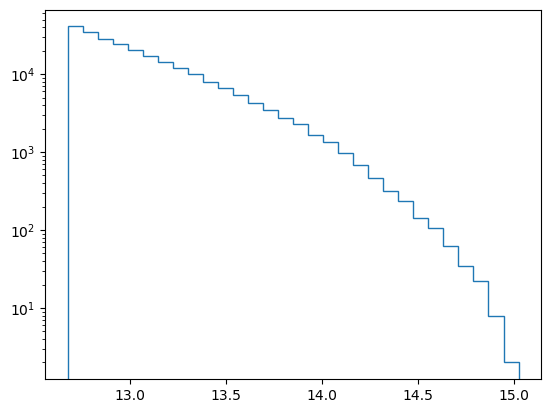

In [86]:
plt.hist(np.log10(hmass), bins=30, histtype='step', log=True);

### Check power spectrum

In [212]:
def cat2pk(ipos, Lbox, grid, MAS):
    # density field parameters
    verbose = True   #print information on progress

    delta = np.zeros((grid,grid,grid), dtype=np.float32)

    MASL.MA(ipos.astype(np.float32), delta, Lbox, MAS, verbose=verbose)

    delta /= np.mean(delta, dtype=np.float64)
    delta -= 1.0

    Pk = PKL.Pk(delta, Lbox, axis=0, MAS=MAS, threads=64)
    k       = Pk.k3D
    Pk0     = Pk.Pk[:,0] #monopole

    return k, Pk0

In [238]:
fnamebase = "/data3/suchen/CosmoGridV1/grid/cosmo_000001/run_0/pkd_halos"
pk_list = []
for i in range(50, 141, 10):
    fname = f"{fnamebase}/CosmoML.00{i:03d}.fofstats.0"
    print(fname)
    hpos = get_pkd_halo_attrs(fname, attrs="pos", Lbox=Lbox)
    k, pk = cat2pk(hpos[0], Lbox, grid=256, MAS="CIC")
    pk_shot = (Lbox**3/len(hpos[0]))
    pk_list.append(pk-pk_shot)

/data3/suchen/CosmoGridV1/grid/cosmo_000001/run_0/pkd_halos/CosmoML.00050.fofstats.0

Using CIC mass assignment scheme
Time taken = 0.000 seconds


Computing power spectrum of the field...
Time to complete loop = 0.71
Time taken = 0.78 seconds
/data3/suchen/CosmoGridV1/grid/cosmo_000001/run_0/pkd_halos/CosmoML.00060.fofstats.0

Using CIC mass assignment scheme
Time taken = 0.000 seconds


Computing power spectrum of the field...
Time to complete loop = 0.71
Time taken = 0.79 seconds
/data3/suchen/CosmoGridV1/grid/cosmo_000001/run_0/pkd_halos/CosmoML.00070.fofstats.0

Using CIC mass assignment scheme
Time taken = 0.002 seconds


Computing power spectrum of the field...
Time to complete loop = 0.71
Time taken = 0.79 seconds
/data3/suchen/CosmoGridV1/grid/cosmo_000001/run_0/pkd_halos/CosmoML.00080.fofstats.0

Using CIC mass assignment scheme
Time taken = 0.071 seconds


Computing power spectrum of the field...
Time to complete loop = 0.71
Time taken = 0.79 seconds
/data3/suchen/CosmoGridV

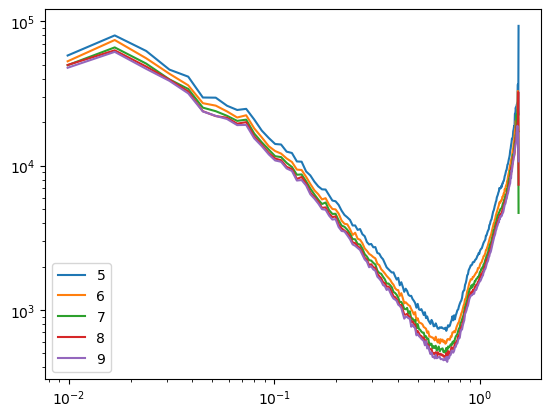

In [251]:
for idx in range(5, len(pk_list)):
    plt.loglog(k, pk_list[idx], label=f"{idx}")

plt.legend()

In [345]:
filename = "/data3/suchen/CosmoGridV1/grid/cosmo_000002/run_0/param_files/CosmoML.log"
log = np.loadtxt(filename)
zlist = log[:,1]

In [577]:
len(zlist)

141

In [578]:
np.arange(1,141)

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140])

In [581]:
np.savetxt("/data3/suchen/CosmoGridV1/label_z_table.txt", np.c_[np.arange(141), zlist], fmt="%d %.4f")

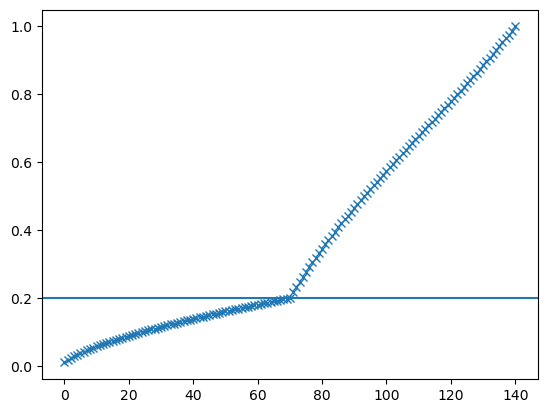

In [346]:
plt.plot(1./(1+zlist), 'x')
plt.axhline(0.2)

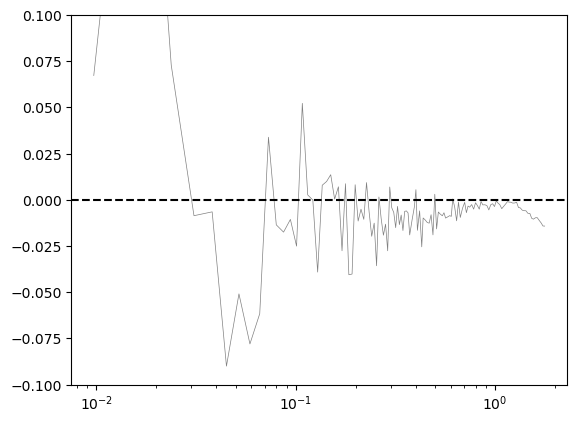

In [575]:
for i in range(120,121):
    filename = f"/data3/suchen/CosmoGridV1/grid/cosmo_{cosmo_label}/run_0/pkd_spectra/CosmoML.00{i:03d}.pk"
    tmp = np.loadtxt(filename)
    k = tmp[:,0]
    pk = tmp[:,1]
    pk_th = ccl.nonlin_matter_power(a=1./(1+zlist[i]),cosmo=cosmo_ccl, k=k*cosmo_par["H0"]/100)
    plt.semilogx(k, pk/(pk_th*(cosmo_par["H0"]/100)**3)-1, lw=0.5, c='grey')

plt.ylim(-0.1,0.1)
plt.axhline(0, c='k', ls='--')

### Make Lightcone

In [11]:
def radial_dist(pos):
    return np.linalg.norm(pos, axis=1)

def box_recenter(pos, center, boxsize):
    local_pos = ((pos-np.array(center)*boxsize)+boxsize) % boxsize
    return local_pos
    
def cut_shell_one_box(pos, gid, boxsize, shift, rmin, rmax):
    local_pos = (pos + boxsize) % boxsize
    local_pos += shift*boxsize
    
    cut = ((radial_dist(local_pos)>rmin)&(radial_dist(local_pos)<rmax))
    local_pos = local_pos[cut]
    local_gid = gid[cut]
    del cut
    
    return np.c_[local_pos, local_gid]

def search_cross_box(boxsize, radius):
    nmax = int(np.ceil(radius/boxsize))
    search_indice_1d = np.arange(nmax)
    search_indice = np.array(np.meshgrid(search_indice_1d, search_indice_1d, search_indice_1d)).T.reshape(-1,3)
    nearest_dist_sq = np.sqrt(np.sum(search_indice**2, axis=1))
    farest_dist_sq  = np.sqrt(np.sum((search_indice+1)**2, axis=1))
    choice = ((nearest_dist_sq<radius/boxsize)&(farest_dist_sq>radius/boxsize))
    search_indice = search_indice[choice]

    search_indice = search_indice.astype(float) + 0.5
    signs = np.array(np.meshgrid([-1, 1], [-1, 1], [-1, 1])).T.reshape(-1, 3)
    expand_indice = (search_indice[:, None, :]*signs[None, :, :]).reshape(-1, 3)
    unique_indice = np.unique(expand_indice, axis=0)
    unique_indice = (np.floor(unique_indice-0.5)).astype(int)
    
    return unique_indice

def get_cross_box_indice(boxsize, chi_min, chi_max):
    indice_min = search_cross_box(boxsize, chi_min)
    indice_max = search_cross_box(boxsize, chi_max)
    indice_all = np.unique(np.vstack((indice_min, indice_max)), axis=0)

    return indice_all

In [12]:
def make_lightcone_tiles(position, boxsize, chi_min, chi_max, ctr=[0,0,0]):
    shift_list = get_cross_box_indice(boxsize, chi_min, chi_max)
    pos_rectr = box_recenter(position, ctr, boxsize)
    gid = np.arange(len(position)) # Global ID of each tracer, start from 0
    
    lightcone = []
    for idx in range(len(shift_list)):
        tmp = cut_shell_one_box(pos_rectr, gid, boxsize, shift_list[idx], chi_min, chi_max)
        lightcone.append(tmp)
    lightcone = np.vstack(lightcone)

    return lightcone

In [13]:
def cat2shell(pos, Nside, coord="cart"):
    if coord == "cart":
        if pos.shape[1] != 3:
            raise ValueError("Cartesian coordinate must have 3 components!")
        part_pix = hp.vec2pix(Nside, pos[:,0], pos[:,1], pos[:,2])
    if coord == "sph":
        if pos.shape[1] != 2:
            raise ValueError("Spherical coordinate must have 2 components!")
        part_pix = hp.ang2pix(Nside, pos[:,0], pos[:,1], lonlat=False)
    if coord == "lonlat":
        if pos.shape[1] != 2:
            raise ValueError("RADEC coordinate must have 2 components!")
        part_pix = hp.ang2pix(Nside, pos[:,0], pos[:,1], lonlat=True)
        
    shell = np.zeros(12*Nside**2).astype(np.int64)
    np.add.at(shell, part_pix, 1)

    return shell

#### test single map

In [14]:
log_fname = f"/data3/suchen/CosmoGridV1/grid/cosmo_{cosmo_label}/run_0/param_files/CosmoML.log"
log = np.loadtxt(log_fname)
zlist = log[:,1]

In [182]:
# Dark Matter

In [10]:
mshell_fname = f"/data3/suchen/CosmoGridV1/grid/cosmo_{cosmo_label}/run_0/shells_nside=512.npz"

In [11]:
shell_n512 = np.load(mshell_fname)

In [12]:
shell_n512['shell_info'][20]

('CosmoML-shell_z-high=0.3210129_z-low=0.302342.fits', 20, 0.302342, 0.3210129, 858.2926, 907.6051, 883.0076)

In [13]:
shell0 = shell_n512['shells'][20]

In [14]:
cl_mm = hp.anafast(shell0/np.mean(shell0))

In [181]:
### HALO

In [15]:
halo_fbase = f"/data3/suchen/CosmoGridV1/grid/cosmo_{cosmo_label}/run_0/pkd_halos"

In [101]:
test_label = 120
# t_z = zlist[test_label]
# t_z_before = zlist[test_label-1]
t_z = 0.2
t_z_before = 0.4
print(t_z, t_z_before)
t_halo_pos = get_pkd_halo_attrs(fname=f"{halo_fbase}/CosmoML.{test_label:05d}.fofstats.0", attrs="pos", Lbox=Lbox)
t_chi_min = ccl.comoving_radial_distance(a=1./(1+t_z), cosmo=cosmo_ccl)*cosmo_par["H0"]/100.
t_chi_max = ccl.comoving_radial_distance(a=1./(1+t_z_before), cosmo=cosmo_ccl)*cosmo_par["H0"]/100.
t_halo_cone = make_lightcone_tiles(t_halo_pos, boxsize=Lbox, chi_min=t_chi_min, chi_max=t_chi_max)

0.2 0.4


#### Test replication

In [116]:
gal_pos_box = np.loadtxt("catalogs/HOD/cosmo_000001_run_0_HOD_0_run_0_snap.txt")

In [117]:
t_z = 0.2
t_z_before = 0.4
Lbox = 900.

t_chi_min = ccl.comoving_radial_distance(a=1./(1+t_z), cosmo=cosmo_ccl)*cosmo_par["H0"]/100.
t_chi_max = ccl.comoving_radial_distance(a=1./(1+t_z_before), cosmo=cosmo_ccl)*cosmo_par["H0"]/100.

galcone = make_lightcone_tiles(gal_pos_box, boxsize=Lbox, chi_min=t_chi_min, chi_max=t_chi_max)

In [158]:
np.save("aux/galcone.npy", galcone)

In [138]:
galcone_ra, galcone_dec = hp.vec2ang(galcone[:,:-1], lonlat=True)
galcone_id = galcone[:,-1]

In [193]:
def get_repeat_ratio(galcone_id):
    # galcone_id = galcone[:,-1]
    repeat_ratio = len(np.unique(galcone_id))/len(galcone_id)
    return 1-repeat_ratio

In [185]:
get_repeat_ratio(galcone_id)

0.8527822956649969

In [122]:
m = pymangle.Mangle("catalogs/masks/mask_DR12v5_CMASSLOWZTOT_North.ply")

In [142]:
%%time
mask = m.contains(galcone_ra, galcone_dec)
weights = m.weight(galcone_ra[mask], galcone_dec[mask])

select = (weights > 0)

CPU times: user 2.04 s, sys: 16.6 ms, total: 2.05 s
Wall time: 2.05 s


In [194]:
get_repeat_ratio(galcone_id[mask][select])

0.34773404373678807

In [147]:
from scipy.spatial.transform import Rotation as R

In [198]:
# rot = R.from_euler('zyx', np.random.rand(3)*360, degrees=True)
rot = R.random()
rot2 = R.from_euler('zyx', rot.as_euler('zyx', degrees=True), degrees=True)
positions = hp.ang2vec(galcone_ra, galcone_dec, lonlat=True)
positions_rot = rot.apply(positions)
galcone_ra_rot, galcone_dec_rot = hp.vec2ang(positions_rot, lonlat=True)

In [202]:
positions = hp.ang2vec(galcone_ra, galcone_dec, lonlat=True)
positions_rot = rot2.apply(positions)
galcone_ra_rot, galcone_dec_rot = hp.vec2ang(positions_rot, lonlat=True)

In [203]:
%%time
mask = m.contains(galcone_ra_rot, galcone_dec_rot)
weights = m.weight(galcone_ra_rot[mask], galcone_dec_rot[mask])

select = (weights > 0)

CPU times: user 1.92 s, sys: 1.02 ms, total: 1.92 s
Wall time: 1.91 s


In [204]:
get_repeat_ratio(galcone_id[mask][select])

0.32099517307292247

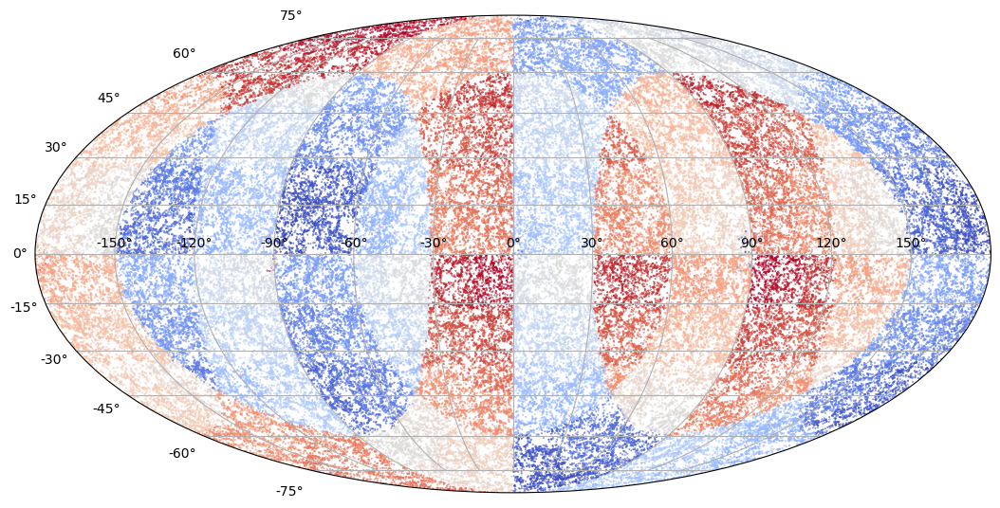

In [23]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.scatter(np.deg2rad(180-ra_rot), np.deg2rad(dec_rot), s=0.1, alpha=1, c=t_halo_cone[:,-1], cmap='coolwarm')
ax.grid()

In [24]:
m = pymangle.Mangle("catalogs/masks/mask_DR12v5_CMASSLOWZTOT_North.ply")

In [25]:
mask = m.contains(t_halo_cone_ra, t_halo_cone_dec)

In [26]:
weights = m.weight(t_halo_cone_ra[mask], t_halo_cone_dec[mask])

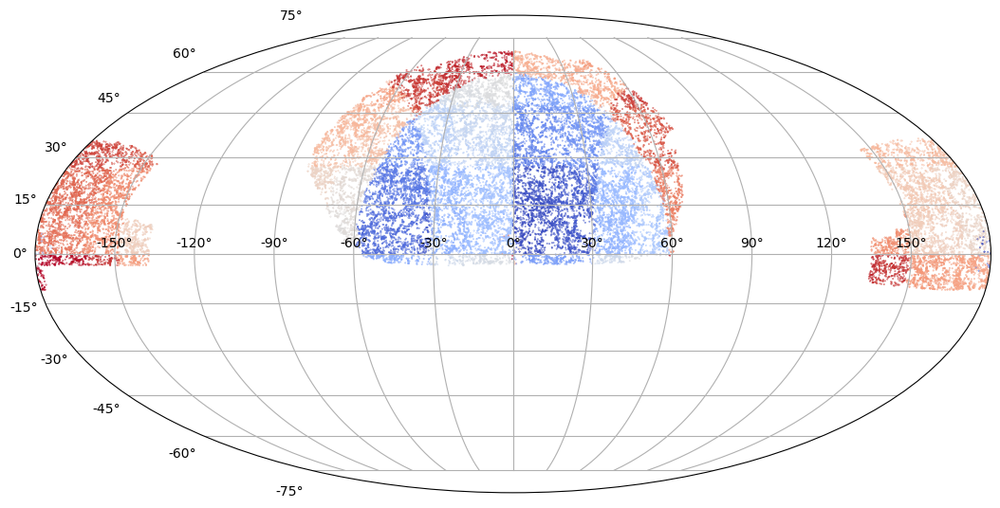

In [27]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.scatter(np.deg2rad(180-t_halo_cone_ra[mask]), np.deg2rad(t_halo_cone_dec[mask]), s=0.1, alpha=1, c=t_halo_cone[mask,-1], cmap='coolwarm')
ax.grid()

In [32]:
len(np.unique(t_halo_cone[mask,-1]))/np.sum(mask)

0.9676577986437142

In [131]:
mask2 = m.contains(ra_rot, dec_rot)

In [133]:
len(np.unique(t_halo_cone[mask2,-1]))/np.sum(mask2)

0.9658162073797291

In [334]:
results_type = np.dtype([
    ('euler_zyx', 'f4', 3),
    ('repeat_ratio', 'f4')
])
results = np.loadtxt("aux/tried_LOS_repeat_ratio.txt", dtype=results_type)

In [335]:
results['repeat_ratio'].min(), results[results['repeat_ratio'].argmin()]['euler_zyx']

(0.23202, array([122.249,  16.277,  57.834], dtype=float32))

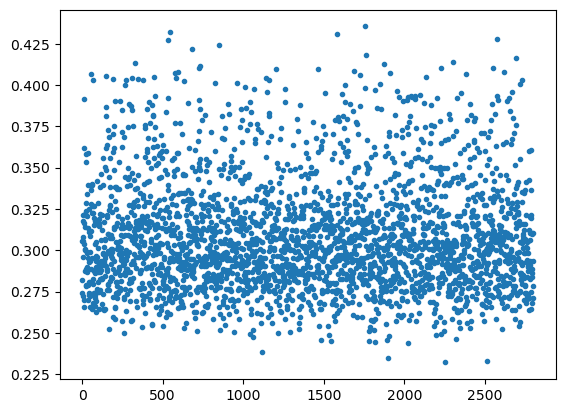

In [337]:
plt.plot(results["repeat_ratio"], '.')

In [344]:
select = results['repeat_ratio']<0.25
np.sum(select)

18

In [339]:
ref_point = np.array([0,1,0])
rot_points = []
for euler_ang in results['euler_zyx']:
    rot = R.from_euler('zyx', euler_ang, degrees=True)
    rot_points.append(rot.apply(ref_point))

rot_points = np.vstack(rot_points)

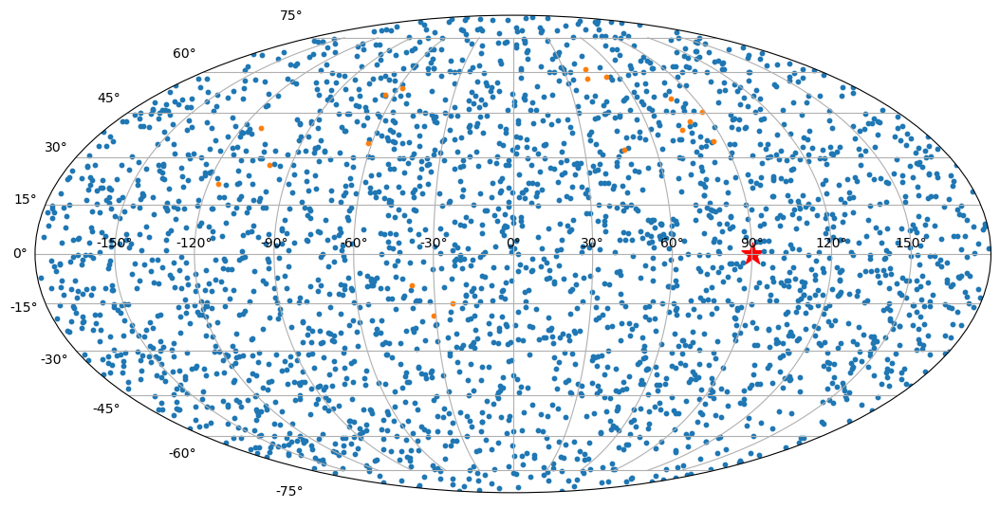

In [345]:
ref_point_ra, ref_point_dec = hp.vec2ang(ref_point, lonlat=True)
rot_points_ra, rot_points_dec = hp.vec2ang(rot_points, lonlat=True)
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.scatter(np.deg2rad(180-ref_point_ra), np.deg2rad(ref_point_dec), s=300, alpha=1, marker='*', c='r')
ax.scatter(np.deg2rad(180-rot_points_ra[~select]), np.deg2rad(rot_points_dec[~select]), s=10, alpha=1,)
ax.scatter(np.deg2rad(180-rot_points_ra[select]), np.deg2rad(rot_points_dec[select]), s=10, alpha=1,)
ax.grid()

#### Old results

In [29]:
t_halo_pos_structed = np.empty(len(t_halo_pos), dtype=np.dtype([("pos", "f4", 3)]))

In [30]:
t_halo_pos_structed["pos"] = t_halo_pos

In [31]:
len(t_halo_pos)/Lbox**3*1000

0.2908093278463649

In [32]:
len(t_halo_cone)/(4./3.*np.pi*(t_chi_max**3 - t_chi_min**3))*1000

0.28735579485446056

In [25]:
t_halo_shell = cat2shell(t_halo_cone, Nside=512, coord="cart")

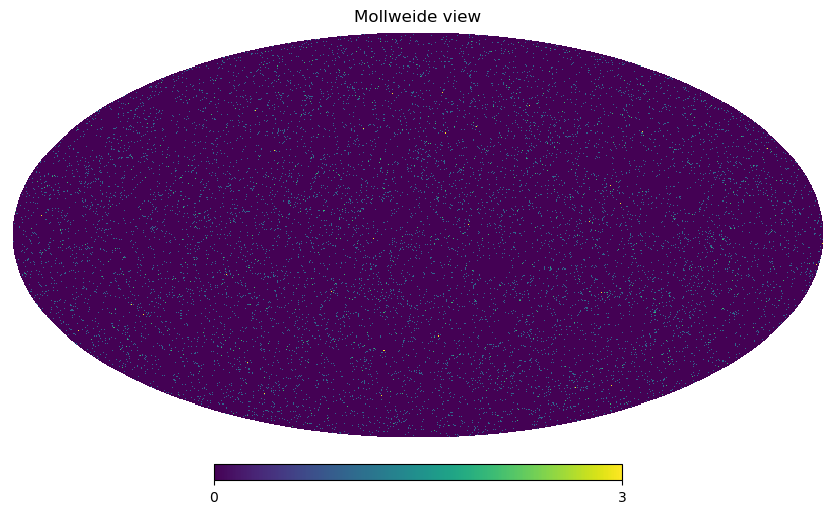

In [100]:
hp.mollview(t_halo_shell)

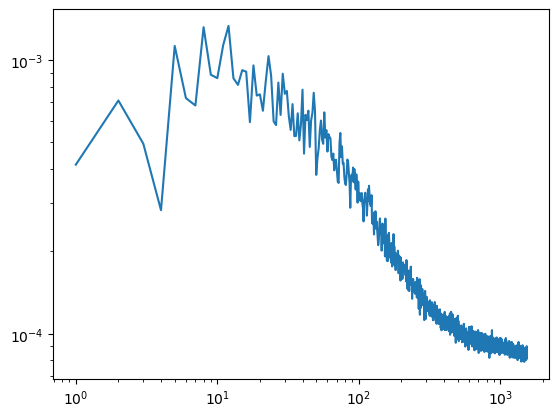

In [73]:
t_cl_hh = hp.anafast(t_halo_shell/np.mean(t_halo_shell))
plt.loglog(np.arange(1,len(t_cl_hh)), t_cl_hh[1:])

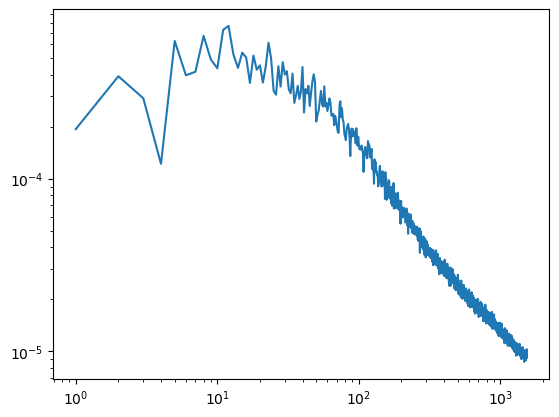

In [75]:
t_cl_hm = hp.anafast(t_halo_shell/np.mean(t_halo_shell), shell0/np.mean(shell0))
plt.loglog(np.arange(1,len(t_cl_hm)), t_cl_hm[1:])

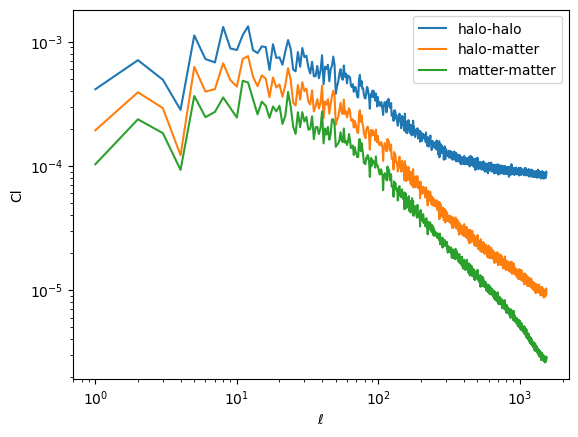

In [77]:
plt.loglog(np.arange(1,len(t_cl_hh)), t_cl_hh[1:], label="halo-halo")
plt.loglog(np.arange(1,len(t_cl_hm)), t_cl_hm[1:], label="halo-matter")
plt.loglog(np.arange(1,len(cl_mm)), cl_mm[1:], label="matter-matter")
plt.xlabel(r"$\ell$")
plt.ylabel("Cl")
plt.legend();

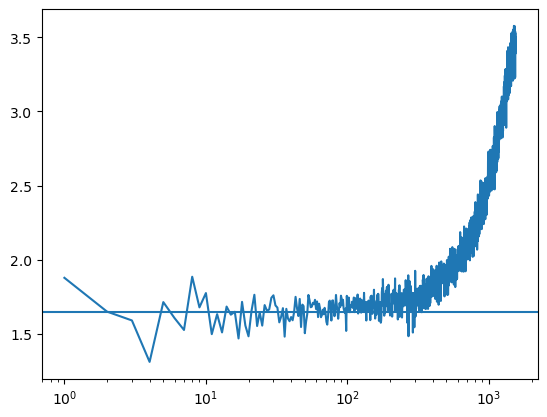

In [82]:
plt.semilogx(np.arange(1,len(t_cl_hm)), t_cl_hm[1:]/cl_mm[1:])
plt.axhline(1.65)

In [61]:
prof_halo = np.load(f"/data3/suchen/CosmoGridV1/grid/cosmo_{cosmo_label}/run_0/Halofile_MinParts=100.npz")

In [62]:
pick_labels = np.argwhere(prof_halo['halos']['shell_id'] == 20)

In [63]:
prof_halo['shell_info'][20]

('CosmoML-shell_z-high=0.3210129_z-low=0.302342.fits', 20, 0.302342, 0.3210129, 858.2926, 907.6051, 883.0076)

In [197]:
pick_labels.shape

(74541, 1)

In [198]:
%%time
prof_halo_x = prof_halo['halos']['x'][pick_labels]
prof_halo_y = prof_halo['halos']['y'][pick_labels]
prof_halo_z = prof_halo['halos']['z'][pick_labels]

CPU times: user 27.5 s, sys: 2.66 s, total: 30.1 s
Wall time: 30.1 s


In [200]:
prof_halo_pos = np.c_[prof_halo_x, prof_halo_y, prof_halo_z]

In [201]:
len(prof_halo_pos)/(4./3.*np.pi*(443.9217**3 - 400.90497**3))*1000

0.7721426802646928

In [205]:
tmp = get_pkd_halo_attrs(fname=f"{halo_fbase}/CosmoML.00129.fofstats.0", attrs="pos", Lbox=Lbox)
len(tmp)/Lbox**3*1000

0.31153909465020574

In [168]:
prof_halo_shell = cat2shell(prof_halo_pos/1000., Nside=512, coord='cart')

In [170]:
prof_cl_hh = hp.anafast(prof_halo_shell/np.sum(prof_halo_shell))

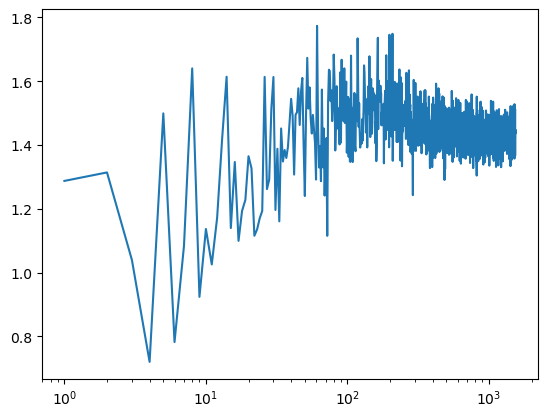

In [180]:
plt.semilogx(np.arange(1,len(t_cl_hh)), t_cl_hh[1:]/prof_cl_hh[1:], label="halo-halo")

In [35]:
## kappa shear

In [30]:
shear_fname = "/data3/suchen/CosmoGridV1/raytracing/cosmo_000001/nside0512/raytracing_z1.00_nufft.hdf5"

In [33]:
with h5py.File(shear_fname, "r") as f:
    A = np.array(f["Distortion_matrix"]["Raytraced"])
    #kappa_born = np.array(f["Distortion_matrix"]["Kappa_born"])
kappa = -(A[0][0] + A[1][1]) / 2 + 1
omega_ray = (A[0][1] - A[1][0]) / 2
gamma1 = -(A[0][0] - A[1][1]) / 2
gamma2 = -(A[0][1] + A[1][0]) / 2

In [68]:
cl_hk = hp.anafast(t_halo_shell/np.mean(t_halo_shell), kappa)

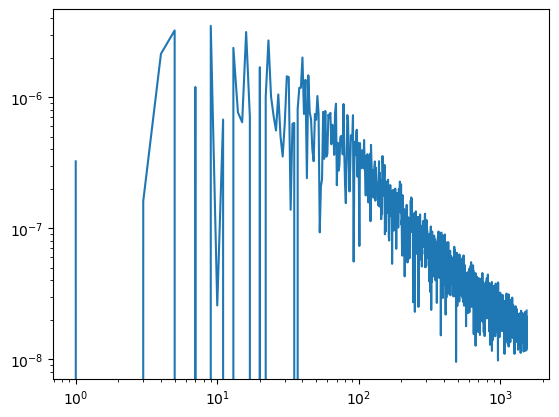

In [69]:
plt.loglog(np.arange(1,len(cl_hk)), cl_hk[1:])

In [64]:
z_range = np.linspace(0,1.2,128)
dndz_lens = np.heaviside(z_range-0.302342,0) - np.heaviside(z_range-0.3210129,0)
dndz_srcs = np.heaviside(z_range-0.99,0) - np.heaviside(z_range-1.01,0)

In [65]:
lens = ccl.NumberCountsTracer(cosmo=cosmo_ccl, dndz=(z_range, dndz_lens), bias=(z_range, np.ones_like(z_range)), has_rsd=False)
srcs = ccl.WeakLensingTracer(cosmo=cosmo_ccl, dndz=(z_range, dndz_srcs))

In [66]:
cl_hk_th = ccl.angular_cl(cosmo_ccl, lens, srcs, np.arange(1, len(cl_hk)))

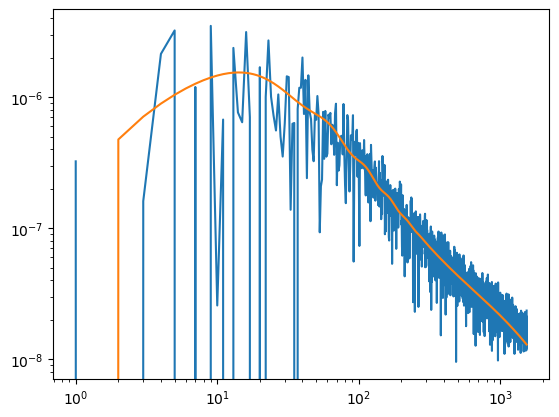

In [83]:
plt.loglog(np.arange(1, len(cl_hk)), cl_hk[1:])
plt.loglog(np.arange(1, len(cl_hk)), cl_hk_th*1.65)

In [102]:
!ls

demo.ipynb  halo_pos.txt  pixi.lock  pixi.toml


In [105]:
! ~/applications/DIVE/DIVE -i halo_pos.txt -o void.txt -u 900

Reading file: halo_pos.txt
Number of input objects: 240559

Building periodic Delaunay Triangulation ...
Number of cells: 1629173

Writing to file: void.txt
DIVE finished successfully


In [106]:
dive_void_type = np.dtype([
    ("pos", ("f4", 3)),
    ("Rv", "f4")
])

In [107]:
t_void_info = np.loadtxt("void.txt", dtype=dive_void_type)

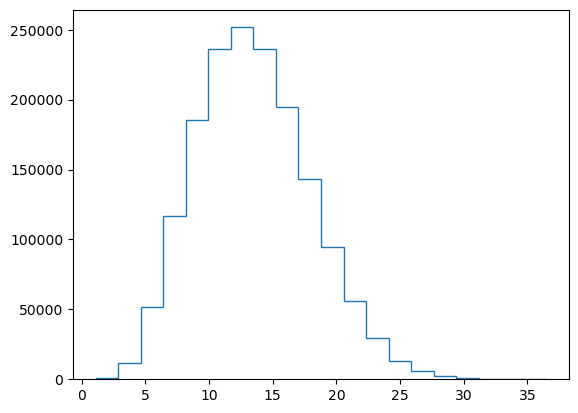

In [113]:
plt.hist(t_void_info["Rv"], bins=20, histtype="step");

In [136]:
rv_mins = np.arange(15, 25, 1)
rv_maxs = np.arange(16, 26, 1)

t_large_void_cone_list = []
for ibin in range(len(rv_mins)):
    cut = ((t_void_info["Rv"]>rv_mins[ibin]) & (t_void_info["Rv"]<rv_maxs[ibin]))
    tmp = make_lightcone_tiles(t_void_info["pos"][cut], Lbox, t_chi_min, t_chi_max, ctr=[0,0,0])
    t_large_void_cone_list.append(tmp)

### Lensing Measurement

In [141]:
def write_to_swot_type_ascii(output, ftracer_lightcone, cosmo, ra_cut=[0,360], dec_cut=[-90,90]):
    ftracer_ra, ftracer_dec = hp.vec2ang(ftracer_lightcone, lonlat=True)
    ftracer_chi = np.linalg.norm(ftracer_lightcone, axis=1)
    print(ftracer_chi.min(), ftracer_chi.max())
    h = cosmo.to_dict()["h"]
    ftracer_z = 1./ccl.scale_factor_of_chi(cosmo, ftracer_chi/h) - 1

    cut1 = (ftracer_ra > ra_cut[0]) & (ftracer_ra < ra_cut[1])
    cut2 = (ftracer_dec > dec_cut[0]) & (ftracer_dec < dec_cut[1])
    cut = cut1 & cut2

    num_tot = len(ftracer_ra[cut])
    print(num_tot)
    np.savetxt(output, np.c_[ftracer_ra[cut], ftracer_dec[cut], ftracer_z[cut], np.ones(num_tot)*0.001])
    
    return None

In [138]:
def uniform_spherical_sampling(N, lonlat=True):
    indices = np.arange(0, N, dtype=float) + 0.5
    theta = np.arccos(1 - 2 * indices / N)  # Polar angle
    phi = 2 * np.pi * indices / N          # Azimuthal angle

    if lonlat:
        dec = np.rad2deg(theta)
        ra  = np.rad2deg(phi)
        dec = 90. - dec
        return ra, dec
    else:
        return theta, phi

def uniform_spherical_random_sampling(N, seed=None, lonlat=True):
    rng = np.random.default_rng(seed=seed)
    phi = rng.uniform(0, 2 * np.pi, N)

    cos_theta = rng.uniform(-1, 1, N)

    theta = np.arccos(cos_theta)

    if lonlat:
        dec = np.rad2deg(theta)
        ra  = np.rad2deg(phi)
        dec = 90. - dec
        return ra, dec
    else:
        return theta, phi

In [130]:
def construct_background_galaxies(Ngal, redshift, sigma_redshift, g1_map, g2_map, weight=None, interp="bilinear", sigma_n=None, seed=None):
    if len(g1_map) != len(g2_map):
        raise ValueError(f"Sizes of input gamma1 map ({len(g1_map)}) and gamma2 map ({len(g2_map)}) do not match!")
    nside = hp.npix2nside(len(g1_map))
    gal_cat = np.empty((Ngal,), dtype=bgal_type)
    gal_cat["ra"], gal_cat["dec"] = uniform_spherical_random_sampling(Ngal, lonlat=True)
    gal_cat["z"] = redshift
    gal_cat["sigz"] = sigma_redshift
    if interp == "ngp":
        gal_pix = hp.ang2pix(nside, gal_cat["ra"], gal_cat["dec"], lonlat=True)
        gal_cat["g1"]  = g1_map[gal_pix]
        gal_cat["g2"]  = g2_map[gal_pix]
    if interp == "bilinear":
        gal_cat["g1"]  = hp.get_interp_val(g1_map, gal_cat["ra"], gal_cat["dec"], lonlat=True)
        gal_cat["g2"]  = hp.get_interp_val(g2_map, gal_cat["ra"], gal_cat["dec"], lonlat=True)

    if sigma_n is not None:
        rng = np.random.default_rng(seed=seed)
        n1n2 = rng.normal(loc=0, scale=sigma_n, size=(len(gal_cat),2))
        n_complex = n1n2[:,0] + n1n2[:,1]*1j
        del n1n2
        g_complex = gal_cat["g1"] + gal_cat["g2"]*1j
        e_complex = (g_complex + n_complex) / (1 + n_complex*np.conj(g_complex))
        gal_cat["g1"] = np.real(e_complex)
        gal_cat["g2"] = np.imag(e_complex)

    if weight is None :
        gal_cat["w"] = np.ones((Ngal,))
    else:
        gal_cat["w"] = weight
    return gal_cat

In [131]:
Ngal = 1_000_000
gal_cat = construct_background_galaxies(Ngal, np.ones(Ngal)*1.0, np.ones(Ngal)*0.001, gamma1, gamma2, interp="bilinear") # , sigma_n=0.288, seed=8861

In [132]:
gal_cat['g1'] = -gal_cat['g1']
np.savetxt('bg_gal_flip_g1.txt', gal_cat)
gal_cat['g1'] = -gal_cat['g1']

In [143]:
for ibin, t_large_void_cone in enumerate(t_large_void_cone_list):
    write_to_swot_type_ascii(f"fore_void_bin{ibin}.txt", t_large_void_cone, cosmo=cosmo_ccl) # , ra_cut=[0,90.], dec_cut=[0,90]

858.2927536156869 907.6043770943628
79601
858.2935374859848 907.6038072308188
69488
858.2934887189821 907.6037357723167
58599
858.2926877593858 907.60380284396
47397
858.2927282722155 907.6049945533629
37983
858.2958286753279 907.6040903748938
28242
858.293014587336 907.598537728087
20677
858.2936526061197 907.604622705439
14455
858.3087028962052 907.604967078891
9812
858.2988437130961 907.601796884977
5762


In [177]:
for i in range(10):
    rv_mean = 0.5*(rv_mins[i]+rv_maxs[i])
    fo = open(f"cfgs/gglens_bin{i}.para", "w+")
    with open("/home/suchen/applications/swot/etc/gglens.para", "r") as f:
        for line in f.readlines():
            if line.split(" ")[0] == "data1":
                fo.write(f"data1          catalogs/LCone/foreground/fore_void_bin{i}.txt\n")
            elif line.split(" ")[0] == "data2":
                fo.write("data2          catalogs/LCone/background/bg_gal_flip_g1.txt\n")
            elif line.split(" ")[0] == "range":
                fo.write("range          {:.2f},{:.1f}\n".format(rv_mean*0.1/cosmo_par["H0"]*100, rv_mean*3/cosmo_par["H0"]*100))
            elif line.split(" ")[0] == "nbins":
                fo.write("nbins          30	 # Number of bins\n")
            elif line.split(" ")[0] == "out":
                fo.write(f"out            results/vlens/corr_bin{i}.out\n")
            else:
                fo.write(line)
    fo.close()

In [146]:
!mpirun -np 32 /home/suchen/applications/swot/bin/swot -c gglens_bin1.para

Reading sources file...(1000000 sources found).
Reading lenses file....(69488 lenses found).
Resampling...sending data...building trees...done.
Correlating lenses with sources...100.00%
swot: elapsed time: 72.16 s


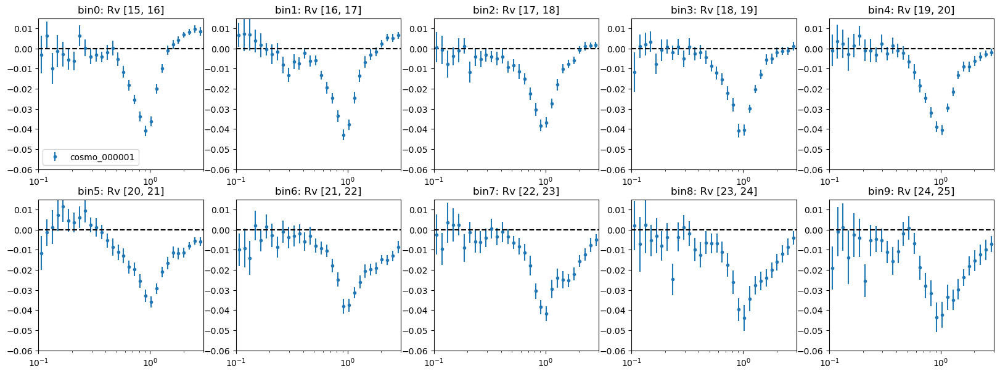

In [168]:
fig = plt.figure(figsize=(20,7))
rv_mins = np.arange(15, 25)
rv_maxs = np.arange(16, 26)

h = cosmo_par["H0"]/100.
for i in range(10):
    ax = fig.add_subplot(2,5,i+1)
    rv_mean = 0.5*(rv_mins[i]+rv_maxs[i])
    ax.set_title(f"bin{i}: Rv [{rv_mins[i]}, {rv_maxs[i]}]")
    
    tmp = np.loadtxt(f"results/vlens/corr_bin{i}.out", dtype=swot_output_type)
    if i == 0:
        r = tmp["Rp"]/rv_mean*h

    ax.errorbar(tmp["Rp"]/rv_mean*h, tmp["SigR"]/rv_mean/h, tmp["errjk"]/rv_mean/h, fmt='.', label="cosmo_000001")
    
    ax.set_ylim(-0.06, 0.015)
    ax.set_xlim(0.1,3)
    ax.set_xscale('log')

    if i == 0:
        ax.legend()
    
    plt.axhline(0.0, c='k', ls='--')

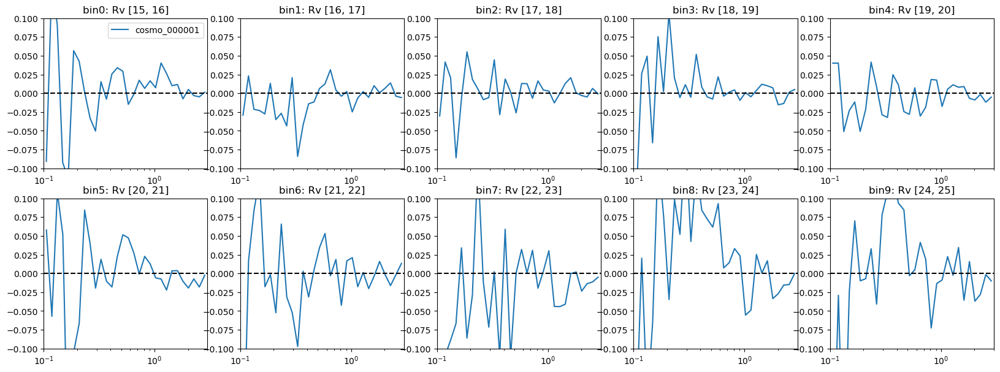

In [172]:
fig = plt.figure(figsize=(20,7))

rv_mins = np.arange(15, 25)
rv_maxs = np.arange(16, 26)

h = cosmo_par["H0"]/100.
for i in range(10):
    ax = fig.add_subplot(2,5,i+1)
    rv_mean = 0.5*(rv_mins[i]+rv_maxs[i])
    ax.set_title(f"bin{i}: Rv [{rv_mins[i]}, {rv_maxs[i]}]")
    
    tmp = np.loadtxt(f"results/vlens/corr_bin{i}.out", dtype=swot_output_type)
    if i == 0:
        r = tmp["Rp"]/rv_mean*h

    ax.semilogx(tmp["Rp"]/rv_mean*h, tmp["e2"], label="cosmo_000001")
    
    ax.set_ylim(-0.1, 0.1)
    ax.set_xlim(0.1,3)
    ax.set_xscale('log')

    if i == 0:
        ax.legend()
    
    plt.axhline(0.0, c='k', ls='--')

# fig.savefig(f"{hfinder}_L1000_N1024.png", dpi=400)

### BOSS LOWZ CMASS data & mock

#### Load BOSS LOWZ data

In [ ]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_LOWZ_North.fits"
hdu = fits.open(fname)
ngal = hdu[1].header['NAXIS2']

cattype = np.dtype([
    ('ra', 'f4'),
    ('dec', 'f4'), 
    ('z', 'f4')
])

catalog = np.empty((ngal,), dtype=cattype)
catalog['ra'] = hdu[1].data['RA']
catalog['dec'] = hdu[1].data['DEC']
catalog['z'] = hdu[1].data['Z']

cut = (catalog['z'] > 0.2) & (catalog['z'] < 0.43)
cat_cut = catalog[cut]

#### Generate Void catalog of BOSS LOWZ data

In [515]:
def Sph2Cart(cosmo:ccl.Cosmology, ra:np.ndarray, dec:np.ndarray, redshift:np.ndarray):
    dist = ccl.comoving_radial_distance(cosmo, a=1./(1+redshift))*cosmo_fid.to_dict()["h"]
    norm_pos = hp.ang2vec(ra, dec, lonlat=True)
    pos = norm_pos.T * dist
    pos = pos.T
    return pos

def Cart2Sph(cosmo:ccl.Cosmology, pos:np.ndarray):
    chi = np.linalg.norm(pos, axis=1) # Mpc/h
    print(chi.min(), chi.max())
    redshift = ccl.scale_factor_of_chi(cosmo, chi=chi/cosmo.to_dict()["h"]) # scale factor a
    redshift = 1./redshift - 1 
    ra, dec = hp.vec2ang(pos, lonlat=True)

    return np.c_[ra, dec, redshift]

In [215]:
ra_min = cat_cut['ra'].min()
ra_max = cat_cut['ra'].max()
dec_min = cat_cut['dec'].min()
dec_max = cat_cut['dec'].max()

In [209]:
gmap2 = cat2shell(np.c_[catalog['ra'][cut], catalog['dec'][cut]], Nside=512, coord="lonlat")

In [487]:
gal_pos_cart = Sph2Cart(cosmo_fid, cat_cut['ra'], cat_cut['dec'], cat_cut['z'])

In [497]:
ccl.comoving_radial_distance(cosmo_fid, a=1./(1.2))*cosmo_fid.to_dict()["h"]-ccl.comoving_radial_distance(cosmo_fid, a=1./(1.43))*cosmo_fid.to_dict()["h"]

-582.4590308729619

In [490]:
np.savetxt("/home/suchen/Program/CosmoGrid/catalogs/BOSS_LOWZ/gal_pos.txt", gal_pos_cart, fmt="%.3f %.3f %.3f")

In [495]:
void_pos_cat = np.loadtxt("/home/suchen/Program/CosmoGrid/catalogs/BOSS_LOWZ/void_pos.txt")

In [503]:
non_phsical = void_pos_cat[:,-1] > 40
np.sum(non_phsical)

29778

In [506]:
np.sum(non_phsical)/len(void_pos_cat)

0.020541382490640903

In [554]:
void_pos_cat = void_pos_cat[~non_phsical]

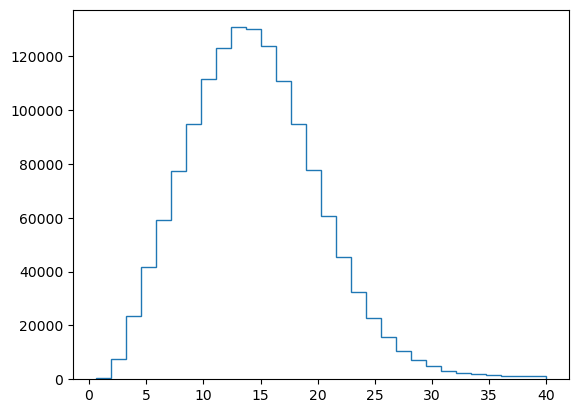

In [567]:
plt.hist(void_pos_cat[:,-1], bins=30, histtype='step');

In [519]:
void_pos_sph = Cart2Sph(cosmo_fid, void_pos_cat[:,:-1])

532.50590970439 1188.1319040657386


In [549]:
zcut = (void_pos_sph[:,2] > 0.2) & (void_pos_sph[:,2] < 0.43)
np.sum(zcut), len(void_pos_sph)

(1409759, 1419881)

In [552]:
vmap2 = cat2shell(np.c_[void_pos_sph[zcut,0], void_pos_sph[zcut,1]], Nside=512, coord="lonlat")

In [569]:
redges = np.arange(15, 27)
for i in range(len(redges)-1):
    rmin = redges[i]
    rmax = redges[i+1]
    radius_cut = (void_pos_cat[:,-1] > rmin) & (void_pos_cat[:,-1] < rmax)
    void_pos_sph = Cart2Sph(cosmo_fid, pos=void_pos_cat[radius_cut,:-1])
    redshift_cut = (void_pos_sph[:,2] > 0.2) & (void_pos_sph[:,2] < 0.43)
    void_pos_sph = void_pos_sph[redshift_cut]
    np.savetxt("catalogs/BOSS_LOWZ/void_radecz_rvbin{}.txt".format(i), void_pos_sph, fmt="%.3f %.3f %.3f")

557.8672557027749 1166.1998382935524
557.6835860876527 1163.7741060692676
554.7891880826604 1165.9583222381675
554.9361642932067 1166.4340515494532
554.1322478575632 1169.3362424090274
552.3434722301606 1170.3723716875586
551.7670036879027 1170.5805413680096
550.7878559159437 1170.9637744142683
549.4686497866146 1174.411142918352
549.5972995670231 1174.0092297979766
546.8704969229975 1175.0767974342073


#### Make BOSS LOWZCMASS-like catalog

In [39]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_CMASSLOWZTOT_North.fits"
boss_lowzcmass = Table.read(fname, format="fits")

In [67]:
zcut = (boss_lowzcmass["Z"] > 0.2) & (boss_lowzcmass["Z"] < 0.33)
boss_lowzcmass = boss_lowzcmass[zcut]

In [80]:
gal_pos_snap = np.loadtxt("catalogs/HOD/cosmo_000001_run_0_HOD_0_run_0_snap.txt")

#### match test

In [81]:
chi_min = ccl.comoving_radial_distance(a=1./(1+0.2), cosmo=cosmo_ccl)*cosmo_par["H0"]/100.
chi_max = ccl.comoving_radial_distance(a=1./(1+0.33), cosmo=cosmo_ccl)*cosmo_par["H0"]/100.

In [83]:
gal_pos_lcone = make_lightcone_tiles(gal_pos_snap, 900., chi_min, chi_max, ctr=[0,0,0])

In [87]:
gal_pos_lcone_ra, gal_pos_lcone_dec = hp.vec2ang(gal_pos_lcone, lonlat=True)

In [126]:
cut = (gal_pos_lcone_ra > 170) & (gal_pos_lcone_ra < 180) & (gal_pos_lcone_dec > 0) & (gal_pos_lcone_dec < 10)
cut2 = (gal_survey2[:,0] > 170) & (gal_survey2[:,1] < 10)

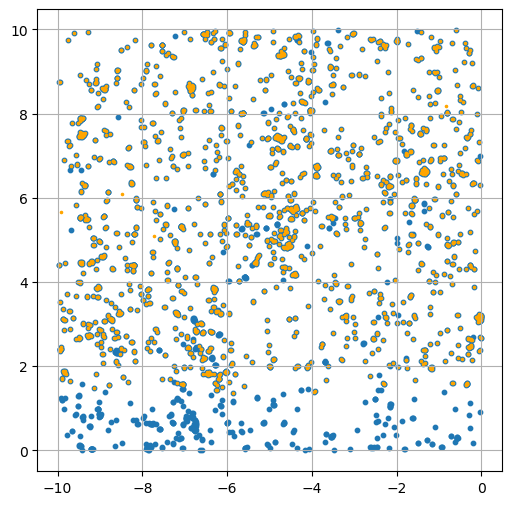

In [121]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot()
ax.grid()
ax.scatter((gal_pos_lcone_ra[cut]-180), (gal_pos_lcone_dec[cut]), s=10)
ax.scatter((gal_survey[cut2][:,0]-180), (gal_survey[cut2][:,1]), s=10, marker='.',c='orange', alpha=1)

In [127]:
cut = (gal_pos_lcone_ra > 180) & (gal_pos_lcone_ra < 190) & (gal_pos_lcone_dec > 0) & (gal_pos_lcone_dec < 10)
cut2 = (gal_survey2[:,0] < 190) & (gal_survey2[:,1] < 10)

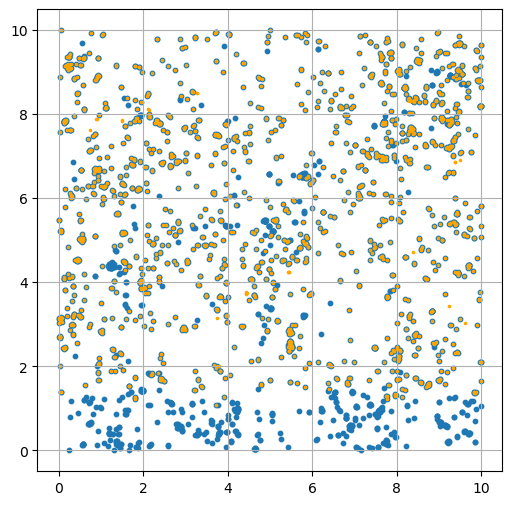

In [128]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot()
ax.grid()
ax.scatter((gal_pos_lcone_ra[cut]-180), (gal_pos_lcone_dec[cut]), s=10)
ax.scatter((gal_survey2[cut2][:,0]-180), (gal_survey2[cut2][:,1]), s=10, marker='.',c='orange', alpha=1)

#### HOD conditioned prior

In [94]:
def corner_lower_triangle(samples:list, param_names=None, figsize=10, bins=30, marked_val=None):
    """
    仅绘制下三角 corner 图：对角线为直方图，i > j 为散点图，i < j 为空

    Parameters:
    - samples: ndarray, shape (N, D)
    - param_names: list of str, 参数名列表（可选）
    - figsize: 图像大小
    - bins: 直方图 bin 数
    """
    n_params = samples[0].shape[1]
    if param_names is None:
        param_names = [f"Param {i+1}" for i in range(n_params)]

    fig, axes = plt.subplots(n_params, n_params, figsize=(figsize, figsize))
    plt.subplots_adjust(wspace=0.05, hspace=0.05)

    for i in range(n_params):
        for j in range(n_params):
            ax = axes[i, j]

            if i < j:
                ax.set_visible(False)  # 上三角隐藏
            elif i == j:
                for isample in samples:
                    ax.hist(isample[:, i], bins=bins, alpha=0.7, histtype='step')
                if i < n_params - 1:
                    ax.set_xticklabels([])
                else:
                    ax.set_xlabel(param_names[i])
                ax.set_yticklabels([])
            else:  # i > j，下三角
                for isample in samples:
                    ax.scatter(isample[:, j], isample[:, i], s=1, alpha=1)
                if marked_val is not None:
                    ax.scatter(marked_val[j], marked_val[i], s=100, marker='*', c='r')
                if i < n_params - 1:
                    ax.set_xticklabels([])
                else:
                    ax.set_xlabel(param_names[j])
                if j > 0:
                    ax.set_yticklabels([])
                else:
                    ax.set_ylabel(param_names[i])

    plt.tight_layout()
    plt.show()

In [101]:
with open("/data3/suchen/CosmoGridV1/grid/dirnames.txt", "r") as f:
    dirnames = f.readlines()
    cosmo_labels = [int(i.strip("\n").split("_")[1]) for i in dirnames]

In [102]:
hod_params = []
failed_sample = {}
success_sample = {}
for idx in range(100):
    tmp = np.loadtxt("cfgs/hod/cosmo_{:06d}_hod_params_alive.txt".format(cosmo_labels[idx]))
    if len(tmp) != 10:
        failed_sample[f"{cosmo_labels[idx]}"] = len(tmp)
    else:
        success_sample[f"{cosmo_labels[idx]}"] = len(tmp)
    if len(tmp) != 0:
        if idx == 0:
            hod_params = tmp
        else:
            hod_params = np.vstack((hod_params, tmp))
        # hod_params.append(tmp)

/tmp/ipykernel_146018/191577099.py:5: UserWarning: loadtxt: Empty input file: "cfgs/hod/cosmo_000010_hod_params_alive.txt"
  tmp = np.loadtxt("cfgs/hod/cosmo_{:06d}_hod_params_alive.txt".format(cosmo_labels[idx]))
/tmp/ipykernel_146018/191577099.py:5: UserWarning: loadtxt: Empty input file: "cfgs/hod/cosmo_000020_hod_params_alive.txt"
  tmp = np.loadtxt("cfgs/hod/cosmo_{:06d}_hod_params_alive.txt".format(cosmo_labels[idx]))
/tmp/ipykernel_146018/191577099.py:5: UserWarning: loadtxt: Empty input file: "cfgs/hod/cosmo_000030_hod_params_alive.txt"
  tmp = np.loadtxt("cfgs/hod/cosmo_{:06d}_hod_params_alive.txt".format(cosmo_labels[idx]))
/tmp/ipykernel_146018/191577099.py:5: UserWarning: loadtxt: Empty input file: "cfgs/hod/cosmo_000102_hod_params_alive.txt"
  tmp = np.loadtxt("cfgs/hod/cosmo_{:06d}_hod_params_alive.txt".format(cosmo_labels[idx]))
/tmp/ipykernel_146018/191577099.py:5: UserWarning: loadtxt: Empty input file: "cfgs/hod/cosmo_000150_hod_params_alive.txt"
  tmp = np.loadtxt("c

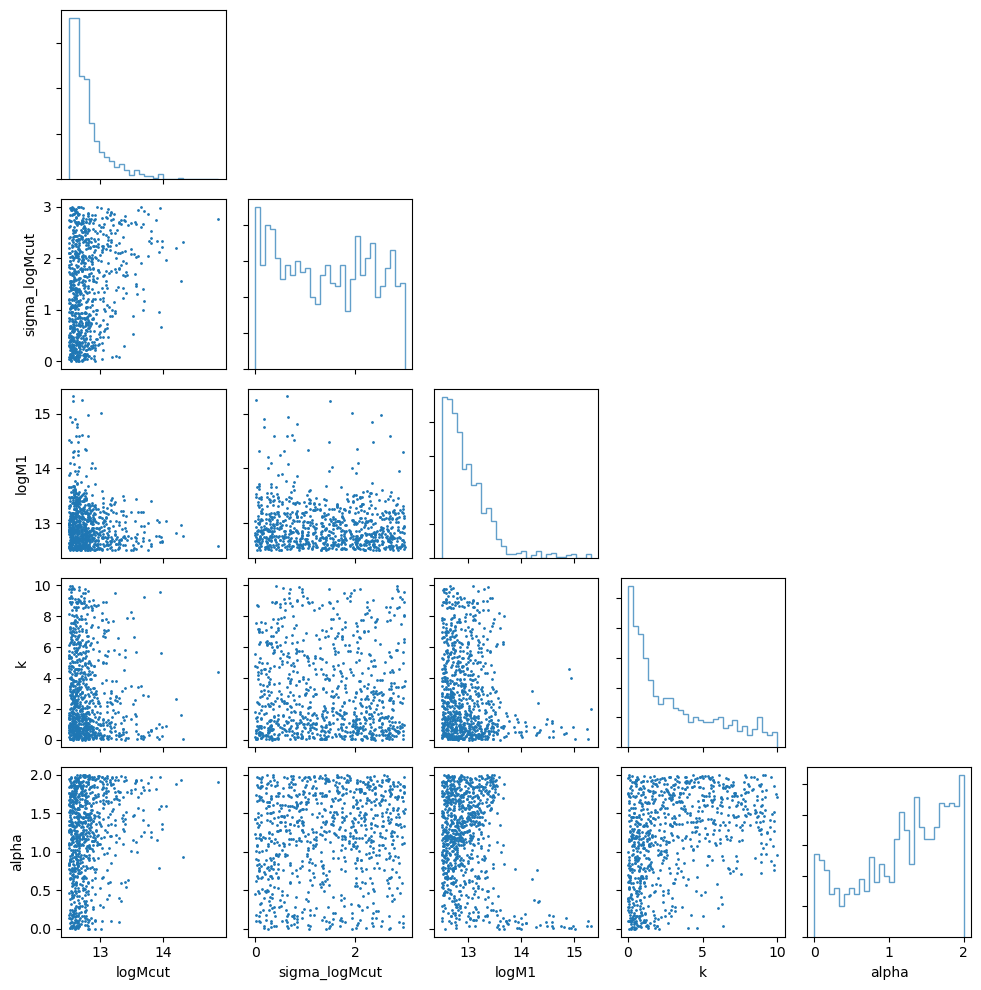

In [179]:
# 参数名（可选）
param_names = ['logMcut', 'sigma_logMcut', 'logM1', 'k', 'alpha']

# 绘图
corner_lower_triangle([hod_params], param_names)

In [91]:
from src.io_func import get_cosmo_from_file

In [103]:
cosmo_pars_failed = []
cosmo_pars_semi_failed = []
for cosmo_label, nhod in failed_sample.items():

    tmp = get_cosmo_from_file(f"/data3/suchen/CosmoGridV1/grid/cosmo_{int(cosmo_label):06d}/run_0/params.yml", otype='dict')
    if nhod == 0:
        cosmo_pars_failed.append(
            np.array([
                tmp["H0"]/100, tmp["Om"], tmp["Ob"], tmp["ns"], tmp["s8"]
            ])
        )
    else:
        cosmo_pars_semi_failed.append(
            np.array([
                tmp["H0"]/100, tmp["Om"], tmp["Ob"], tmp["ns"], tmp["s8"]
            ])
        )

In [104]:
cosmo_pars_success = []
for cosmo_label, nhod in success_sample.items():
    tmp = get_cosmo_from_file(f"/data3/suchen/CosmoGridV1/grid/cosmo_{int(cosmo_label):06d}/run_0/params.yml", otype='dict')
    cosmo_pars_success.append(
        np.array([
            tmp["H0"]/100, tmp["Om"], tmp["Ob"], tmp["ns"], tmp["s8"]
        ])
    )

In [106]:
len(failed_sample), len(success_sample)

(20, 80)

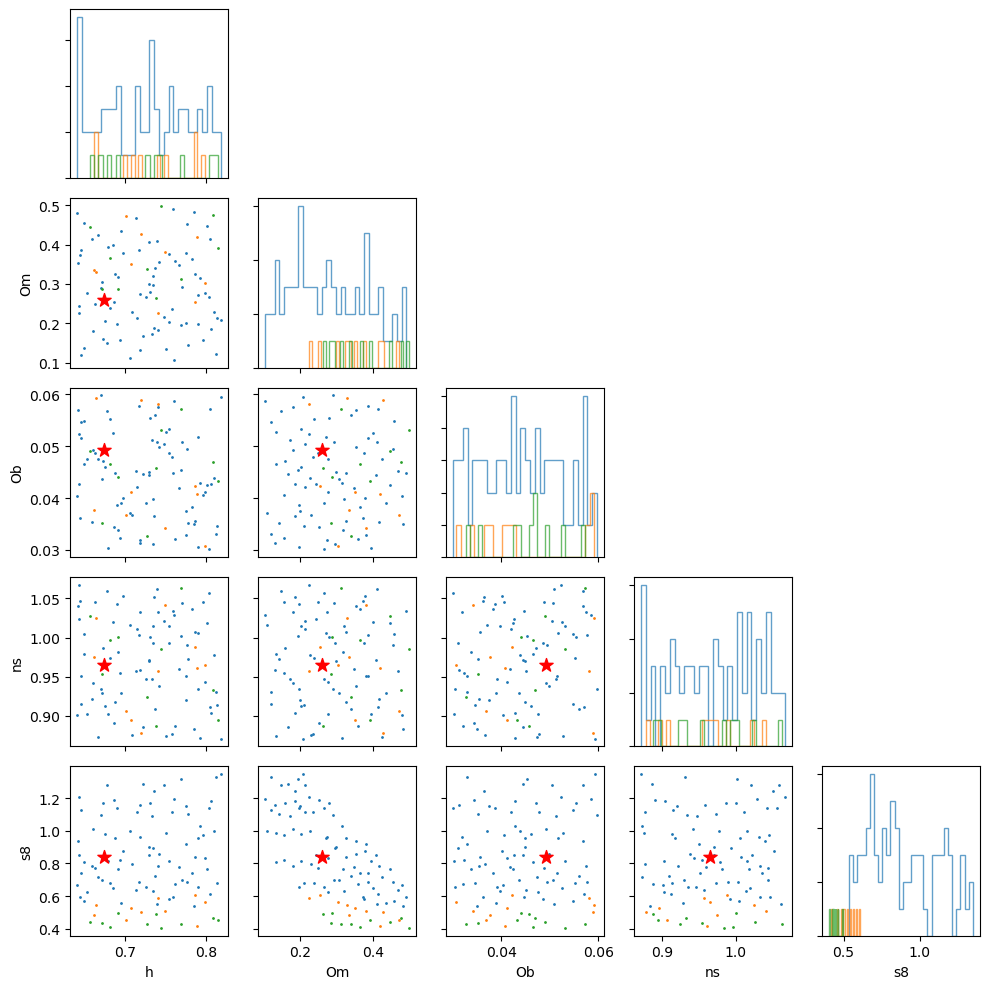

In [105]:
param_names = ["h", "Om", "Ob", "ns", "s8"]
corner_lower_triangle([np.asarray(cosmo_pars_success), np.asarray(cosmo_pars_semi_failed), np.asarray(cosmo_pars_failed)], param_names, marked_val=[0.6736, 0.26, 0.0493, 0.9649, 0.84])

#### Compare Data & Mock

In [347]:
hdu = fits.open("catalogs/masks/mask_KiDS_North_1024.fits")

In [348]:
test = hdu[1].data

In [349]:
test_map = (test['VALUE']).flatten()

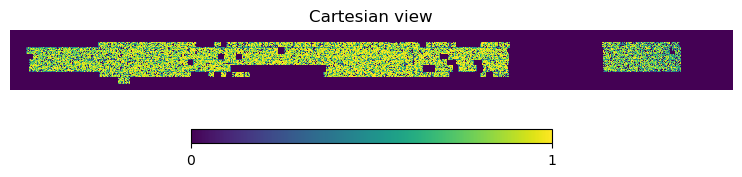

In [355]:
hp.cartview(test_map, rot=(180,0), latra=[-5,5], lonra=[-60,60], xsize=800)

In [8]:
cut = (test_map != 0)

In [9]:
test_ra, test_dec = hp.pix2ang(nside=1024, ipix=np.argwhere(cut), lonlat=True)

(110.0, 250.0)

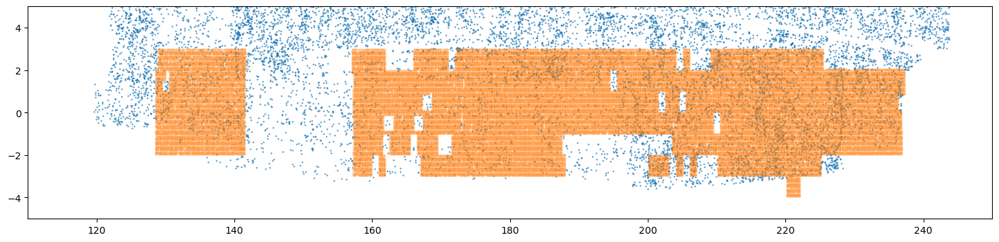

In [11]:
fig = plt.figure(figsize=(18,4))
ax = fig.add_subplot(111)
ax.scatter((boss_lowzcmass['RA']), (boss_lowzcmass['DEC']), s=1, marker='.')
ax.scatter((test_ra), (test_dec), s=0.1, marker='.')
ax.set_ylim(-5,5)
ax.set_xlim(110,250)

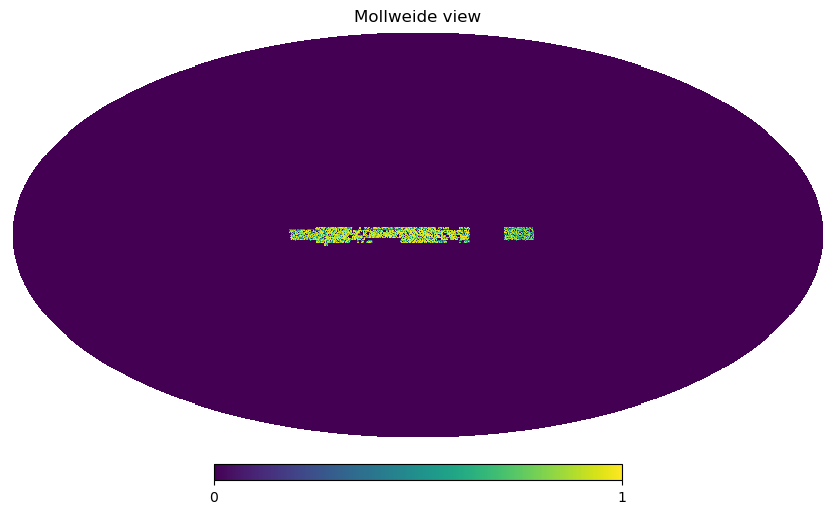

In [29]:
hp.mollview(test_map, rot=[180,0])

In [27]:
test_map_bin = np.where(test_map != 0, 1, 0)

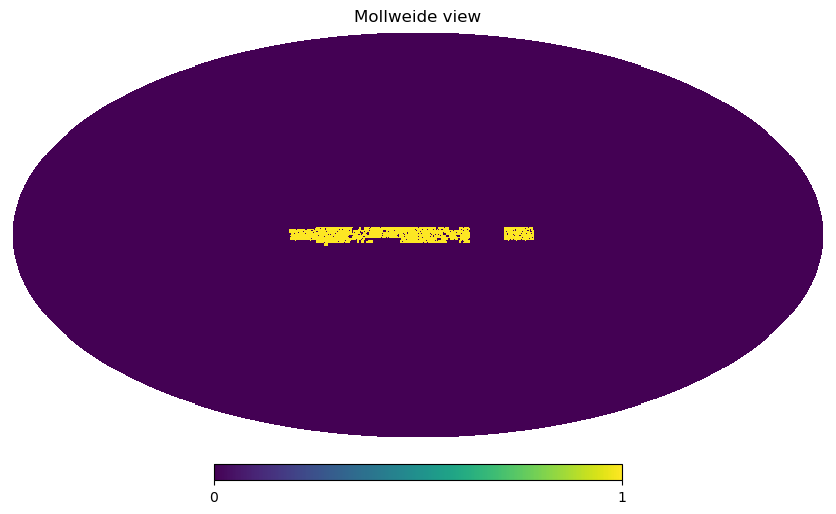

In [30]:
hp.mollview(test_map_bin, rot=[180,0])

In [16]:
gen_bg = np.loadtxt("catalogs/Shape/bg_gal_flip_g1.txt", dtype=bgal_type)

In [68]:
gen_fore_lowzcmass = np.loadtxt("catalogs/HOD/cosmo_000001_run_0_HOD_0_run_0_lowzcmass_part1.txt")
gen_fore_lowzcmass2 = np.loadtxt("catalogs/HOD/cosmo_000001_run_0_HOD_0_run_0_lowzcmass_part2.txt")
gen_fore_lowzcmass3 = np.loadtxt("catalogs/HOD/cosmo_000001_run_0_HOD_0_run_0_lowzcmass_part3.txt")
gen_fore_lowzcmass4 = np.loadtxt("catalogs/HOD/cosmo_000001_run_0_HOD_0_run_0_lowzcmass_part4.txt")

In [69]:
gen_fore_rot1 = np.loadtxt("catalogs/HOD/rotate1.txt")

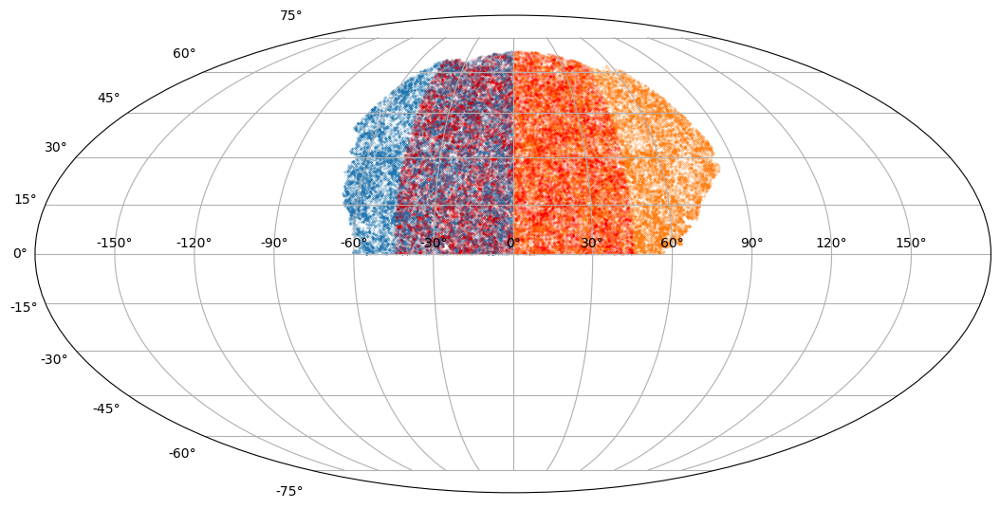

In [90]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.scatter(np.deg2rad(gen_fore_lowzcmass[:,0]-180), np.deg2rad(gen_fore_lowzcmass[:,1]), s=0.1, marker='.', alpha=0.5, label="(-1,0,0)")
ax.scatter(np.deg2rad(gen_fore_lowzcmass2[:,0]-180), np.deg2rad(gen_fore_lowzcmass2[:,1]), s=0.1, marker='.', alpha=0.5, label="(-1,-1,0)")
ax.scatter(np.deg2rad(gen_fore_rot1[:,0]-180), np.deg2rad(gen_fore_rot1[:,1]), s=0.1, marker='.', alpha=0.2, c='r', label="rot z -225deg")
ax.grid()
# ax.legend()

(110.0, 250.0)

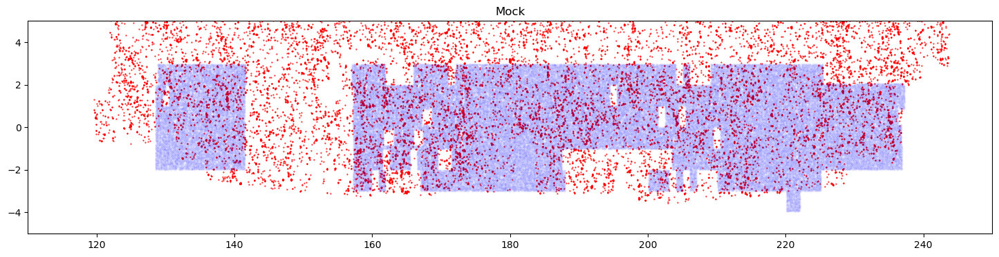

In [75]:
fig = plt.figure(figsize=(18,4))
ax = fig.add_subplot(111)
ax.set_title("Mock")
ax.scatter((gen_fore_lowzcmass[:,0]), (gen_fore_lowzcmass[:,1]), s=1, marker='.', c='r')
ax.scatter((gen_fore_lowzcmass2[:,0]), (gen_fore_lowzcmass2[:,1]), s=1, marker='.', c='r')
ax.scatter((gen_fore_lowzcmass3[:,0]), (gen_fore_lowzcmass3[:,1]), s=1, marker='.', c='r')
ax.scatter((gen_fore_lowzcmass4[:,0]), (gen_fore_lowzcmass4[:,1]), s=1, marker='.', c='r')
ax.scatter(gen_bg["ra"], gen_bg["dec"], s=0.01, alpha=0.1, c='b')
ax.set_ylim(-5,5)
ax.set_xlim(110,250)

(110.0, 250.0)

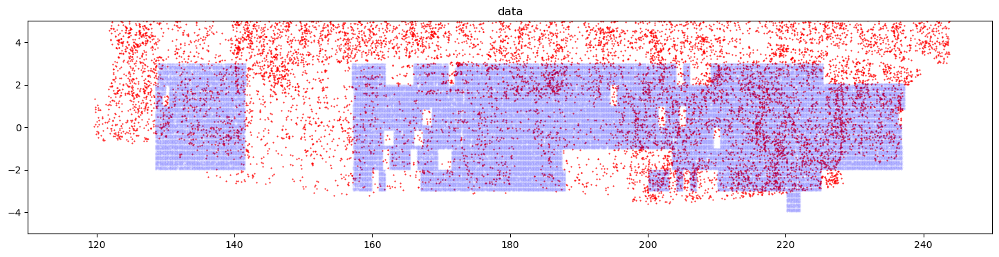

In [76]:
fig = plt.figure(figsize=(18,4))
ax = fig.add_subplot(111)
ax.set_title("data")
ax.scatter((boss_lowzcmass['RA']), (boss_lowzcmass['DEC']), s=1, marker='.', c='r')
ax.scatter((test_ra), (test_dec), s=0.1, marker='.', alpha=0.3, c='b')
ax.set_ylim(-5,5)
ax.set_xlim(110,250)

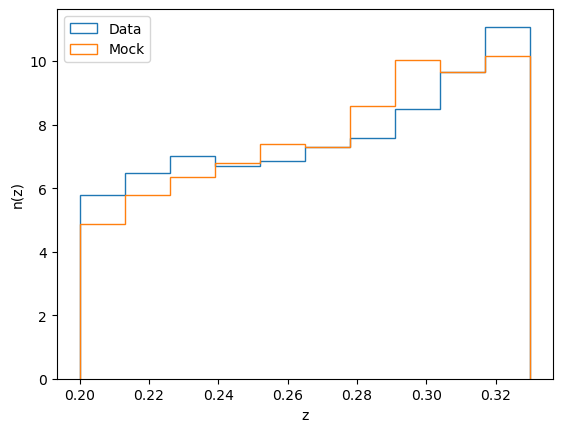

In [77]:
plt.hist(boss_lowzcmass['Z'], histtype='step', density=True, label='Data')
plt.hist(np.vstack([gen_fore_lowzcmass,gen_fore_lowzcmass2,gen_fore_lowzcmass3,gen_fore_lowzcmass4])[:,2], histtype='step', density=True, label='Mock')
plt.xlabel('z')
plt.ylabel('n(z)')
plt.legend()

#### Test Matching method

In [25]:
matched_bgal = np.loadtxt("catalogs/Matched/back_gal.txt", dtype=bgal_type)
matched_fgal = np.loadtxt("catalogs/Matched/fore_gal.txt", dtype=fgal_type)

(110.0, 250.0)

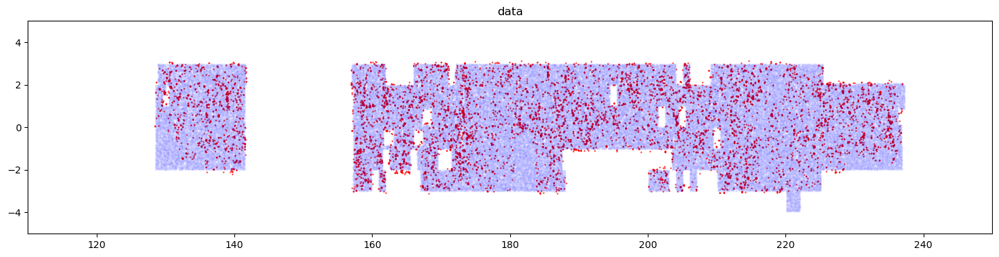

In [27]:
fig = plt.figure(figsize=(18,4))
ax = fig.add_subplot(111)
ax.set_title("data")
ax.scatter((matched_fgal['ra']), (matched_fgal['dec']), s=1, marker='.', c='r')
ax.scatter(gen_bg["ra"], gen_bg["dec"], s=0.01, alpha=0.1, c='b')
# ax.scatter((matched_bgal['ra']), (matched_bgal['dec']), s=0.01, marker='.', c='b', alpha=0.5)
ax.set_ylim(-5,5)
ax.set_xlim(110,250)

In [94]:
np.rad2deg(np.sqrt(4*np.pi/(64)**2/12))

0.9161297098179749

In [101]:
matched_void_bin0 = np.loadtxt("catalogs/Matched/fore_voids_rvbin0.txt", dtype=fgal_type)

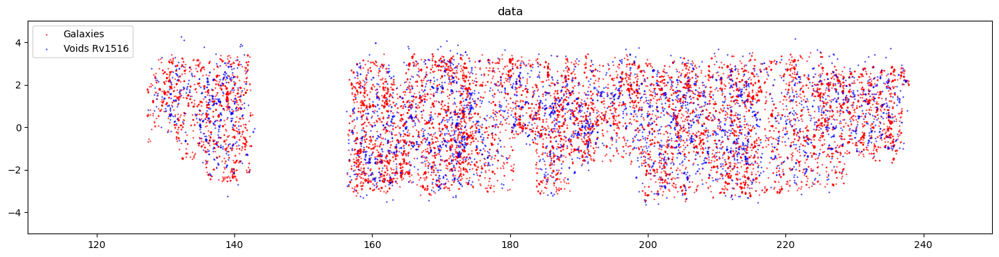

In [104]:
fig = plt.figure(figsize=(18,4))
ax = fig.add_subplot(111)
ax.set_title("data")
ax.scatter((matched_fgal['ra']), (matched_fgal['dec']), s=1, marker='.', c='r', label="Galaxies")
ax.scatter((matched_void_bin0['ra']), (matched_void_bin0['dec']), s=1, marker='.', c='b', label="Voids Rv1516")
ax.set_ylim(-5,5)
ax.set_xlim(110,250)
ax.legend()

In [24]:
gen_bg['dec'].min()

-3.957

In [23]:
matched_fgal['dec'].min()

-3.465

In [30]:
tmp = matched_fgal.copy()
tmp['w'] = np.ones(len(tmp))*0.001
np.savetxt("catalogs/Matched/fore_gal_swot.txt", tmp, fmt="%.3f %.3f %.3f %.3f")
del tmp

In [45]:
ggl_results = np.loadtxt("results/mock/ggl.out", dtype=swot_output_type)
ggl_results.dtype

dtype([('Rp', '<f4'), ('SigR', '<f4'), ('errw', '<f4'), ('errjk', '<f4'), ('Nsource', '<i4'), ('Rmean', '<f4'), ('e2', '<f4')])

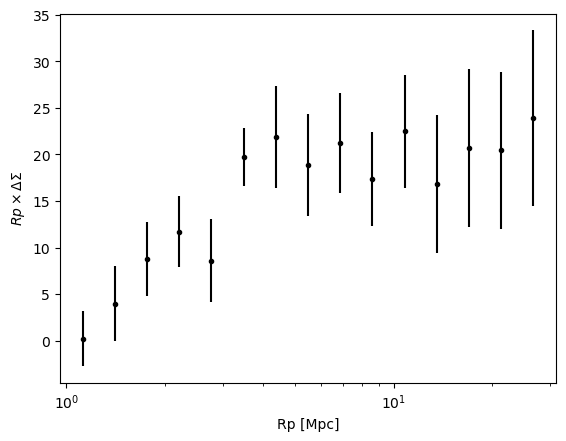

In [48]:
plt.errorbar(ggl_results['Rp'], ggl_results['SigR']*ggl_results['Rp'], ggl_results['errjk']*ggl_results['Rp'], fmt='.k')
plt.xscale('log')
plt.xlabel('Rp [Mpc]')
plt.ylabel(r'$Rp\times\Delta\Sigma$');
# plt.yscale('log')

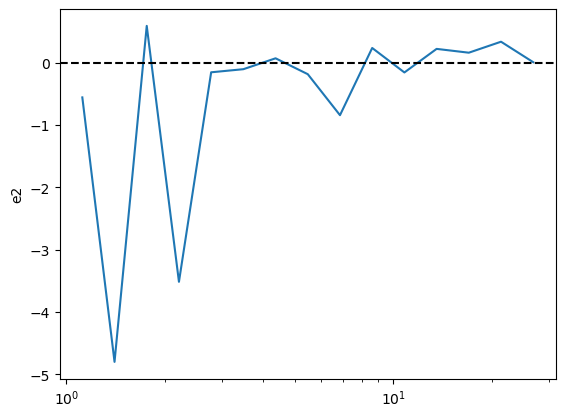

In [51]:
plt.semilogx(ggl_results['Rp'], ggl_results['e2'])
plt.axhline(0,c='k',ls='--')
plt.ylabel('e2');

#### Check Mock version 2

In [9]:
# zmin = lb_z_tb[120,1]
# zmax = lb_z_tb[119,1]
zmin = 0.2
zmax = 0.4

In [105]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_LOWZ_North.fits"
boss_lowz = Table.read(fname, format="fits")
zcut = (boss_lowz["Z"] > zmin) & (boss_lowz["Z"] < zmax)
boss_lowz = boss_lowz[zcut]

In [101]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_CMASSLOWZTOT_North.fits"
boss_lowzcmasstot = Table.read(fname, format="fits")
zcut = (boss_lowzcmasstot["Z"] > zmin) & (boss_lowzcmasstot["Z"] < zmax)
boss_lowzcmasstot = boss_lowzcmasstot[zcut]

In [48]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_CMASSLOWZ_North.fits"
boss_lowzcmass = Table.read(fname, format="fits")
zcut = (boss_lowzcmass["Z"] > zmin) & (boss_lowzcmass["Z"] < zmax)
boss_lowzcmass = boss_lowzcmass[zcut]
len(boss_lowze2cmass)

In [56]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_CMASSLOWZE2_North.fits"
boss_lowze2cmass = Table.read(fname, format="fits")
zcut = (boss_lowze2cmass["Z"] > zmin) & (boss_lowze2cmass["Z"] < zmax)
boss_lowze2cmass = boss_lowze2cmass[zcut]

In [57]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_CMASSLOWZE3_North.fits"
boss_lowze3cmass = Table.read(fname, format="fits")
zcut = (boss_lowze3cmass["Z"] > zmin) & (boss_lowze3cmass["Z"] < zmax)
boss_lowze3cmass = boss_lowze3cmass[zcut]

In [63]:
fname = "/data2/suchen/BOSS_dr12/galaxy_DR12v5_CMASS_North.fits"
boss_cmass = Table.read(fname, format="fits")
zcut = (boss_cmass["Z"] > zmin) & (boss_cmass["Z"] < zmax)
boss_cmass = boss_cmass[zcut]
len(boss_cmass)

In [120]:
fname = "/data2/suchen/BOSS_dr12/SDSS_DR12_orig/galaxy_DR12v5_LOWZE2_North.fits"
boss_lowze2 = Table.read(fname, format="fits")
zcut = (boss_lowze2["Z"] > zmin) & (boss_lowze2["Z"] < zmax)
boss_lowze2 = boss_lowze2[zcut]
len(boss_lowze2)

155372

In [122]:
fname = "/data2/suchen/BOSS_dr12/SDSS_DR12_orig/galaxy_DR12v5_LOWZE2_North_trimmed.fits"
boss_lowze2_trimmed = Table.read(fname, format="fits")
zcut = (boss_lowze2_trimmed["Z"] > zmin) & (boss_lowze2_trimmed["Z"] < zmax)
boss_lowze2_trimmed = boss_lowze2_trimmed[zcut]
len(boss_lowze2_trimmed)

3278

In [129]:
fname = "/data2/suchen/BOSS_dr12/SDSS_DR12_orig/galaxy_DR12v5_LOWZE3_North.fits"
boss_lowze3 = Table.read(fname, format="fits")
zcut = (boss_lowze3["Z"] > zmin) & (boss_lowze3["Z"] < zmax)
boss_lowze3 = boss_lowze3[zcut]
len(boss_lowze3)

107844

In [124]:
fname = "/data2/suchen/BOSS_dr12/SDSS_DR12_orig/galaxy_DR12v5_LOWZE3_North_trimmed.fits"
boss_lowze3_trimmed = Table.read(fname, format="fits")
zcut = (boss_lowze3_trimmed["Z"] > zmin) & (boss_lowze3_trimmed["Z"] < zmax)
boss_lowze3_trimmed = boss_lowze3_trimmed[zcut]
len(boss_lowze3_trimmed)

12455

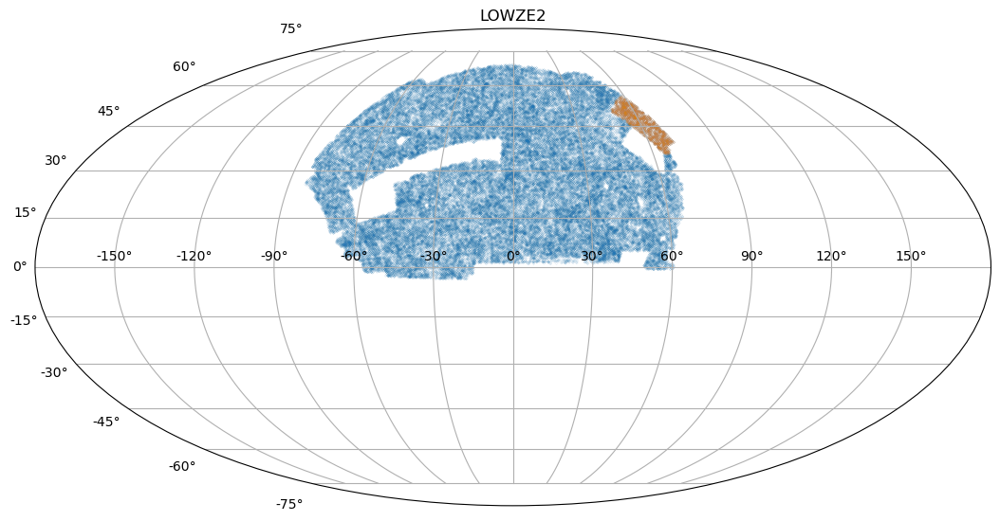

In [132]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('LOWZE2')
ax.scatter(np.deg2rad(180-boss_lowze2["RA"]), np.deg2rad(boss_lowze2["DEC"]), s=0.01, alpha=1, marker='.')
ax.scatter(np.deg2rad(180-boss_lowze2_trimmed["RA"]), np.deg2rad(boss_lowze2_trimmed["DEC"]), s=0.01, alpha=1, marker='.')
ax.grid()

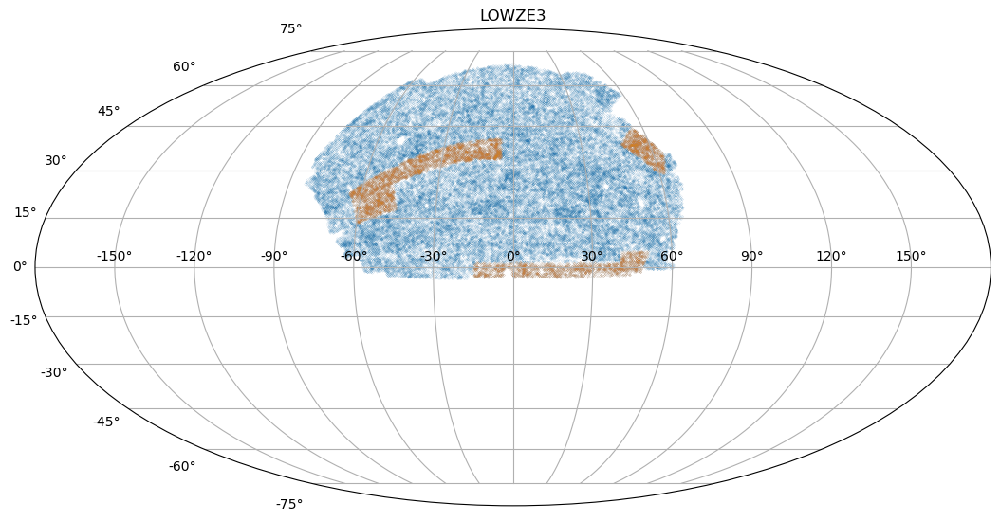

In [134]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('LOWZE3')
ax.scatter(np.deg2rad(180-boss_lowze3["RA"]), np.deg2rad(boss_lowze3["DEC"]), s=0.01, alpha=1, marker='.')
ax.scatter(np.deg2rad(180-boss_lowze3_trimmed["RA"]), np.deg2rad(boss_lowze3_trimmed["DEC"]), s=0.01, alpha=1, marker='.')
ax.grid()

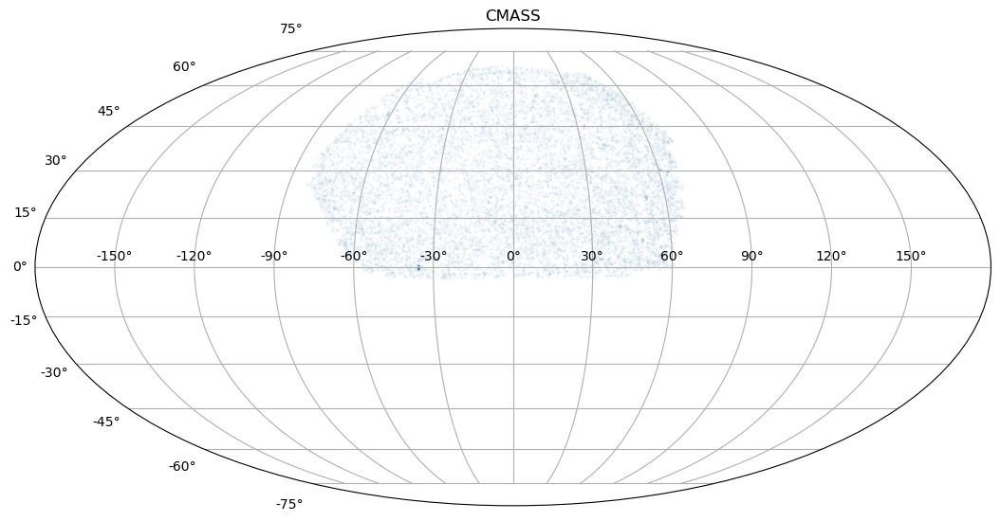

In [64]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('CMASS')
ax.scatter(np.deg2rad(180-boss_cmass["RA"]), np.deg2rad(boss_cmass["DEC"]), s=0.01, alpha=1, marker='.')
ax.grid()

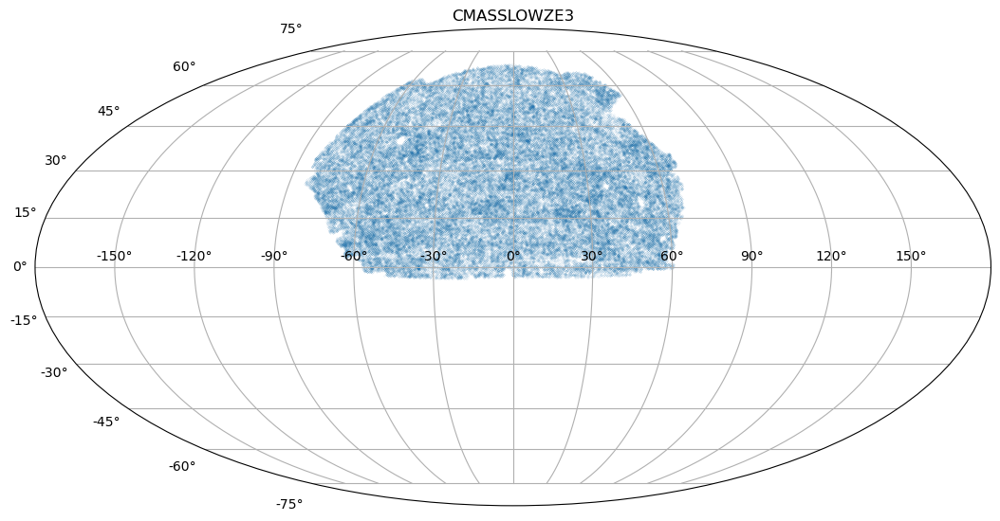

In [62]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('CMASSLOWZE3')
ax.scatter(np.deg2rad(180-boss_lowze3cmass["RA"]), np.deg2rad(boss_lowze3cmass["DEC"]), s=0.01, alpha=1, marker='.')
ax.grid()

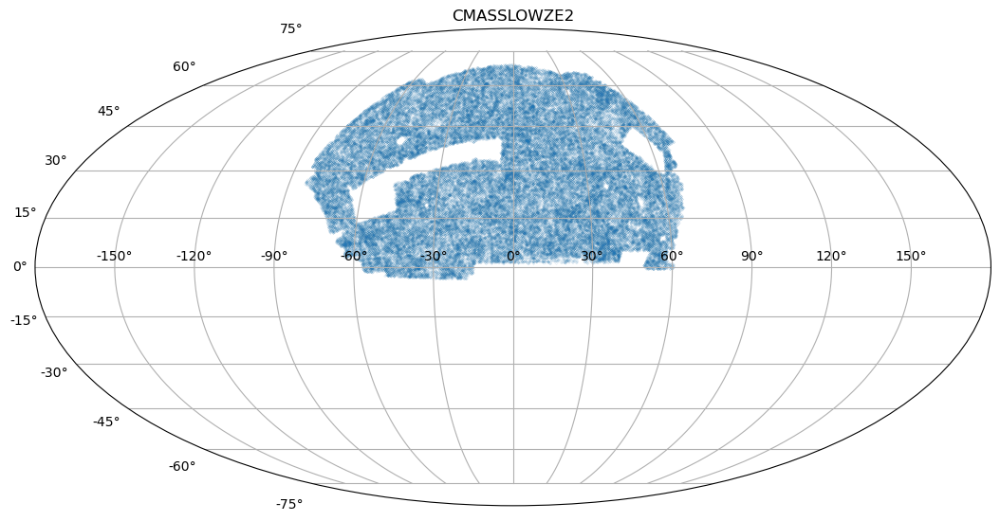

In [61]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('CMASSLOWZE2')
ax.scatter(np.deg2rad(180-boss_lowze2cmass["RA"]), np.deg2rad(boss_lowze2cmass["DEC"]), s=0.01, alpha=1, marker='.')
ax.grid()

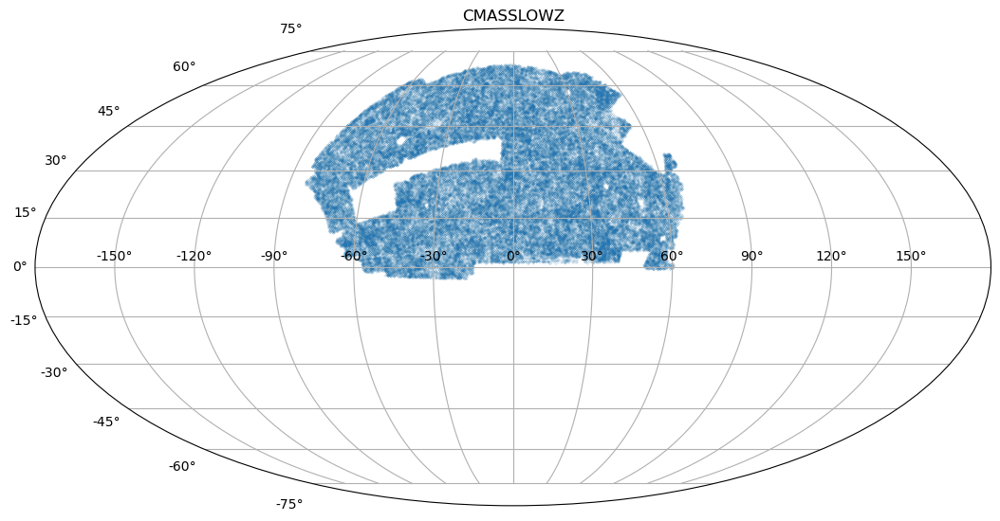

In [58]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('CMASSLOWZ')
ax.scatter(np.deg2rad(180-boss_lowzcmass["RA"]), np.deg2rad(boss_lowzcmass["DEC"]), s=0.01, alpha=1, marker='.')
ax.grid()

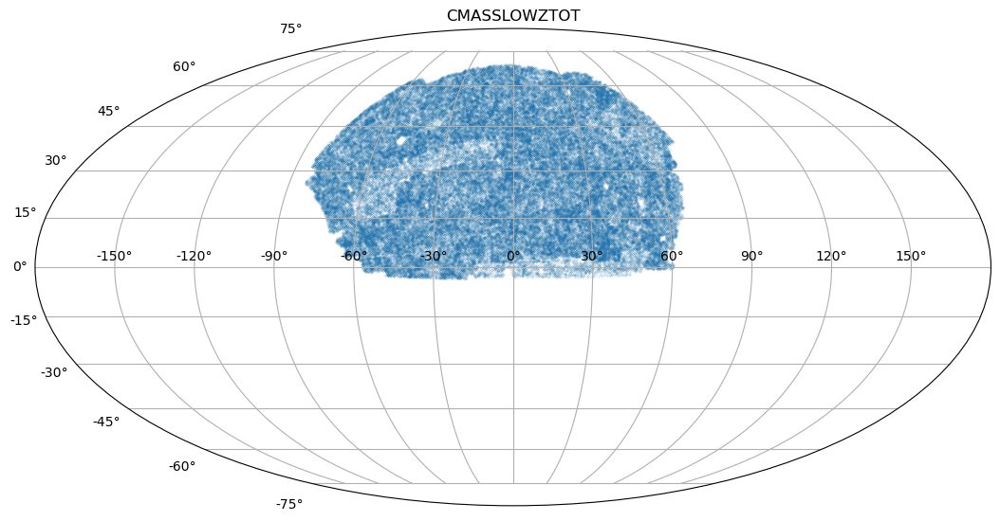

In [59]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('CMASSLOWZTOT')
ax.scatter(np.deg2rad(180-boss_lowzcmasstot["RA"]), np.deg2rad(boss_lowzcmasstot["DEC"]), s=0.01, alpha=1, marker='.')
ax.grid()

In [10]:
mock_gal = np.loadtxt(f"catalogs/HOD/cosmo_{cosmo_label}_run_0_HOD_0_run_0_boss_north_2dflens_south.txt")
print(f"catalogs/HOD/cosmo_{cosmo_label}_run_0_HOD_0_run_0_boss_north_2dflens_south.txt")
len(mock_gal)

catalogs/HOD/cosmo_000001_run_0_HOD_0_run_0_boss_north_2dflens_south.txt


229611

In [11]:
select = mock_gal[:,-1] == 0.0
np.sum(select)/len(mock_gal)

0.0

In [12]:
mock_gal_north = mock_gal[mock_gal[:,1]>-15]

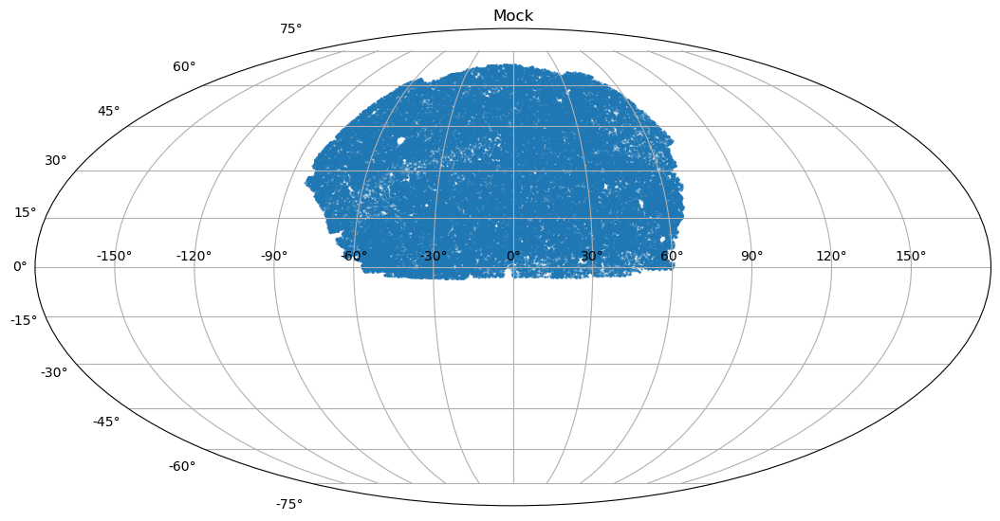

In [182]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title("Mock")
ax.scatter(np.deg2rad(180-mock_gal_north[:,0]), np.deg2rad(mock_gal_north[:,1]), s=1, alpha=0.5, marker='.')
# ax.scatter(np.deg2rad(180-mock_gal_north[:206829,0]), np.deg2rad(mock_gal_north[:206829,1]), s=0.01, alpha=1, marker='.')
# ax.scatter(np.deg2rad(180-mock_gal_north[206829:364521,0]), np.deg2rad(mock_gal_north[206829:364521,1]), s=0.01, alpha=1, marker='.')
# ax.scatter(np.deg2rad(180-mock_gal_north[364521:,0]), np.deg2rad(mock_gal_north[364521:,1]), s=0.01, alpha=1, marker='.')
ax.grid()

#### trim E2 and E3 regions

In [192]:
mock_e2 = mock_gal_north[206829:364521]
mock_e3 = mock_gal_north[364521:]
lowz_mask = pymangle.Mangle("catalogs/masks/boss_geom/mask_DR12v5_LOWZ_North.ply")

In [193]:
trim = lowz_mask.weight(mock_e3[:,0],mock_e3[:,1]) == 0
mock_e3_trimmed = mock_e3[trim]
trim = lowz_mask.weight(mock_e2[:,0],mock_e2[:,1]) == 0
mock_e2_trimmed = mock_e2[trim]

In [163]:
rand_ra = np.random.uniform(low=0, high=360, size=100000)
rand_dec = 90-np.rad2deg(np.arccos(np.random.uniform(low=-1, high=1, size=100000)))
trim = lowz_mask.contains(rand_ra, rand_dec)
trim_w = lowz_mask.weight(rand_ra, rand_dec)

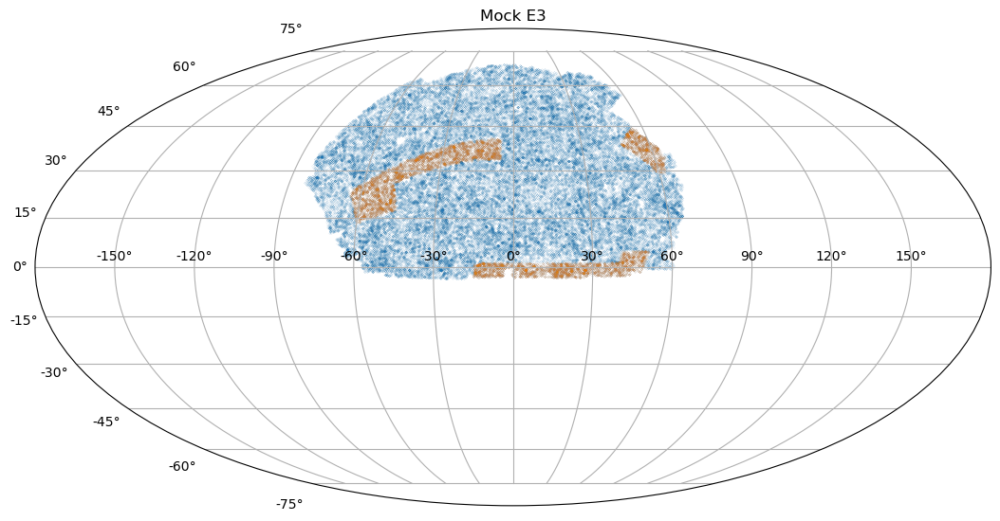

In [194]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title("Mock E3")
ax.scatter(np.deg2rad(180-mock_e3[:,0]), np.deg2rad(mock_e3[:,1]), s=0.01, alpha=1, marker='.')
ax.scatter(np.deg2rad(180-mock_e3_trimmed[:,0]), np.deg2rad(mock_e3_trimmed[:,1]), s=0.01, alpha=1, marker='.')
ax.grid()

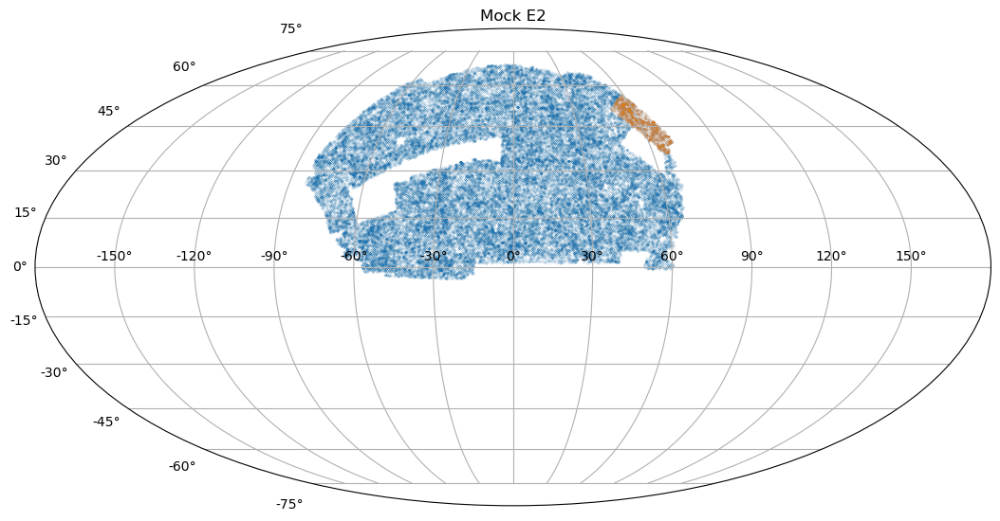

In [177]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title("Mock E2")
ax.scatter(np.deg2rad(180-mock_e2[:,0]), np.deg2rad(mock_e2[:,1]), s=0.01, alpha=1, marker='.')
ax.scatter(np.deg2rad(180-mock_e2_trimmed[:,0]), np.deg2rad(mock_e2_trimmed[:,1]), s=0.01, alpha=1, marker='.')
ax.grid()

Text(0, 0.5, 'N(z)')

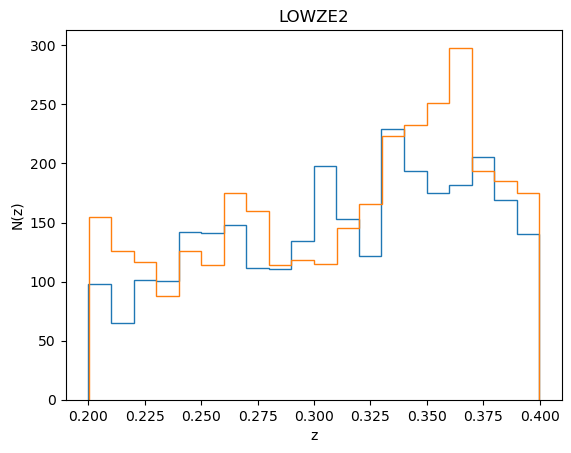

In [348]:
plt.title('LOWZE2')
plt.hist(mock_e2_trimmed[:,2], bins=20, weights=mock_e2_trimmed[:,-1], histtype='step');
plt.hist(boss_lowze2_trimmed["Z"], bins=20, weights=boss_lowze2_trimmed["WEIGHT_SYSTOT"], histtype='step');
plt.xlabel('z')
plt.ylabel('N(z)')

Text(0, 0.5, 'N(z)')

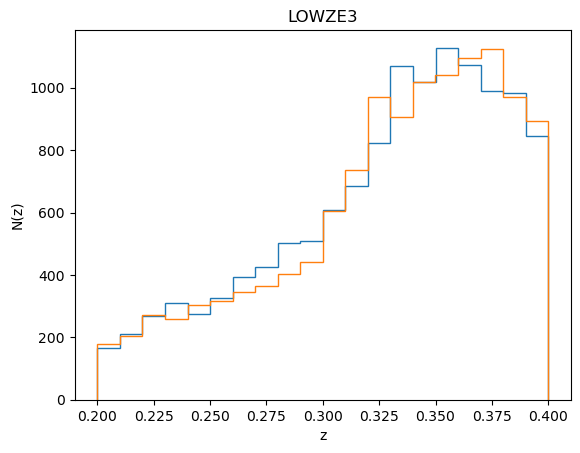

In [349]:
plt.title('LOWZE3')
plt.hist(mock_e3_trimmed[:,2], bins=20, histtype='step', weights=mock_e3_trimmed[:,-1], label='Mock');
plt.hist(boss_lowze3_trimmed["Z"], bins=20, histtype='step', label='Data');
plt.xlabel('z')
plt.ylabel('N(z)')

#### end

In [409]:
mock_gal_north[:,-1].min()

0.641414

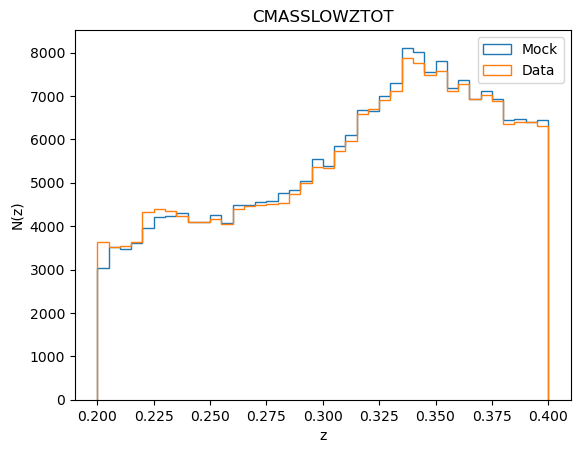

In [352]:
plt.title('CMASSLOWZTOT')
plt.hist(mock_gal_north[:,2], bins=40, histtype='step', label='Mock');
plt.hist(boss_lowzcmasstot["Z"], bins=40, histtype='step', label='Data');
plt.legend()
plt.xlabel('z')
plt.ylabel('N(z)');

(0.2, 0.4)

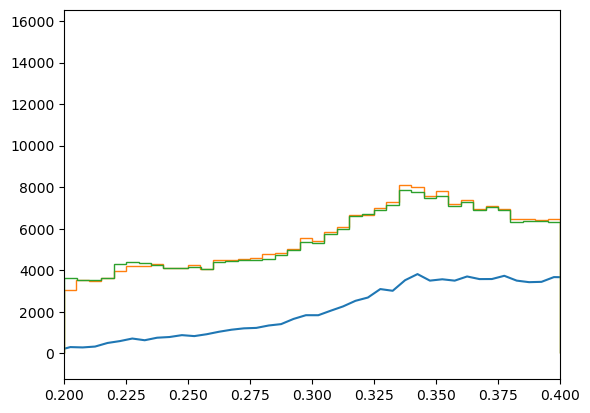

In [375]:
# plt.plot(nz_lowz['zcen'], nz_cmass['tot_w_gals'] + nz_lowz['tot_w_gals'])
plt.plot(nz_cmasslowz['zcen'], nz_cmasslowz['tot_w_gals'] + nz_lowze2['tot_w_gals'] + nz_lowze3['tot_w_gals'] - 2*nz_lowz['tot_w_gals'])
plt.hist(mock_gal_north[:,2], bins=40, histtype='step', label='Mock');
plt.hist(boss_lowzcmasstot["Z"], bins=40, histtype='step', label='Data');
plt.xlim(0.2,0.4)

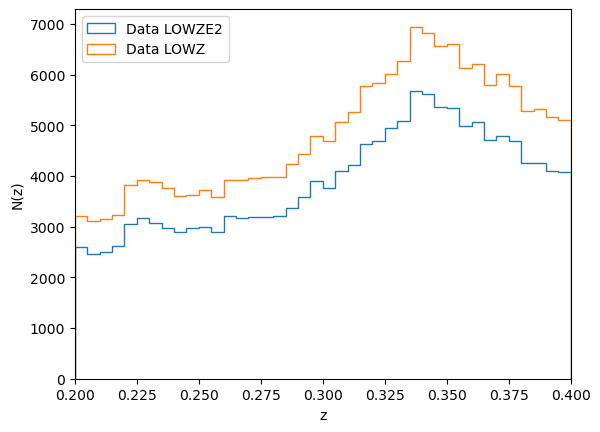

In [388]:
# plt.plot(nz_lowz['zcen'], nz_lowze2['tot_w_gals'])
plt.hist(boss_lowze2['Z'], bins=40, histtype='step', weights=boss_lowze2['WEIGHT_SYSTOT'], label='Data LOWZE2')
# plt.plot(nz_lowz['zcen'], nz_lowze3['tot_w_gals'])
# plt.plot(nz_lowz['zcen'], nz_lowz['tot_w_gals'], '--k')
plt.hist(boss_lowz['Z'], bins=40, weights=boss_lowz['WEIGHT_SYSTOT'], histtype='step', label='Data LOWZ');
plt.xlim(0.2, 0.4)
plt.xlabel('z')
plt.ylabel('N(z)')
plt.legend();

#### observational effects mask

In [16]:
!cat catalogs/masks/boss_geom/README

1) boss_survey.ply/fits
  This simple mask provides a broad outline of the survey geometry.  It is the same for DR10/DR11/DR12.  Objects outside this mask are vetoed.

2) boss_geometry_2014_05_28.ply/fits
  This mask provides the full geometric structure of the BOSS spectroscopic tiles for DR12.  Objects outside this mask are vetoed.

3) badfield_mask_postprocess_pixs8.ply
  Objects inside this mask are vetoed.  Same for DR11 and DR12.

4) badfield_mask_unphot_seeing_extinction_pixs8_dr12.ply
  Objects inside this mask are vetoed.  This is an update of badfield_mask_unphot-ugriz_pix.ply created for DR12, which includes new seeing and extinction cuts.

5) allsky_bright_star_mask_pix.ply
  Objects inside this mask are vetoed.  Same for DR10, DR11, DR12.

6) bright_object_mask_rykoff_pix.ply
  Objects inside this mask are vetoed.  Same for DR10, DR11, DR12.

7) collision_priority_mask_dr12.ply
  Objects inside this mask are vetoed.  New version in DR12.  Excludes 62'' area around highest 

In [23]:
%%time
m = pymangle.Mangle("catalogs/masks/boss_geom/badfield_mask_postprocess_pixs8.ply")
mask = m.contains(mock_gal[:,0], mock_gal[:,1])
1-np.sum(mask)/len(mask)

CPU times: user 836 ms, sys: 847 μs, total: 837 ms
Wall time: 821 ms


0.9956312942106537

In [26]:
np.sum(m.weight(mock_gal[:,0], mock_gal[:,1]) == 1)

1481

In [251]:
fdir = "catalogs/masks/boss_geom/"
mask_fname_list = [
    fdir + "badfield_mask_postprocess_pixs8.ply",
    fdir + "badfield_mask_unphot_seeing_extinction_pixs8_dr12.ply",
    fdir + "allsky_bright_star_mask_pix.ply",
    fdir + "bright_object_mask_rykoff_pix.ply", 
    fdir + "collision_priority_mask_dr12.ply", 
    fdir + "centerpost_mask_dr12.ply"
]

In [266]:
for ifile, fname in enumerate(mask_fname_list):
    print(ifile, flush=True)
    m = pymangle.Mangle(fname)
    mask = m.contains(mock_gal[:,0], mock_gal[:,1])
    tot_mask = mask if ifile == 0 else tot_mask | mask

0
1
2
3
4
5


In [270]:
np.sum(tot_mask)/len(tot_mask)

0.06321791611848898

#### redshift distributions $\bar{n}(z)$

In [94]:
nz_cmasslowz = Table.read("catalogs/NOfZ/lens/nbar_DR12v5_CMASSLOWZ_North_om0p31_Pfkp10000.dat", 
                          format='ascii.no_header',
                         names=['zcen', 'zlow', 'zhigh', 'nbar', 'wfkp', 'shell_vol', 'tot_w_gals'])

In [95]:
nz_cmass = Table.read("catalogs/NOfZ/lens/nbar_DR12v5_CMASS_North_om0p31_Pfkp10000.dat", 
                          format='ascii.no_header',
                         names=['zcen', 'zlow', 'zhigh', 'nbar', 'wfkp', 'shell_vol', 'tot_w_gals'])
nz_lowz = Table.read("catalogs/NOfZ/lens/nbar_DR12v5_LOWZ_North_om0p31_Pfkp10000.dat", 
                          format='ascii.no_header',
                         names=['zcen', 'zlow', 'zhigh', 'nbar', 'wfkp', 'shell_vol', 'tot_w_gals'])
nz_lowze2 = Table.read("catalogs/NOfZ/lens/nbar_DR12v5_LOWZE2_North_om0p31_Pfkp10000.dat", 
                          format='ascii.no_header',
                         names=['zcen', 'zlow', 'zhigh', 'nbar', 'wfkp', 'shell_vol', 'tot_w_gals'])
nz_lowze3 = Table.read("catalogs/NOfZ/lens/nbar_DR12v5_LOWZE3_North_om0p31_Pfkp10000.dat", 
                          format='ascii.no_header',
                         names=['zcen', 'zlow', 'zhigh', 'nbar', 'wfkp', 'shell_vol', 'tot_w_gals'])

In [96]:
nz_cmasslowze2 = Table.read("catalogs/NOfZ/lens/nbar_DR12v5_CMASSLOWZE2_North_om0p31_Pfkp10000.dat", 
                          format='ascii.no_header',
                         names=['zcen', 'zlow', 'zhigh', 'nbar', 'wfkp', 'shell_vol', 'tot_w_gals'])
nz_cmasslowze2 = Table.read("catalogs/NOfZ/lens/nbar_DR12v5_CMASSLOWZE2_North_om0p31_Pfkp10000.dat", 
                          format='ascii.no_header',
                         names=['zcen', 'zlow', 'zhigh', 'nbar', 'wfkp', 'shell_vol', 'tot_w_gals'])

In [97]:
tot_gals_cmasslowztot = nz_cmasslowz['tot_w_gals'] + nz_lowze2['tot_w_gals'] + nz_lowze3['tot_w_gals']
tot_gals_cmasslowztot2 = nz_cmass['tot_w_gals'] + nz_lowz['tot_w_gals'] + nz_lowze2['tot_w_gals'] + nz_lowze3['tot_w_gals']

In [98]:
argstart = np.argwhere(nz_cmasslowz['zlow'] == zmin)[0][0]
argend = np.argwhere(nz_cmasslowz['zhigh'] == zmax)[0][0] 

In [119]:
Nz, zedges = np.histogram(mock_gal_north[:,2], bins=np.arange(0.2, 0.40001, 0.005))

In [120]:
Nz_data, zedges = np.histogram(boss_lowzcmasstot["Z"], bins=np.arange(0.2, 0.40001, 0.005))

In [121]:
Nz_data.sum()

221212

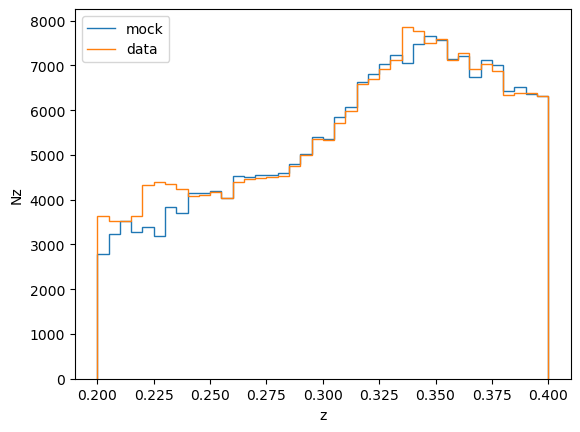

In [122]:
plt.stairs(Nz, zedges, label='mock')
plt.stairs(Nz_data, zedges, label='data')
plt.xlabel('z')
plt.ylabel('Nz')
plt.legend();

#### Test generate random

In [255]:
'''
Script to generate random catalog
'''

import numpy as np
import pymangle
import datetime
from loguru import logger

fgal_type = np.dtype(
    [
        ("ra", "f4"), 
        ("dec", "f4"), 
        ("z", "f4"), 
        ("w", "f4")
    ]
)

def apply_boss_geometry(galcone, masks):
    for ipoly in range(len(masks)):
        mask = masks[ipoly].contains(galcone["ra"], galcone["dec"])
        tot_mask = mask if ipoly == 0 else tot_mask | mask
    galcone = galcone[~tot_mask]

    return galcone

def generate_z_from_nz(nofz, N, seed=None):
    rng = np.random.default_rng(seed)
    z_lows = nofz[:,0]
    z_highs = nofz[:,1]
    nz = nofz[:,2]
    
    probs = nz/nz.sum()

    bin_indices = rng.choice(len(nofz), size=N, p=probs)
    z_sampled = rng.uniform(low=z_lows[bin_indices], high=z_highs[bin_indices])

    return z_sampled

def make_nofz_info(zedges, shell_vol, nz_ref):
    '''
    Parameters
    ----------
    zedges : array
        z edges
    shell_vol : float
        volume of the shell
    nz_ref : float
        reference number density
    '''

    nofz_info = {}
    nofz_info['zedges'] = zedges
    nofz_info['shell_vol'] = shell_vol
    nofz_info['nz_ref'] = nz_ref

    return nofz_info

def apply_nz_downsample(galcone, nofz_info):
    zedges = nofz_info['zedges']
    shell_vol = nofz_info['shell_vol']
    nz_ref = nofz_info['nz_ref']

    z_mock = galcone["z"]
    Nz_mock, _ = np.histogram(z_mock, zedges)
    downsample_rate = nz_ref/Nz_mock*shell_vol
    downsample_rate = np.clip(downsample_rate, 0, 1)
    
    galcone_dsampled = []
    number_in_bin = []
    for ibin in range(len(zedges)-1):
        zmin, zmax = zedges[ibin], zedges[ibin+1]
        in_bin = (z_mock >= zmin) & (z_mock < zmax)
        gal_in_bin = galcone[in_bin]

        mask = np.random.choice(np.arange(len(gal_in_bin)), size=int(downsample_rate[ibin]*len(gal_in_bin)), replace=False)
        galcone_dsampled.append(gal_in_bin[mask])
        number_in_bin.append(len(gal_in_bin[mask]))

    galcone_dsampled = np.concatenate(galcone_dsampled)

    return galcone_dsampled

In [260]:
mask_boss_fdir = "catalogs/masks/boss_geom/"
### geometry files
geom_boss_fname_list = [
    mask_boss_fdir + "mask_DR12v5_CMASSLOWZ_North.ply",
    mask_boss_fdir + "mask_DR12v5_LOWZE2_North.ply",
    mask_boss_fdir + "mask_DR12v5_LOWZE3_North.ply",
]
### mask files corresponding to observational effects
mask_boss_fname_list = [
    mask_boss_fdir + "badfield_mask_postprocess_pixs8.ply",
    mask_boss_fdir + "badfield_mask_unphot_seeing_extinction_pixs8_dr12.ply",
    mask_boss_fdir + "allsky_bright_star_mask_pix.ply",
    mask_boss_fdir + "bright_object_mask_rykoff_pix.ply", 
    mask_boss_fdir + "collision_priority_mask_dr12.ply", 
    mask_boss_fdir + "centerpost_mask_dr12.ply"
]

### n(z) files
nz_boss_fname_list = [
    "catalogs/NOfZ/nbar_DR12v5_CMASSLOWZ_North_om0p31_Pfkp10000.dat",
    "catalogs/NOfZ/nbar_DR12v5_LOWZE2_North_om0p31_Pfkp10000.dat",
    "catalogs/NOfZ/nbar_DR12v5_LOWZE3_North_om0p31_Pfkp10000.dat"
]

start = datetime.datetime.now()
logger.info("Load masks")

geoms = []
for geom_file in geom_boss_fname_list:
    geoms.append(pymangle.Mangle(geom_file))

masks = []
for mask_file in mask_boss_fname_list:
    masks.append(pymangle.Mangle(mask_file))

2025-07-02 17:47:29.946 | INFO     | __main__:<module>:26 - Load masks


In [288]:
test_ra, test_dec = geoms[0].genrand(int(1e5))
select = (geoms[0].weight(test_ra, test_dec) > 0)
test_ra = test_ra[select]
test_dec = test_dec[select]

In [289]:
for ipoly in range(len(masks)):
    mask = masks[ipoly].contains(test_ra, test_dec)
    tot_mask = mask if ipoly == 0 else tot_mask | mask
test_ra = test_ra[~tot_mask]
test_dec = test_dec[~tot_mask]

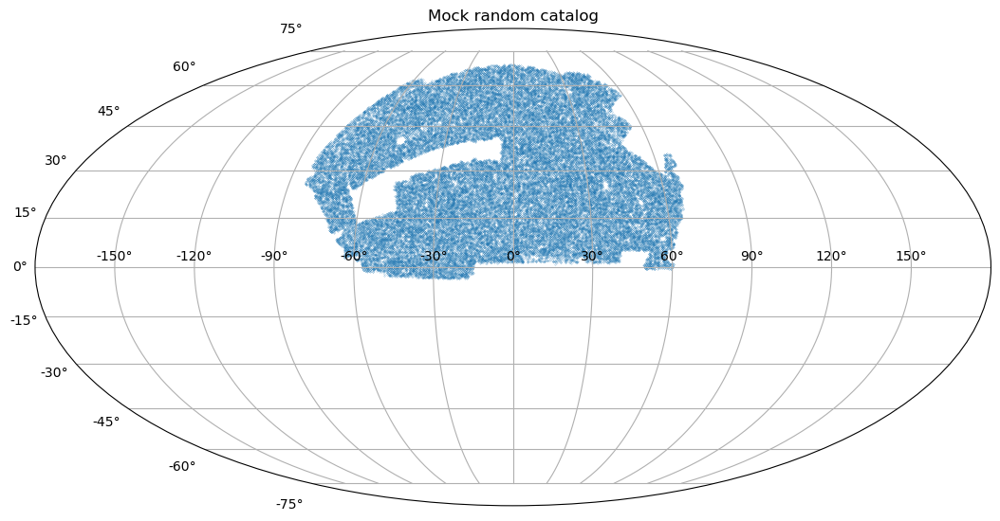

In [290]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('Mock random catalog')
ax.scatter(np.deg2rad(180-test_ra), np.deg2rad(test_dec), s=0.1, alpha=1, marker='.')
ax.grid()

In [333]:
logger.info("Generate random RA DEC and apply weights")

galcone_tot = []
part_num = [] # cumulative number

for geometry in geoms:
    gal_num = int(1e5)
    galcone = np.empty((int(gal_num),), dtype=fgal_type)
    galcone['ra'], galcone['dec'] = geometry.genrand(int(gal_num))
    galcone['w'] = geometry.weight(galcone['ra'], galcone['dec'])
    galcone = galcone[galcone['w']>0]
    galcone = apply_boss_geometry(galcone, masks)
    
    galcone_tot.append(galcone)
    part_num.append(np.sum([len(arr) for arr in galcone_tot]))

part_num = np.append(0, part_num)
galcone_tot = np.concatenate(galcone_tot)

# logger.info("Apply survey masks")
# galcone_tot = apply_boss_geometry(galcone_tot, masks)
# np.savetxt("test_rand.txt", galcone_tot, fmt="%.5f")

2025-07-02 18:16:19.088 | INFO     | __main__:<module>:1 - Generate random RA DEC and apply weights


In [334]:
part_num

array([     0,  58153, 117647, 183471])

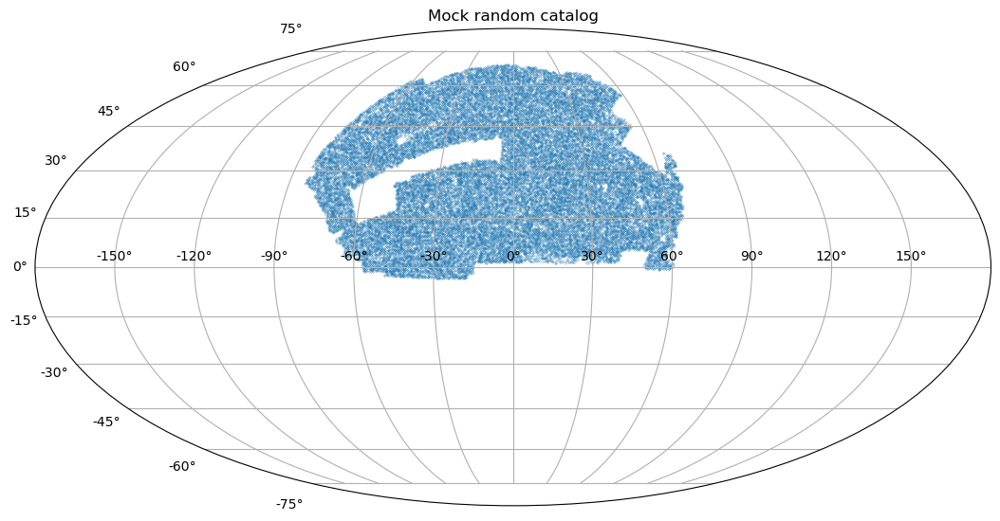

In [335]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('Mock random catalog')
ax.scatter(np.deg2rad(180-galcone_tot[:58153]['ra']), np.deg2rad(galcone_tot[:58153]['dec']), s=0.1, alpha=1, marker='.')
# ax.scatter(np.deg2rad(180-galcone_tot[58273:117680]['ra']), np.deg2rad(galcone_tot[58273:117680]['dec']), s=0.1, alpha=1, marker='.')
# ax.scatter(np.deg2rad(180-galcone_tot[117680:]['ra']), np.deg2rad(galcone_tot[117680:]['dec']), s=0.1, alpha=1, marker='.')
ax.grid()

In [330]:
logger.info("Generate random n(z)")
zmin = 0.2
zmax = 0.4
rng = np.random.default_rng(seed=9971)

galcone_tot['z'] = rng.uniform(low=zmin, high=zmax, size=len(galcone_tot))

2025-07-02 18:12:29.696 | INFO     | __main__:<module>:1 - Generate random n(z)


In [331]:
boss_part_names = ['boss_lowzcmass', 'boss_lowze2', 'boss_lowze3']
galcone_dsampled_tot = []
for ipart, nz_boss_fname in enumerate(nz_boss_fname_list):
    nofz = np.loadtxt(nz_boss_fname, usecols=(1,2,3,5)) # zmin, zmax, nbar, shell_vol
    argstart = np.argwhere(nofz[:,0] == zmin)[0,0]
    argend = np.argwhere(nofz[:,1] == zmax)[0,0]

    nofz_info = make_nofz_info(nofz[argstart:argend+2,0], nofz[argstart:argend+1,3], nofz[argstart:argend+1,2])

    curr_galcone = galcone_tot[part_num[ipart]:part_num[ipart+1]]
    galcone_dsampled = apply_nz_downsample(curr_galcone, nofz_info)
    logger.debug(len(galcone_dsampled))
    galcone_dsampled_tot.append(galcone_dsampled)

galcone_dsampled_tot = np.concatenate(galcone_dsampled_tot)

2025-07-02 18:12:29.930 | DEBUG    | __main__:<module>:12 - 58216
2025-07-02 18:12:29.944 | DEBUG    | __main__:<module>:12 - 59739
2025-07-02 18:12:29.959 | DEBUG    | __main__:<module>:12 - 59070


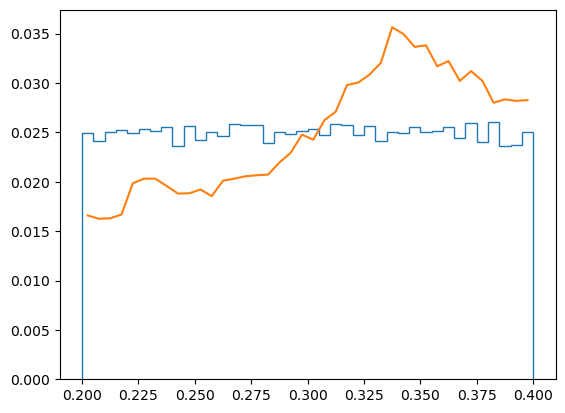

In [332]:
Nz_rand, zedges = np.histogram(galcone_dsampled_tot[:58216]['z'], bins=40)
cut = (nz_cmasslowz['zcen'] >= 0.2) & (nz_cmasslowz['zcen'] <= 0.4)
plt.stairs(Nz_rand/Nz_rand.sum(), zedges)
plt.plot(nz_cmasslowz['zcen'][cut], nz_cmasslowz['tot_w_gals'][cut]/nz_cmasslowz['tot_w_gals'][cut].sum())

#### Visualize random catalog

In [530]:
mock_rand = np.loadtxt("catalogs/Random/boss_lowzcmass_rand.txt")
len(mock_rand)

460274

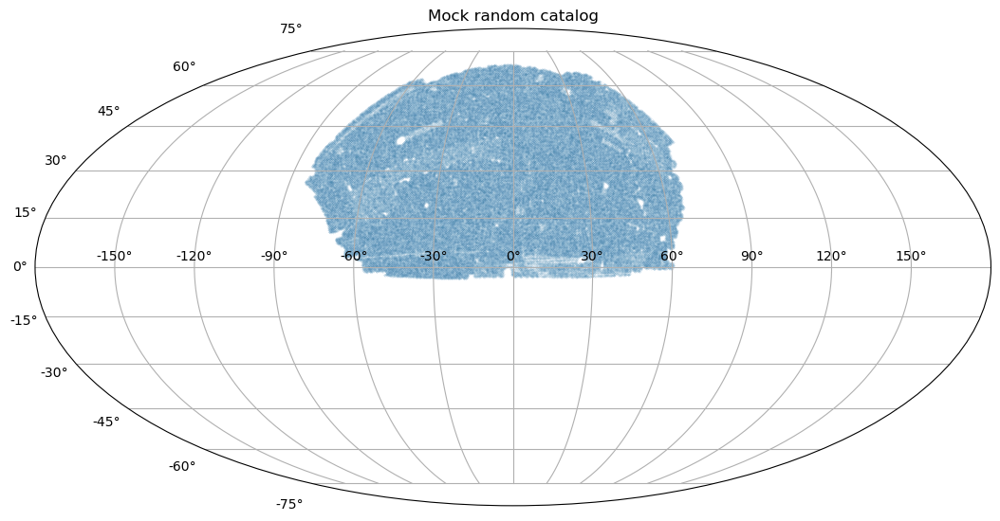

In [531]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('Mock random catalog')
ax.scatter(np.deg2rad(180-mock_rand[:,0]), np.deg2rad(mock_rand[:,1]), s=0.1, alpha=0.1, marker='.')
ax.grid()

In [245]:
boss_cmasslowz_rand = Table.read("/data2/suchen/BOSS_dr12/random0_DR12v5_CMASSLOWZTOT_North.fits", format='fits')

In [246]:
cut = (boss_cmasslowz_rand['Z'] > 0.2) & (boss_cmasslowz_rand['Z'] < 0.4)

In [247]:
boss_cmasslowz_rand = boss_cmasslowz_rand[cut]

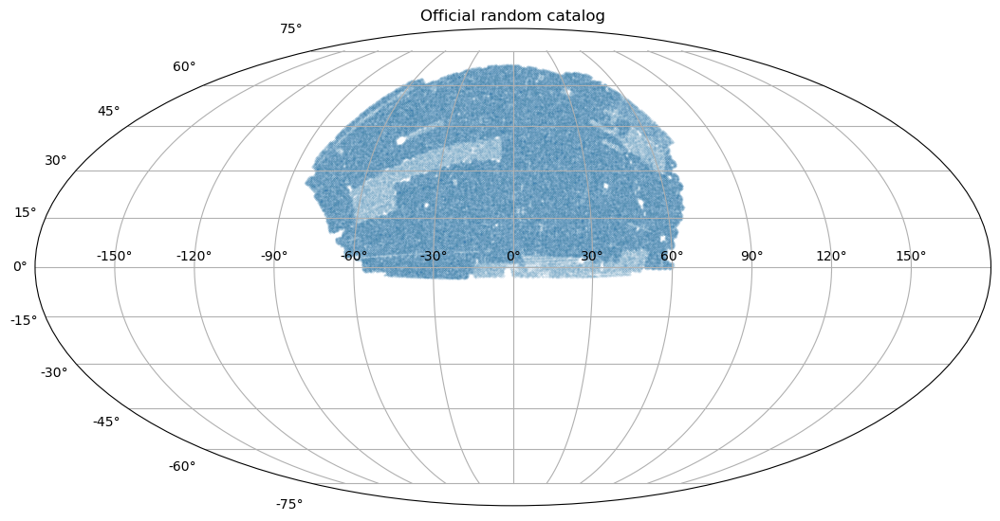

In [513]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title('Official random catalog')
ax.scatter(np.deg2rad(180-boss_cmasslowz_rand['RA'][::20]), np.deg2rad(boss_cmasslowz_rand['DEC'][::20]), s=0.1, alpha=0.1, marker='.')
ax.grid()

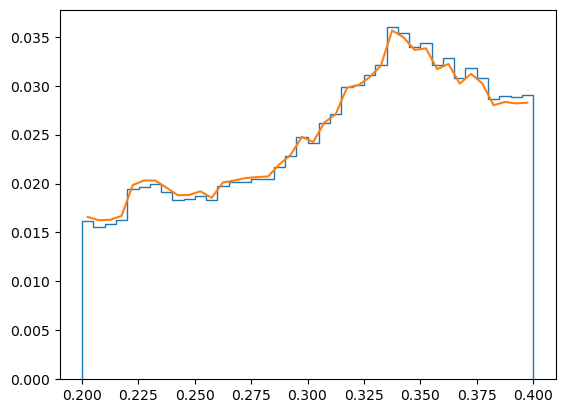

In [252]:
Nz_rand_cat, _ = np.histogram(boss_cmasslowz_rand['Z'], bins=zedges)
plt.stairs(Nz_rand_cat/Nz_rand_cat.sum(), zedges)
plt.plot(nz_cmasslowz['zcen'][40:80], nz_cmasslowz['tot_w_gals'][40:80]/(nz_cmasslowz['tot_w_gals'][40:80].sum()))

In [533]:
Nz_rand, _ = np.histogram(mock_rand[:,2], bins=zedges)
# plt.stairs(Nz_rand[:62142]/Nz_rand[:62142].sum(), zedges)
# plt.plot(nz_cmasslowz['zcen'][40:80], nz_cmasslowz['tot_w_gals'][40:80]/(nz_cmasslowz['tot_w_gals'][40:80].sum()))

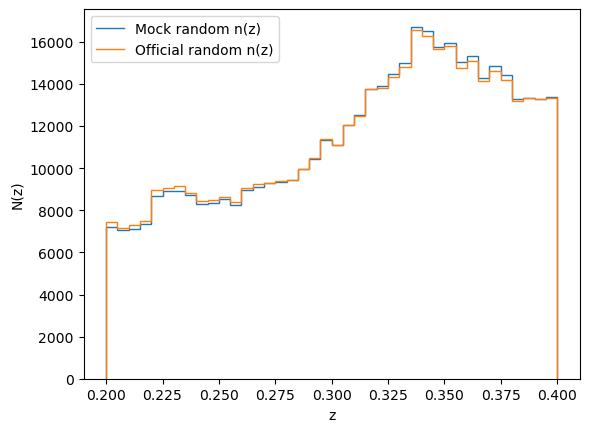

In [703]:
plt.stairs(Nz_rand, zedges, label="Mock random n(z)")
plt.stairs(Nz_rand_cat/Nz_rand_cat.sum()*Nz_rand.sum(), zedges, label="Official random n(z)")
# plt.plot(nz_cmasslowz['zcen'][40:80], nz_cmasslowz['tot_w_gals'][40:80]/(nz_cmasslowz['tot_w_gals'][40:80].sum()), label="Data n(z)", c='k')
# plt.ylim(0.01,0.038)
plt.xlabel('z')
plt.ylabel('N(z)')
plt.legend();

#### Test Mock $w_p$

In [489]:
tmp = np.loadtxt("aux/wp_real.dat")
tmp2 = np.loadtxt("aux/wp_real_box.dat")

In [490]:
rp = tmp[:,0]
wp = tmp[:,-1]
wp2 = tmp2[:,-1]

In [476]:
rpth = np.geomspace(1, 200, 500) # Mpc/h
pi = np.arange(-40, 40, 1) # Mpc/h

bias = 1.0
scale_factor = 1./1.3
h = cosmo_ccl.to_dict()["h"]
xi_rp_pi_real = np.zeros((len(rpth), len(pi)))
for i in range(len(pi)):
    xi_rp_pi_real[:,i] = bias*bias*ccl.correlation_pi_sigma(cosmo_ccl, pi=pi[i]/h, sigma=rpth/h, a=scale_factor, beta=0)

wp_th_real = np.sum(xi_rp_pi_real, axis=1)

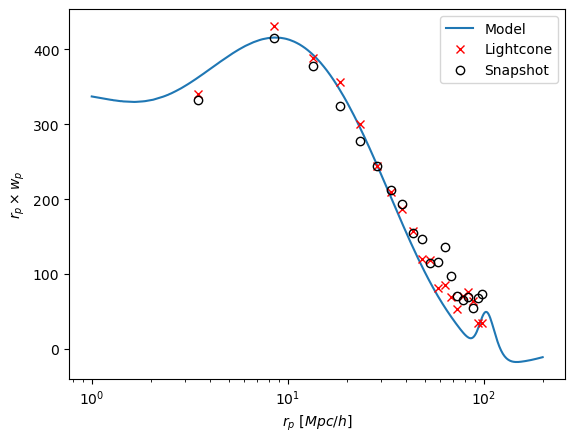

In [507]:
plt.semilogx(rpth, rpth*wp_th_real*2.34**2, label="Model")
plt.semilogx(rp, rp*wp, 'xr', label="Lightcone")
plt.semilogx(rp2, rp2*wp2, 'ok', markerfacecolor="none", label="Snapshot")
plt.xlabel(r'$r_p~[Mpc/h]$')
plt.ylabel(r'$r_p\times w_p$')
plt.legend()
# plt.xlim(5,100)
# plt.ylim(-10,300)

### 2dFLenS data & mock

In [404]:
from astropy.table import vstack

In [412]:
from tqdm import trange

In [398]:
lowz_2dflens = Table.read("/data2/suchen/2dFLenS/data_2dfloz_kidss/data_loz_atlas_kidss_160105_ntar.dat", 
                          format='ascii',
                          header_start=0, data_start=1)
higz_2dflens = Table.read("/data2/suchen/2dFLenS/data_2dfhiz_kidss/data_hiz_atlas_kidss_160105_ntar.dat",
                          format='ascii',
                          header_start=0, data_start=1)

In [471]:
lowz_n_2dflens = Table.read("/data2/suchen/2dFLenS/data_2dfloz_kidsn/data_loz_atlas_kidsn_160105_ntar.dat", 
                          format='ascii',
                          header_start=0, data_start=1)

In [472]:
len(lowz_n_2dflens)

3556

In [410]:
tmp_list = []
for i in range(1,41):
    tmp = Table.read(f"/data2/suchen/2dFLenS/data_2dfloz_kidss/rand{i:03d}_loz_atlas_kidss_160105_ntar.dat", 
                    format='ascii',
                    header_start=0, data_start=1)
    tmp_list.append(tmp)

lowz_2dflens_rand = vstack(tmp_list)

In [414]:
tmp_list = []
for i in trange(1,41):
    tmp = Table.read(f"/data2/suchen/2dFLenS/data_2dfhiz_kidss/rand{i:03d}_hiz_atlas_kidss_160105_ntar.dat", 
                    format='ascii',
                    header_start=0, data_start=1)
    tmp_list.append(tmp)

higz_2dflens_rand = vstack(tmp_list)

100%|██████████| 40/40 [00:04<00:00,  9.43it/s]


#### Make 2dFLenS $n(z)$

In [462]:
from src.io_func import loadFitsMaps

In [463]:
mask_weight_2dflens = loadFitsMaps("catalogs/masks/2dflens_geom/2dFLens_mask_weight.fits")

In [464]:
mask_2dflens = mask_weight_2dflens[0]

In [613]:
nside = hp.npix2nside(len(mask_2dflens))
nside

256

In [468]:
Area_tot = 4*np.pi*(180./np.pi)**2 # deg^2
Area_per_pix = Area_tot/len(mask_2dflens)
picked_pix_num = np.sum(mask_2dflens != 0)
survey_area = picked_pix_num * Area_per_pix

In [469]:
survey_area

533.4760232373479

In [590]:
selected_pix = np.argwhere(mask_2dflens != 0).flatten()
selected_pix

array([566784, 566785, 566788, ..., 624108, 624113, 624126])

In [643]:
slt_ra, slt_dec = hp.pix2ang(nside=nside, ipix=selected_pix, lonlat=True)

In [600]:
slt_ra_rdf = np.where(slt_ra>180, slt_ra-360, slt_ra)

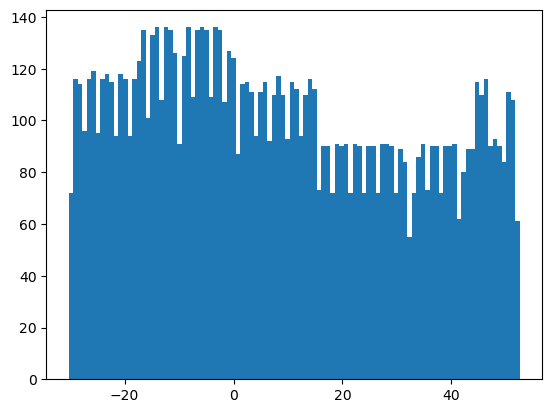

In [601]:
plt.hist(slt_ra_rdf, bins=100);

In [599]:
np.where(slt_ra>180, slt_ra-360, slt_ra).min(), np.where(slt_ra>180, slt_ra-360, slt_ra).max()

(-30.234375000000057, 52.55859374999999)

In [593]:
slt_dec.min(), slt_dec.max()

(-35.86924773198294, -26.276811557199977)

In [631]:
t_rand_num = 10000
t_ra_rdf = np.random.uniform(low=slt_ra_rdf.min(), high=slt_ra_rdf.max(), size=t_rand_num)
t_ra = np.where(t_ra_rdf < 0, t_ra_rdf + 360, t_ra_rdf)
t_cos_dec = np.random.uniform(low=np.cos(np.deg2rad(slt_dec.min())), high=np.cos(np.deg2rad(slt_dec.max())), size=t_rand_num)
t_dec = np.rad2deg(-np.arccos(t_cos_dec))

In [687]:
t_pix = hp.ang2pix(nside, t_ra, t_dec, lonlat=True)
pick = np.isin(t_pix, selected_pix)
t_picked_ra = t_ra[pick]
t_picked_dec = t_dec[pick]

In [688]:
np.sum(pick)

7703

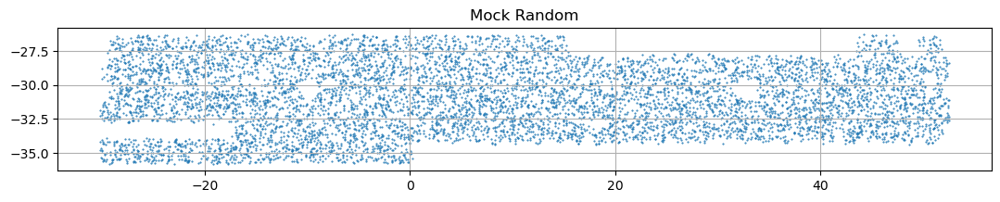

In [689]:
fig = plt.figure(figsize=(13,2))
ax = fig.add_subplot()
ax.set_title("Mock Random")
# ax.scatter(np.where(t_ra>180, t_ra-360, t_ra), t_dec, s=1, alpha=1, marker='.')
# ax.scatter(np.where(slt_ra>180, slt_ra-360, slt_ra), slt_dec, s=1, alpha=1, marker='.')
ax.scatter(np.where(t_picked_ra>180, t_picked_ra-360, t_picked_ra), t_picked_dec, s=1, alpha=1, marker='.')
ax.grid()

In [444]:
zedges = np.arange(0.15, 0.4300001, 0.005)

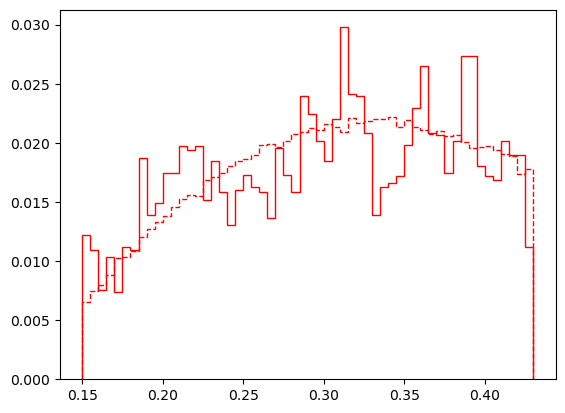

In [450]:
# plt.hist(lowz_2dflens["redshift"], bins=20, histtype='step', density=True, color='r')
select = lowz_2dflens['type'] != 2
# plt.hist(lowz_2dflens[select]["redshift"], bins=zedges, histtype='step', color='r')
plt.hist(lowz_2dflens[select]["redshift"], weights=np.ones(np.sum(select))*1./np.sum(select), bins=zedges, histtype='step', color='r');
# plt.hist(higz_2dflens["redshift"], bins=20, histtype='step', density=True, color='b');
select = lowz_2dflens_rand['type'] != 2
# plt.hist(lowz_2dflens_rand[select]["redshift"], weights=np.ones(np.sum(select)), bins=zedges, histtype='step', color='r', linestyle='--');
plt.hist(lowz_2dflens_rand[select]["redshift"], weights=np.ones(np.sum(select))*1./np.sum(select), bins=zedges, histtype='step', color='r', linestyle='--');
# plt.hist(higz_2dflens_rand["redshift"], bins=20, histtype='step', density=True, color='b');

In [489]:
nofz = np.loadtxt("catalogs/NOfZ/nbar_2dFLens_south_data.dat")

In [583]:
nofz_rand = np.loadtxt("catalogs/NOfZ/nbar_2dFLens_south_random.dat")

In [473]:
binned_2dflens_z1_south = Table.read("/data2/suchen/2dFLenS/binned_data/data_2dfbz1_kidss_160105_rat/data_bz1_atlas_kidss_160105_rat.dat", 
                                    format='ascii',
                                    header_start=0, data_start=1)

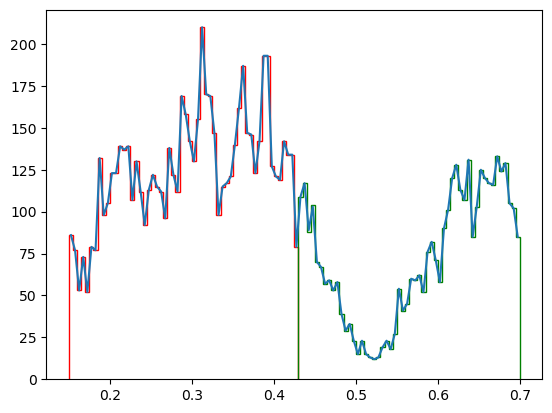

In [493]:
zedges2 = np.arange(0.2, 0.500001, 0.005)
select = lowz_2dflens['type'] != 2
plt.hist(lowz_2dflens[select]["redshift"], bins=np.arange(0.15, 0.4300001, 0.005), histtype='step', color='r');
select = higz_2dflens['type'] != 2
plt.hist(higz_2dflens[select]['redshift'], bins=np.arange(0.43, 0.700001, 0.005), histtype='step', color='g')
plt.plot(nofz[:,0], nofz[:,-1])
# plt.hist(binned_2dflens_z1_south['redshift'], bins=zedges2, histtype='step');

(0.15, 0.43)

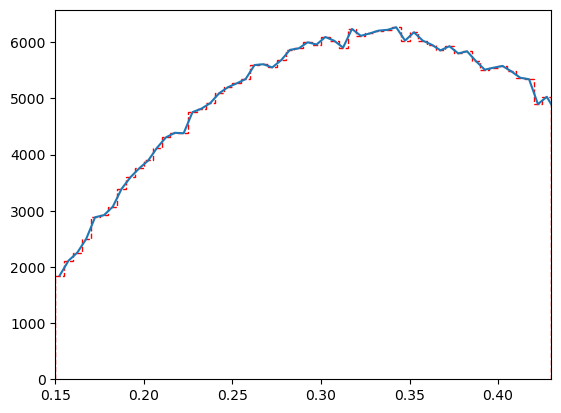

In [585]:
select = lowz_2dflens_rand["type"] != 2
plt.hist(lowz_2dflens_rand[select]["redshift"], bins=np.arange(0.15, 0.4300001, 0.005), histtype='step', color='r', linestyle='--');
plt.plot(nofz_rand[:,0], nofz_rand[:,-1])
plt.xlim(0.15, 0.43)

#### 2dFLenS mock

In [708]:
select = (lowz_2dflens['type'] != 2) & (lowz_2dflens['redshift']>0.2) & (lowz_2dflens['redshift']<0.4)
lowz_2dflens_pick = lowz_2dflens[select]
lowz_2dflens_pick["RA"] = np.where(lowz_2dflens_pick["RA"]<180,lowz_2dflens_pick["RA"], lowz_2dflens_pick["RA"]-360)

In [575]:
mock_gal_south = mock_gal[mock_gal[:,1]<-15]
mock_gal_south[:,0] = np.where(mock_gal_south[:,0]<180,mock_gal_south[:,0], mock_gal_south[:,0]-360)

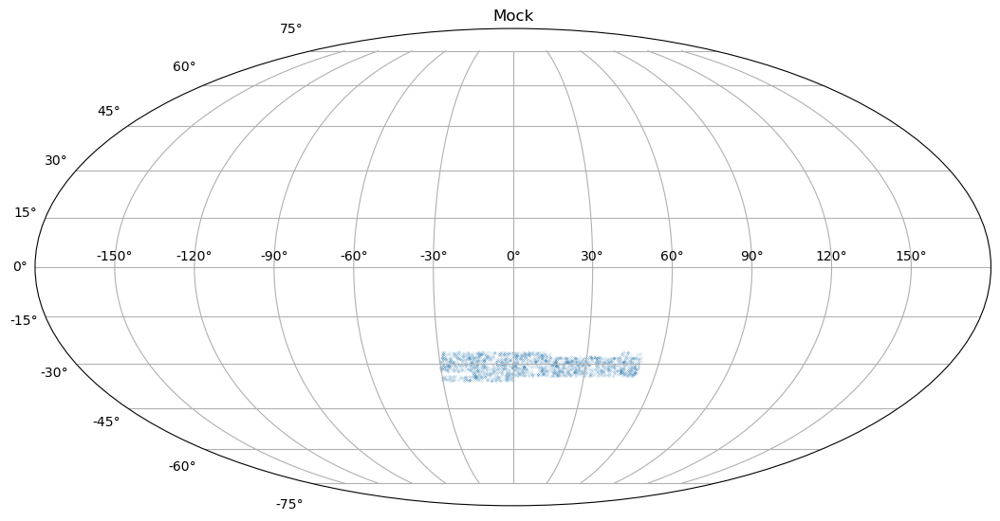

In [576]:
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection="mollweide")
ax.set_title("Mock")
ax.scatter(np.deg2rad(mock_gal_south[:,0]), np.deg2rad(mock_gal_south[:,1]), s=0.01, alpha=1, marker='.')
ax.grid()

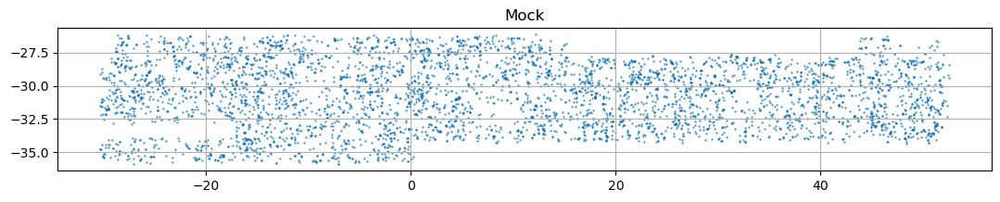

In [577]:
fig = plt.figure(figsize=(13,2))
ax = fig.add_subplot()
ax.set_title("Mock")
ax.scatter((mock_gal_south[:,0]), (mock_gal_south[:,1]), s=1, alpha=1, marker='.')
ax.grid()

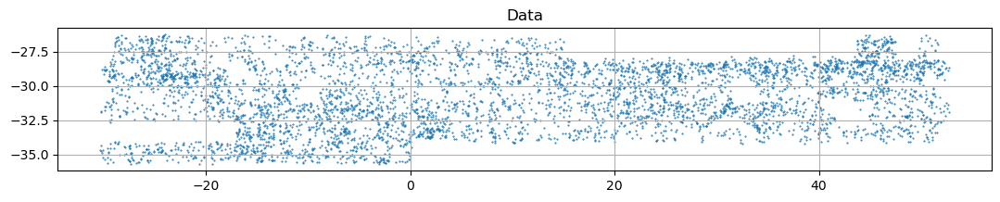

In [710]:
fig = plt.figure(figsize=(13,2))
ax = fig.add_subplot()
ax.set_title("Data")
ax.scatter((lowz_2dflens_pick["RA"]), (lowz_2dflens_pick["Dec"]), s=1, alpha=1, marker='.')
ax.grid()

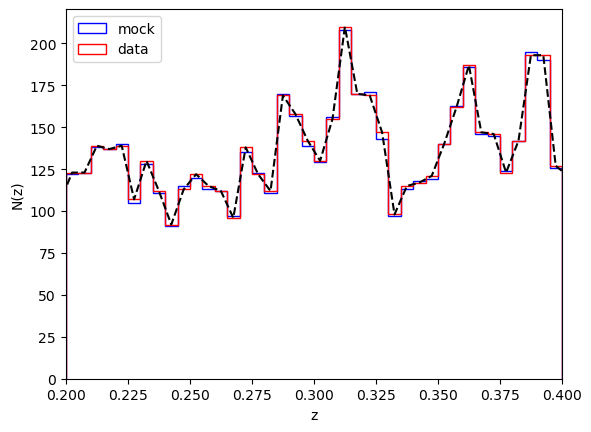

In [704]:
plt.hist(mock_gal_south[:,2], bins=np.arange(0.2, 0.4+1e-5, 0.005), histtype='step', color='b', label='mock')
plt.hist(lowz_2dflens_pick["redshift"], bins=np.arange(0.2, 0.4+1e-5, 0.005), histtype='step', color='r', label='data');
plt.plot(nofz[:,0], nofz[:,-1], '--k')
plt.xlim(0.2,0.4)
plt.xlabel('z')
plt.ylabel('N(z)')
plt.legend()

In [690]:
mock_rand_2dflens = np.loadtxt("catalogs/Random/2dflens_random_cat.txt")
len(mock_rand_2dflens)

238971

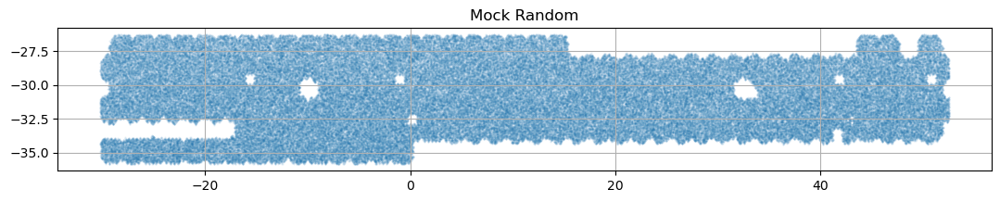

In [692]:
fig = plt.figure(figsize=(13,2))
ax = fig.add_subplot()
ax.set_title("Mock Random")
ax.scatter(np.where(mock_rand_2dflens[:,0]>180, mock_rand_2dflens[:,0]-360, mock_rand_2dflens[:,0]), (mock_rand_2dflens[:,1]), s=1, alpha=0.1, marker='.')
ax.grid()

In [651]:
lowz_2dflens_rand.colnames

['RA',
 'Dec',
 'redshift',
 'x[Mpc/h]',
 'y[Mpc/h]',
 'z[Mpc/h]',
 'wei',
 'ijack',
 'type',
 'itile']

In [670]:
len(lowz_2dflens_rand)

338920

(-34.247213249999994, 56.63012825)

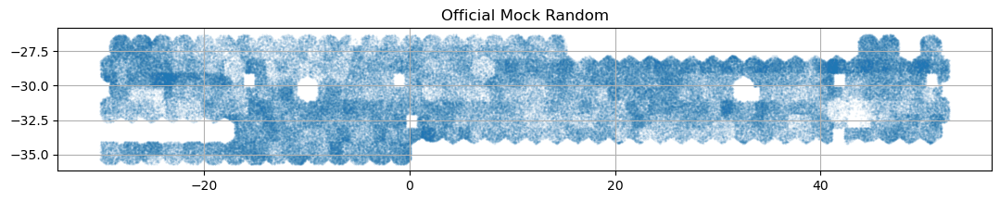

In [695]:
fig = plt.figure(figsize=(13,2))
ax = fig.add_subplot()
ax.set_title("Official Mock Random")
select = (lowz_2dflens_rand["redshift"] > 0.2) & (lowz_2dflens_rand["redshift"] < 0.4) & (lowz_2dflens_rand["type"] != 2)
ax.scatter(np.where(lowz_2dflens_rand[select]["RA"]>180, lowz_2dflens_rand["RA"][select]-360, lowz_2dflens_rand[select]["RA"]), (lowz_2dflens_rand[select]["Dec"]), s=1, alpha=0.1, marker='.')
ax.grid()
ax.set_xlim()

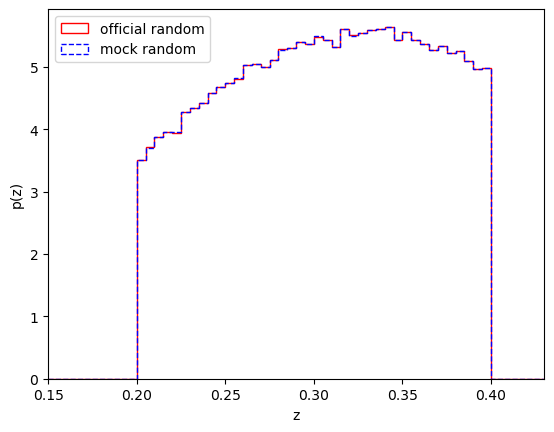

In [711]:
select = (lowz_2dflens_rand["type"] != 2) & (lowz_2dflens_rand["redshift"] > 0.2) & (lowz_2dflens_rand["redshift"] < 0.4)
plt.hist(lowz_2dflens_rand[select]["redshift"], bins=np.arange(0.15, 0.4300001, 0.005), histtype='step', color='r', density=True, label='official random');
plt.hist(mock_rand_2dflens[:,2], bins=np.arange(0.15, 0.4300001, 0.005), histtype='step', density=True, color='b', linestyle='--', label='mock random')
# plt.plot(nofz_rand[:,0], nofz_rand[:,-1])
plt.xlim(0.15, 0.43)
plt.xlabel('z')
plt.ylabel('p(z)')
plt.legend();

### KiDS-1000 Mock

#### Angular distribution

In [51]:
mask_file = "/home/suchen/Program/CosmoGrid/catalogs/masks/mask_KiDS_North_1024.fits"
mask = loadFitsMaps(mask_file)
mask = mask[0]
nside = hp.npix2nside(len(mask))
mask_dsample = hp.ud_grade(mask, nside_out=512, order_out='RING')
mask = np.where(mask > 0, 1, 0)
mask_dsample = np.where(mask_dsample > 0.25, 1, 0)

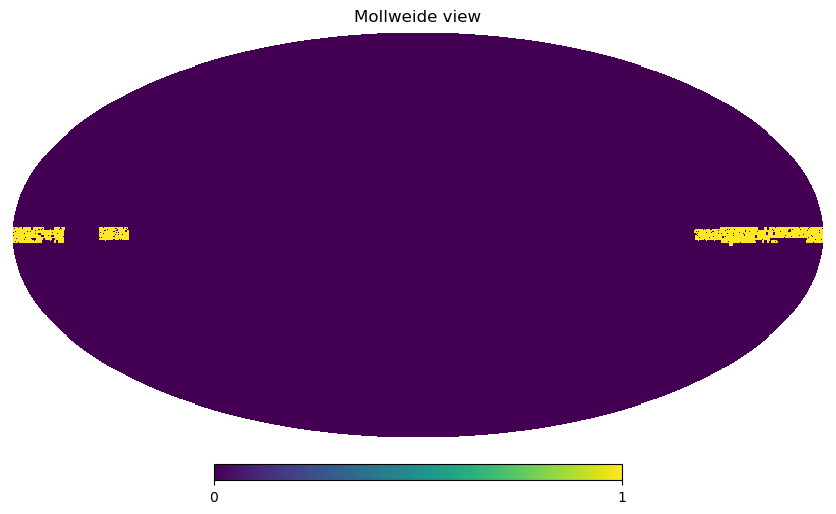

In [52]:
hp.mollview(mask)

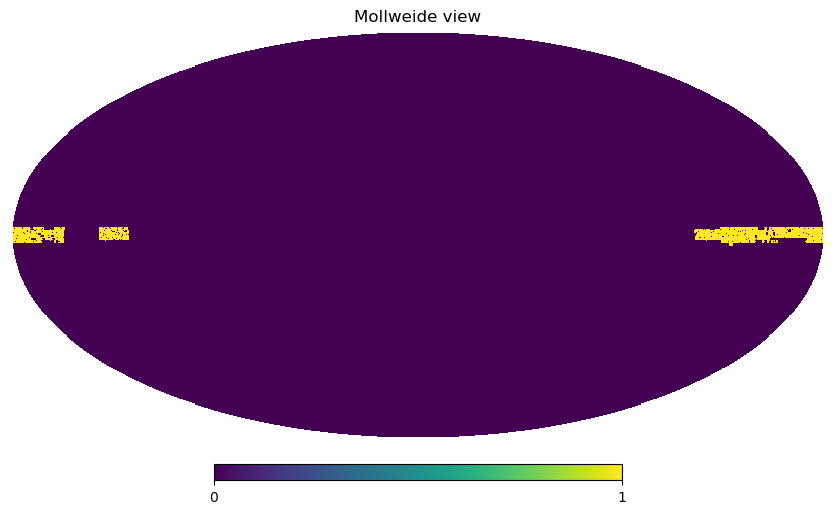

In [53]:
hp.mollview(mask_dsample)

In [239]:
pick_pix_ra, pick_pix_dec = hp.pix2ang(nside, np.argwhere(mask!=0).flatten(), lonlat=True)

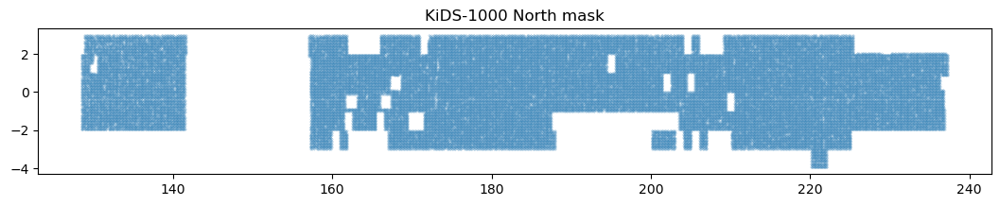

In [240]:
fig = plt.figure(figsize=(13,2))
plt.title("KiDS-1000 North mask")
plt.scatter(pick_pix_ra, pick_pix_dec, s=0.01)
# plt.ylim(95,85)

In [286]:
def rotate_pix(pix, nside, rot_degrees):
    r = R.from_euler('zyx', rot_degrees, degrees=True)
    norm_vec_x, norm_vec_y, norm_vec_z = hp.pix2vec(nside=nside, ipix=pix)
    norm_vec = np.c_[norm_vec_x, norm_vec_y, norm_vec_z]
    new_vec = r.apply(norm_vec)
    pix_new = hp.vec2pix(nside=nside, x=new_vec[:,0], y=new_vec[:,1], z=new_vec[:,2])
    
    return pix_new

In [449]:
# new_mask1 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[0,50,0])
# new_mask2 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[90,0,-50])
# new_mask3 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[180,-50,0])
# new_mask4 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[270,0,50])
new_mask1 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[0,-50,0])
new_mask2 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[90,0,50])
new_mask3 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[180,50,0])
new_mask4 = rotate_pix(np.argwhere(mask!=0).flatten(), nside=nside, rot_degrees=[270,0,-50])

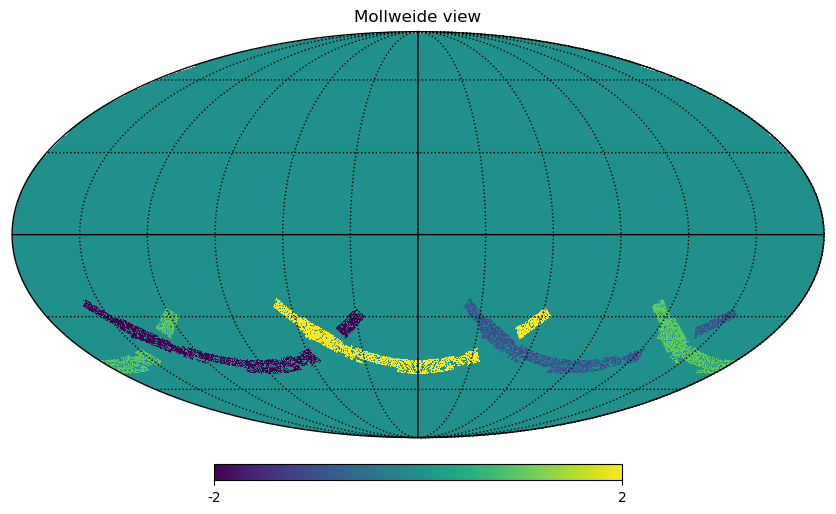

In [450]:
show_mask = np.zeros((12*nside*nside))
show_mask[new_mask1] = 1
show_mask[new_mask2] = -1
show_mask[new_mask3] = 2
show_mask[new_mask4] = -2
hp.mollview(show_mask)
hp.graticule()

In [740]:
pick_pix_ra_rdf = np.where(pick_pix_ra>180, pick_pix_ra-360, pick_pix_ra)

In [763]:
Area = 4*np.pi*(180/np.pi)**2 * (np.sum(mask!=0)/len(mask)) # deg^2
Area

442.45856160315884

In [773]:
sample_area = (pick_pix_ra.max() - pick_pix_ra.min()) * (pick_pix_dec.max() - pick_pix_dec.min())
sample_area

755.4207253818372

In [794]:
ngal = 6.0 # arcmin^-2
t_rand_num = int(ngal * sample_area * 60**2)
# t_ra_rdf = np.random.uniform(low=pick_pix_ra_rdf.min(), high=pick_pix_ra_rdf.max(), size=t_rand_num)
# t_ra = np.where(t_ra_rdf < 0, t_ra_rdf + 360, t_ra_rdf)
t_ra = np.random.uniform(low=pick_pix_ra.min(), high=pick_pix_ra.max(), size=t_rand_num)
t_cos_dec = np.random.uniform(low=np.cos(np.deg2rad(90-pick_pix_dec.min())), high=np.cos(np.deg2rad(90-pick_pix_dec.max())), size=t_rand_num)
t_dec = np.rad2deg(np.arccos(t_cos_dec))

In [743]:
pick_pix_dec.min(), pick_pix_dec.max()

(-3.957150813415211, 2.9855060057465295)

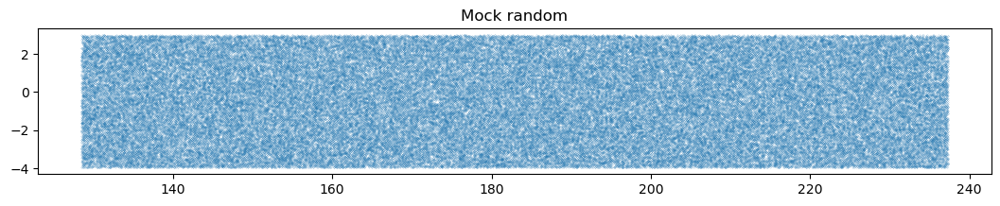

In [782]:
fig = plt.figure(figsize=(13,2))
plt.title("Mock random")
plt.scatter(t_ra[::100], 90-t_dec[::100], s=0.01)

In [791]:
sample_pix = hp.ang2pix(nside, t_ra, 90-t_dec, lonlat=True)
picked_pix_in_sample = np.isin(sample_pix, np.argwhere(mask!=0).flatten())
picked_ra = t_ra[picked_pix_in_sample]
picked_dec = t_dec[picked_pix_in_sample]

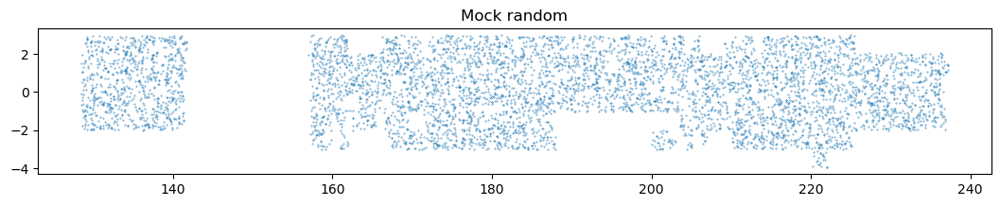

In [776]:
fig = plt.figure(figsize=(13,2))
plt.title("Mock random")
plt.scatter(picked_ra, 90-picked_dec, s=0.1)

In [792]:
len(picked_ra)/len(t_ra)

0.5844185206323833

In [785]:
Area/sample_area

0.585711440971536

In [793]:
len(picked_ra)/Area/60/60

6.046622739779977

#### Redshift distribution $n(z)$

In [13]:
nz_file_fmt = "/home/suchen/Program/CosmoGrid/catalogs/NOfZ/srcs/K1000_NS_V1.0.0A_ugriZYJHKs_photoz_SG_mask_LF_svn_309c_2Dbins_v2_SOMcols_Fid_blindC_TOMO{}_Nz.asc"

In [14]:
src_plane_zctrs = np.concatenate([np.arange(0.1,1.0,0.05), np.arange(1.0, 2.0, 0.1), np.array([2.0,2.2,2.4,2.8,3.2,3.6])])
print(src_plane_zctrs)
print(len(src_plane_zctrs))

[0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75
 0.8  0.85 0.9  0.95 1.   1.1  1.2  1.3  1.4  1.5  1.6  1.7  1.8  1.9
 2.   2.2  2.4  2.8  3.2  3.6 ]
34


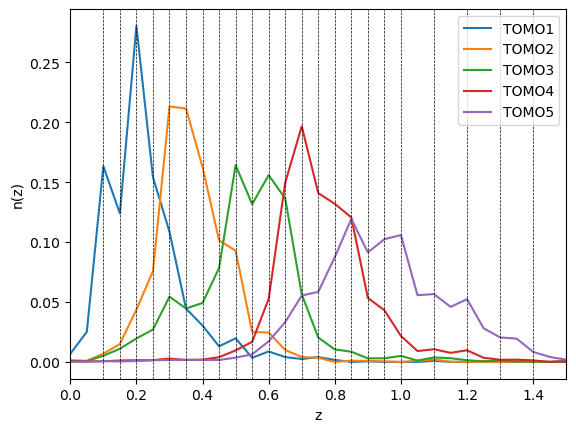

In [15]:
nofz_list = []
for i in range(1,6):
    filename = nz_file_fmt.format(i)
    f=np.loadtxt(filename)
    plt.plot(f[:,0],f[:,1],label='TOMO{}'.format(i))
    nofz_list.append(f)

for zs in src_plane_zctrs:
    plt.axvline(zs, c='k', ls='--', lw=0.5)
plt.xlabel('z')
plt.ylabel('n(z)')
plt.xlim(0,1.5)
plt.legend()

In [843]:
tomo_bin
zedges = 0.5*(nofz_list[0][:-1,0] + nofz_list[0][1:,0])
zctrs = nofz_list[0][1:-1,0]
nz = nofz_list[0][1:-1,1]

array([0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.325, 0.375, 0.425,
       0.475, 0.525, 0.575, 0.625, 0.675, 0.725, 0.775, 0.825, 0.875,
       0.925, 0.975, 1.025, 1.075, 1.125, 1.175, 1.225, 1.275, 1.325,
       1.375, 1.425, 1.475, 1.525, 1.575, 1.625, 1.675, 1.725, 1.775,
       1.825, 1.875, 1.925, 1.975, 2.025, 2.075, 2.125, 2.175, 2.225,
       2.275, 2.325, 2.375, 2.425, 2.475, 2.525, 2.575, 2.625, 2.675,
       2.725, 2.775, 2.825, 2.875, 2.925, 2.975, 3.025, 3.075, 3.125,
       3.175, 3.225, 3.275, 3.325, 3.375, 3.425, 3.475, 3.525, 3.575,
       3.625, 3.675, 3.725, 3.775, 3.825, 3.875, 3.925, 3.975, 4.025,
       4.075, 4.125, 4.175, 4.225, 4.275, 4.325, 4.375, 4.425, 4.475,
       4.525, 4.575, 4.625, 4.675, 4.725, 4.775, 4.825, 4.875, 4.925,
       4.975, 5.025, 5.075, 5.125, 5.175, 5.225, 5.275, 5.325, 5.375,
       5.425, 5.475, 5.525, 5.575, 5.625, 5.675, 5.725, 5.775, 5.825,
       5.875, 5.925])

In [840]:
assert len(nz) == len(zedges) - 1

In [847]:
Ngal = 10000
samples = []
for i in range(len(nz)-1):
    iNgal = np.around(Ngal*nz[i])
    samples.append(np.random.uniform(low=zedges[i], high=zedges[i+1], size=int(iNgal)))

samples = np.concatenate(samples)

(0.0, 1.5)

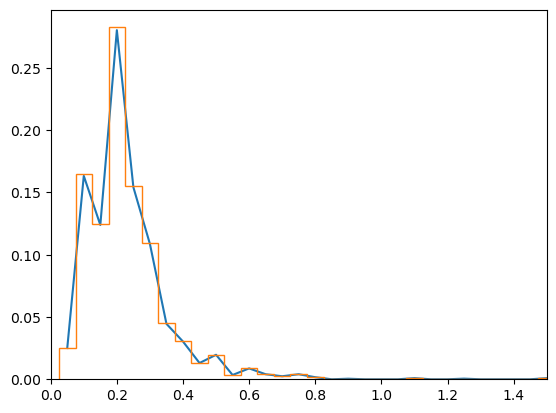

In [844]:
plt.plot(zctrs, nz)
plt.hist(samples, bins=zedges, histtype='step', weights=np.ones(len(samples))/len(samples));
plt.xlim(0,1.5)

#### Check Mock

In [451]:
import matplotlib.colors as mcolors
import matplotlib.lines as mlines

In [452]:
clist = list(mcolors.TABLEAU_COLORS)

In [183]:
%%time
bg_gal_ensemble = []
for tomo_bin in range(5):
    bg_galcat = np.loadtxt(f"catalogs/Shape/cosmo_{cosmo_label}_run_0_kids_north_tomo{tomo_bin+1}_wo_noise.txt", dtype=bgal_type)
    print(f"catalogs/Shape/cosmo_{cosmo_label}_run_0_kids_north_tomo{tomo_bin+1}_wo_noise.txt")
    bg_gal_ensemble.append(bg_galcat)

catalogs/Shape/cosmo_000001_run_0_kids_north_tomo1_wo_noise.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo2_wo_noise.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo4_wo_noise.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo5_wo_noise.txt
CPU times: user 1.61 s, sys: 170 ms, total: 1.78 s
Wall time: 1.77 s


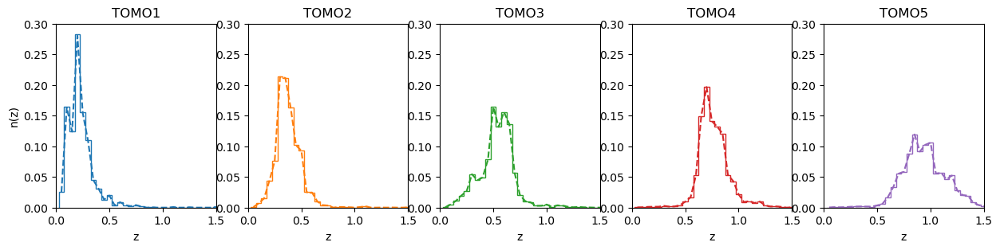

In [127]:
fig = plt.figure(figsize=(15,3))
for tomo_bin in range(5):
    ax = fig.add_subplot(1, 5, tomo_bin+1)
    ax.set_title(f'TOMO{tomo_bin+1}')
    zedges = 0.5*(nofz_list[tomo_bin][:-1,0] + nofz_list[tomo_bin][1:,0])
    zctrs = nofz_list[tomo_bin][1:-1,0]
    nz = nofz_list[tomo_bin][1:-1,1]
    bg_galcat = bg_gal_ensemble[tomo_bin]
    ax.hist(bg_galcat['z'], bins=zedges, histtype='step', weights=np.ones(len(bg_galcat))/len(bg_galcat), color=clist[tomo_bin]);
    ax.plot(zctrs, nz, color=clist[tomo_bin], ls='--')
    ax.set_xlim(0,1.5)
    ax.set_ylim(0,0.3)
    ax.set_xlabel('z')
    if tomo_bin == 0:
        ax.set_ylabel('n(z)')

Text(0, 0.5, 'n(z)')

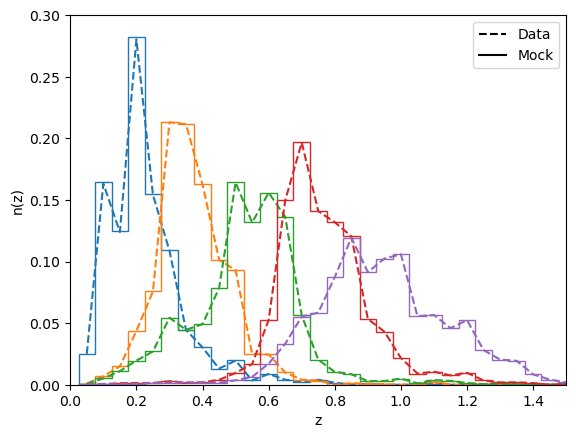

In [128]:
for tomo_bin in range(5):
    zedges = 0.5*(nofz_list[tomo_bin][:-1,0] + nofz_list[tomo_bin][1:,0])
    zctrs = nofz_list[tomo_bin][1:-1,0]
    nz = nofz_list[tomo_bin][1:-1,1]
    
    bg_galcat = bg_gal_ensemble[tomo_bin]

    plt.hist(bg_galcat['z'], bins=zedges, histtype='step', weights=np.ones(len(bg_galcat))/len(bg_galcat), color=clist[tomo_bin]);
    plt.plot(zctrs, nz, c=clist[tomo_bin], ls='--')
    
plt.xlim(0,1.5)
plt.ylim(0,0.3)
line_data = mlines.Line2D([],[], color='k', linestyle='--', label='Data')
line_mock = mlines.Line2D([],[], color='k', linestyle='-', label='Mock')
plt.legend(handles=[line_data, line_mock])
plt.xlabel('z')
plt.ylabel('n(z)')

In [129]:
itomo = 2 # Actually TOMO3
bg_galcat = bg_gal_ensemble[itomo]

Text(0, 0.5, 'DEC')

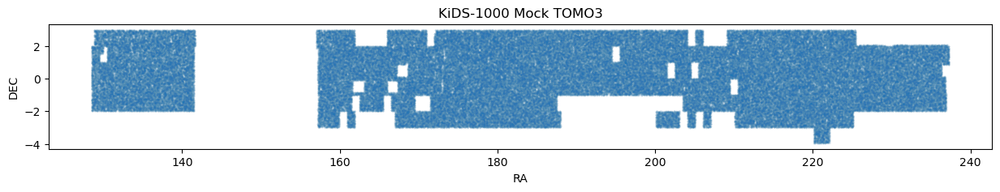

In [130]:
fig = plt.figure(figsize=(15,2))
ax = fig.add_subplot()
ax.set_title(f'KiDS-1000 Mock TOMO{itomo+1}')
ax.scatter((bg_galcat['ra']), (bg_galcat['dec']), s=0.1, alpha=0.1)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')

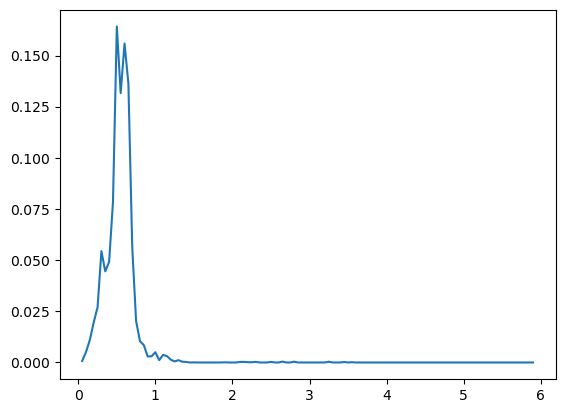

In [1192]:
zctrs = nofz_list[itomo][1:-1,0]
nz = nofz_list[itomo][1:-1,1]
# nz = np.heaviside(zctrs-0.99,0) - np.heaviside(zctrs-1.01,0)
plt.plot(zctrs, nz)
srcs = ccl.WeakLensingTracer(cosmo_ccl, dndz=(zctrs, nz))

ell = np.arange(10000)
cl_kk = ccl.angular_cl(cosmo_ccl, srcs, srcs, ell=ell)

theta = np.geomspace(10, 1000, 300)
xi_p = ccl.correlation(cosmo_ccl, ell=ell, C_ell=cl_kk, theta=theta/60., type='GG+')
xi_m = ccl.correlation(cosmo_ccl, ell=ell, C_ell=cl_kk, theta=theta/60., type='GG-')

In [1206]:
tmp = np.loadtxt("aux/gg_cosmic_shear_wo_noise.txt")

(-5e-05, 0.0003)

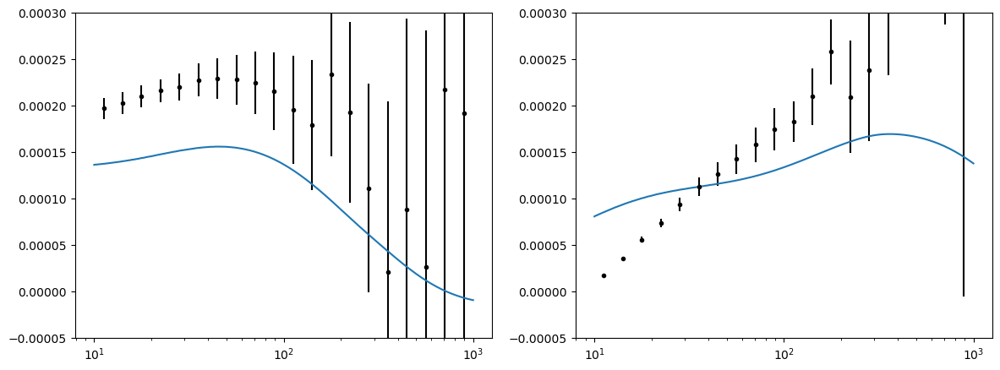

In [1213]:
tmp = np.loadtxt("aux/gg_cosmic_shear_wo_noise.txt")

fig = plt.figure(figsize=(14,5))
ax = fig.add_subplot(121)
ax.errorbar(tmp[:,0], tmp[:,0]*tmp[:,3], tmp[:,0]*tmp[:,7], fmt='.k')
ax.semilogx(theta, theta*xi_p)
ax.set_ylim(-0.00005, 0.0003)
ax = fig.add_subplot(122)
ax.errorbar(tmp[:,0], tmp[:,0]*tmp[:,4], tmp[:,0]*tmp[:,8], fmt='.k')
ax.semilogx(theta, theta*xi_m)
ax.set_ylim(-0.00005, 0.0003)

(-5e-05, 0.0003)

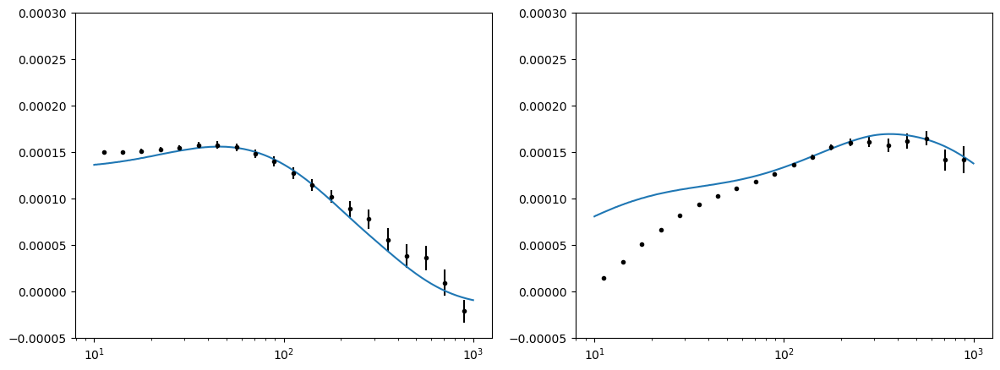

In [1214]:
tmp = np.loadtxt("aux/gg_cosmic_shear_wo_noise_fullsky.txt")

fig = plt.figure(figsize=(14,5))
ax = fig.add_subplot(121)
ax.errorbar(tmp[:,0], tmp[:,0]*tmp[:,3], tmp[:,0]*tmp[:,7], fmt='.k')
ax.semilogx(theta, theta*xi_p)
ax.set_ylim(-0.00005, 0.0003)
ax = fig.add_subplot(122)
ax.errorbar(tmp[:,0], tmp[:,0]*tmp[:,4], tmp[:,0]*tmp[:,8], fmt='.k')
ax.semilogx(theta, theta*xi_m)
ax.set_ylim(-0.00005, 0.0003)

#### Check Mock 2

In [459]:
%%time
bg_gal_ensemble = []
for ipart in range(8):
    bg_galcat = np.loadtxt(f"catalogs/Shape/cosmo_{cosmo_label}_run_0_kids_north_tomo3_wo_noise_part{ipart+1}.txt", dtype=bgal_type)
    print(f"catalogs/Shape/cosmo_{cosmo_label}_run_0_kids_north_tomo3_wo_noise_part{ipart+1}.txt")
    bg_gal_ensemble.append(bg_galcat)

catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part1.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part2.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part3.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part4.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part5.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part6.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part7.txt
catalogs/Shape/cosmo_000001_run_0_kids_north_tomo3_wo_noise_part8.txt
CPU times: user 445 ms, sys: 15.5 ms, total: 460 ms
Wall time: 451 ms


In [470]:
ipart = 2
bg_galcat = bg_gal_ensemble[ipart]

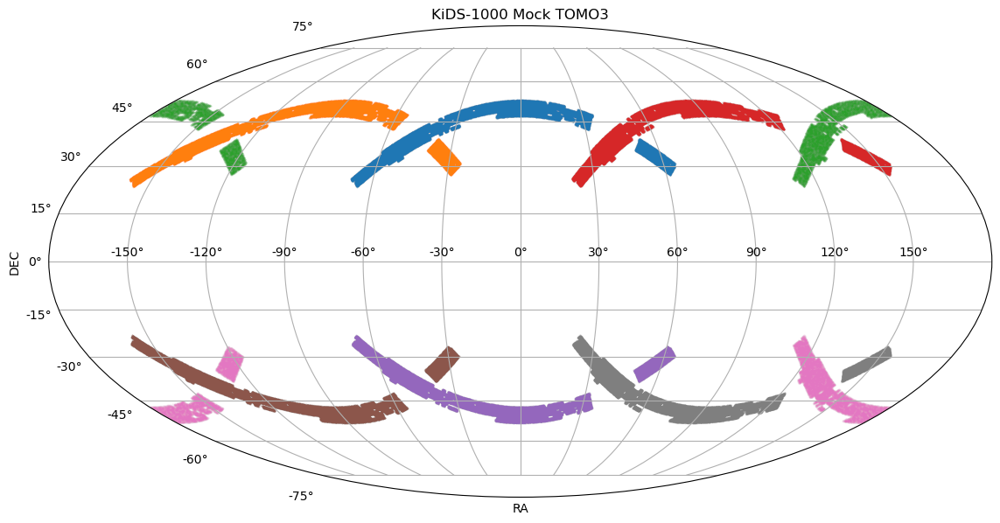

In [472]:
fig = plt.figure(figsize=(15,7))
ax = fig.add_subplot(projection="mollweide")
ax.set_title(f'KiDS-1000 Mock TOMO3')
for ipart in range(8):
    bg_galcat = bg_gal_ensemble[ipart]
    ax.scatter(np.deg2rad(180-bg_galcat['ra']), np.deg2rad(bg_galcat['dec']), s=0.1, alpha=0.1)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.grid()

In [133]:
tmp = np.loadtxt("aux/gg_cosmic_shear_tomo3_wo_noise_theory.txt")
rr_th = tmp[:,0]
xip_th = tmp[:,1]
xim_th = tmp[:,2]

In [134]:
xip_data_list = []
xim_data_list = []
xip_err_list  = []
xim_err_list  = []
for ipart in range(8):
    tmp = np.loadtxt(f"aux/gg_cosmic_shear_tomo3_wo_noise_part{ipart+1}.txt")
    if ipart == 0:
        rr = tmp[:,1]
    xip_data_list.append(tmp[:,3])
    xim_data_list.append(tmp[:,4])
    xip_err_list.append((tmp[:,7]))
    xim_err_list.append((tmp[:,8]))

In [136]:
xi_p_data_mean = np.mean(xip_data_list, axis=0)
xi_p_data_std = np.std(xip_data_list, axis=0)
xi_p_data_jkstd_mean = np.mean(xip_err_list, axis=0)
xi_m_data_mean = np.mean(xim_data_list, axis=0)
xi_m_data_std = np.std(xim_data_list, axis=0)
xi_m_data_jkstd_mean = np.mean(xim_err_list, axis=0)

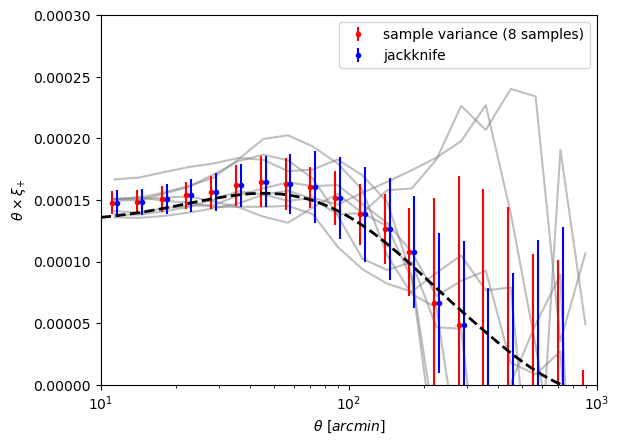

In [158]:
for ipart in range(8):
    plt.plot(rr, rr*xip_data_list[ipart], c='grey', alpha=0.5)

fac = 0.1
shift = (rr[1]/rr[0])**fac
plt.errorbar(rr/shift, rr*xi_p_data_mean, rr*xi_p_data_std, fmt='.r', label='sample variance (8 samples)')
plt.errorbar(rr*shift, rr*xi_p_data_mean, rr*xi_p_data_jkstd_mean, fmt='.b', label='jackknife')
plt.semilogx(rr_th, rr_th*xip_th, '--k', lw=2)
plt.xlim(10, 1000)
plt.ylim(0,0.0003)
plt.xlabel(r'$\theta~[arcmin]$')
plt.ylabel(r'$\theta\times\xi_{+}$')
plt.legend();

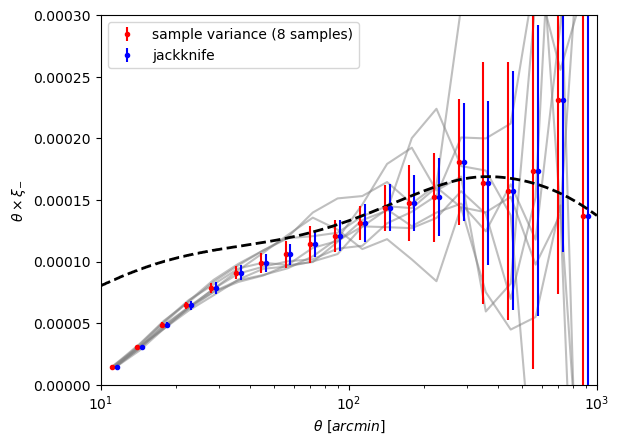

In [159]:
for ipart in range(8):
    plt.plot(rr, rr*xim_data_list[ipart], c='grey', alpha=0.5)

fac = 0.1
shift = (rr[1]/rr[0])**fac
plt.errorbar(rr/shift, rr*xi_m_data_mean, rr*xi_m_data_std, fmt='.r', label='sample variance (8 samples)')
plt.errorbar(rr*shift, rr*xi_m_data_mean, rr*xi_m_data_jkstd_mean, fmt='.b', label='jackknife')
plt.semilogx(rr_th, rr_th*xim_th, '--k', lw=2)
plt.xlim(10, 1000)
plt.ylim(0,0.0003)
plt.xlabel(r'$\theta~[arcmin]$')
plt.ylabel(r'$\theta\times\xi_{-}$')
plt.legend();

In [501]:
import numpy as np
from matplotlib import pyplot as plt
import pyccl as ccl
from astropy.table import Table
from loguru import logger

from src.io_func import get_cosmo_from_file

''' general setup '''
cosmo_label = 1
cosmo_par_fmt = "/data3/suchen/CosmoGridV1/grid/cosmo_{:06d}/run_0/params.yml"
tomo_bin = 3
nz_file_fmt = "/home/suchen/Program/CosmoGrid/catalogs/NOfZ/srcs/K1000_NS_V1.0.0A_ugriZYJHKs_photoz_SG_mask_LF_svn_309c_2Dbins_v2_SOMcols_Fid_blindC_TOMO{}_Nz.asc"

''' cosmic shear theory '''
logger.info("Get cosmology and n(z)")

cosmo_ccl = get_cosmo_from_file(cosmo_par_fmt.format(cosmo_label), otype='ccl')

filename = nz_file_fmt.format(tomo_bin)
nofz = np.loadtxt(filename)

logger.info("Initialize CCL")

lens = ccl.WeakLensingTracer(cosmo_ccl, dndz=(nofz[:,0], nofz[:,1]))

logger.info("Calculate C_ell")

ell = np.geomspace(1, 10000, 5000)
C_ell = ccl.angular_cl(cosmo_ccl, lens, lens, ell)

2025-07-15 15:25:27.818 | INFO     | __main__:<module>:16 - Get cosmology and n(z)
2025-07-15 15:25:27.822 | INFO     | __main__:<module>:23 - Initialize CCL
2025-07-15 15:25:28.052 | INFO     | __main__:<module>:27 - Calculate C_ell
2025-07-15 15:25:29.392 | INFO     | __main__:<module>:32 - Calculate xi+/xi-


In [545]:
a = 150.0               # 平滑过渡的中心点
width = 50        # 平滑宽度，越小过渡越陡
boost_factor = 1.5    # 在x<a区域想要放大的因子

# 平滑函数 S(x)
S = 1 / (1 + np.exp((ell - a)/width))  # x<a时趋近于1，x>a趋近于0

# 构造boost因子函数
boost_profile = 1 + (boost_factor - 1) * S

(0.0, 1000.0)

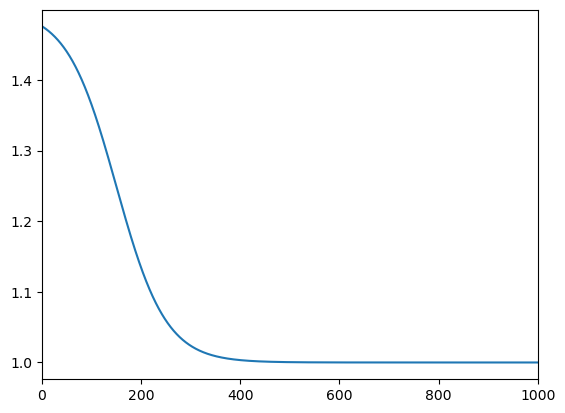

In [546]:
plt.plot(ell, boost_profile)
plt.xlim(0,1000)

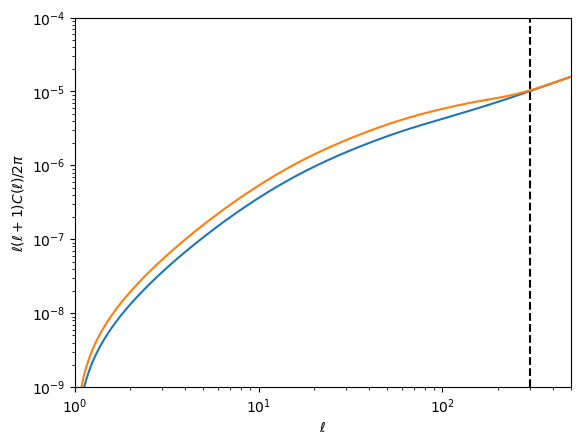

In [572]:
C_ell2 = C_ell.copy()
C_ell2 *= boost_profile

plt.loglog(ell, C_ell*ell*(ell+1)/2/np.pi)
plt.loglog(ell, C_ell2*ell*(ell+1)/2/np.pi)
plt.axvline(300, c='k', ls='--')
plt.ylim(1e-9, 1e-4)
plt.xlim(1, 500)
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C(\ell)/2\pi$');

In [565]:
theta = np.geomspace(1, 1000, 500) # arcmin
xi_p = ccl.correlation(cosmo_ccl, ell=ell, C_ell=C_ell, theta=theta/60., type='GG+')
xi_m = ccl.correlation(cosmo_ccl, ell=ell, C_ell=C_ell, theta=theta/60., type='GG-')
xi_p2 = ccl.correlation(cosmo_ccl, ell=ell, C_ell=C_ell2, theta=theta/60., type='GG+')
xi_m2 = ccl.correlation(cosmo_ccl, ell=ell, C_ell=C_ell2, theta=theta/60., type='GG-')

Text(0, 0.5, '$\\theta\\times\\xi_{+}$')

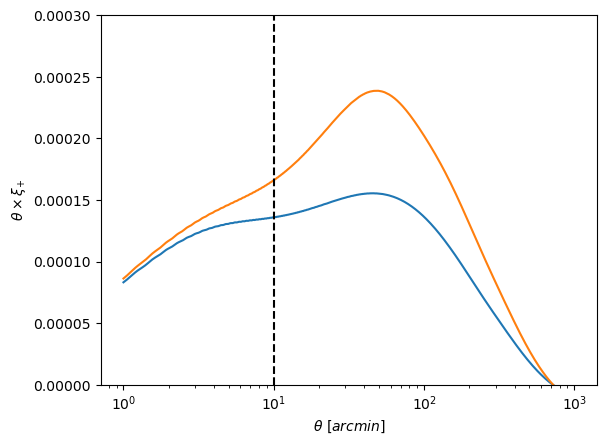

In [585]:
plt.semilogx(theta, theta*xi_p)
plt.semilogx(theta, theta*xi_p2)
plt.ylim(0, 3e-4)
plt.axvline(10, c='k', ls='--')
plt.xlabel(r'$\theta~[arcmin]$')
plt.ylabel(r'$\theta\times\xi_{+}$')

(0.0, 0.0003)

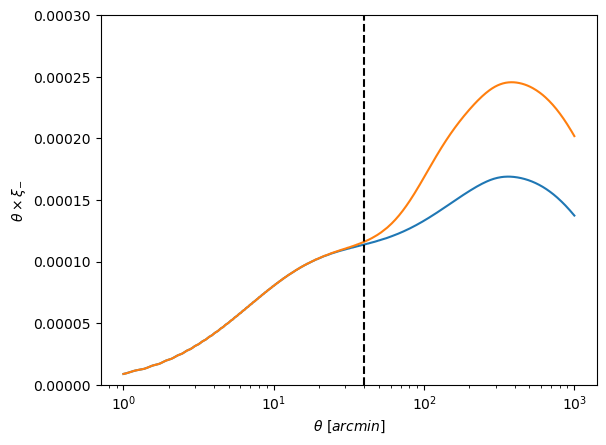

In [586]:
plt.semilogx(theta, theta*xi_m)
plt.semilogx(theta, theta*xi_m2)
plt.xlabel(r'$\theta~[arcmin]$')
plt.ylabel(r'$\theta\times\xi_{-}$')
plt.axvline(40, c='k', ls='--')
plt.ylim(0,3e-4)

In [85]:
''' general setup '''
cosmo_label = 1
cosmo_par_fmt = "/data3/suchen/CosmoGridV1/grid/cosmo_{:06d}/run_0/params.yml"

cosmo_ccl = get_cosmo_from_file(cosmo_par_fmt.format(cosmo_label), otype='ccl')

z = np.linspace(0,1.5,300)
nz = np.heaviside(z-0.99, 0) - np.heaviside(z-1.01, 0)

lens = ccl.WeakLensingTracer(cosmo_ccl, dndz=(z,nz))

ell = np.geomspace(1, 3000, 1000)
C_ell = ccl.angular_cl(cosmo_ccl, lens, lens, ell)

In [86]:
from scipy.interpolate import interp1d
C_ell_itp = interp1d(ell, C_ell, kind='cubic')

In [162]:
tmp = np.loadtxt('aux/cl_part_sky_z1.0_band32.txt')
ell_d_fid = tmp[:,0]
cl_d_fid = tmp[:,1]

(1e-07, 0.001)

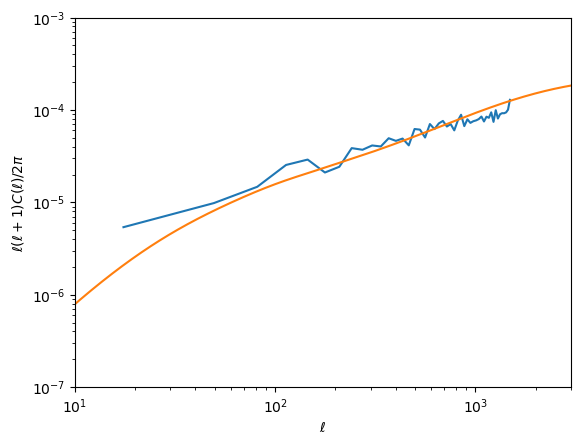

In [163]:
plt.loglog(ell_d_fid, ell_d_fid*(ell_d_fid + 1)*cl_d_fid/np.pi/2)
plt.loglog(ell, ell*(ell + 1)*C_ell/np.pi/2)
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell (\ell+1)C(\ell)/2\pi$')
plt.xlim(10, 3000)
plt.ylim(1e-7, 1e-3)

(-1.0, 1.0)

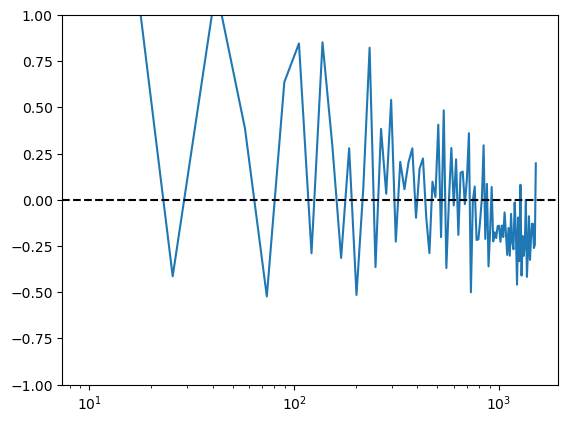

In [90]:
plt.semilogx(ell_d, cl_d/C_ell_itp(ell_d)-1)
plt.axhline(0, c='k', ls='--')
plt.ylim(-1,1)

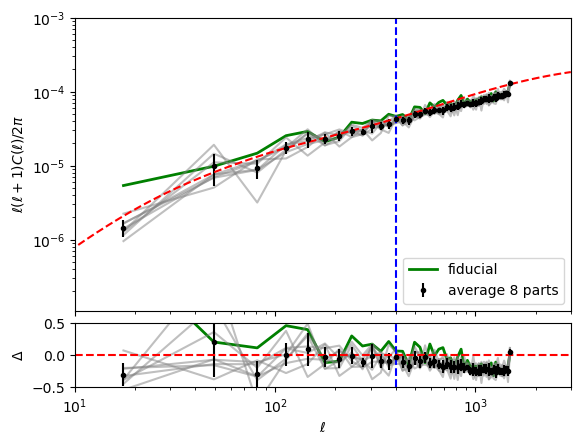

In [171]:
fig = plt.figure()
gs = GridSpec(5,5)
ax1 = fig.add_subplot(gs[:-1,:])
ax2 = fig.add_subplot(gs[-1,:])
cl_d_tot = []
ax1.loglog(ell_d_fid, ell_d_fid*(ell_d_fid + 1)*cl_d_fid/np.pi/2, c='g', lw=2, label='fiducial')
ax2.semilogx(ell_d_fid, cl_d_fid/C_ell_itp(ell_d_fid)-1, c='g', lw=2)
for i in range(8):
    tmp = np.loadtxt(f'aux/cl_part_sky_z1.0_part{i}_band32.txt')
    ell_d = tmp[:,0]
    cl_d = tmp[:,1]
    cl_d_tot.append(cl_d)
    ax1.loglog(ell_d, ell_d*(ell_d + 1)*cl_d/2/np.pi, c='grey', alpha=0.5)
    ax2.semilogx(ell_d, cl_d/C_ell_itp(ell_d)-1, c='grey', alpha=0.5)
cl_d_mean = np.mean(cl_d_tot, axis=0)
cl_d_std  = np.std(cl_d_tot, axis=0)
ax1.errorbar(ell_d, ell_d*(ell_d + 1)*cl_d_mean/np.pi/2, ell_d*(ell_d + 1)*cl_d_std/np.pi/2, fmt='.k', label='average 8 parts')
ax1.loglog(ell, ell*(ell + 1)*C_ell/np.pi/2, '--r')
ax1.set_ylabel(r'$\ell (\ell+1)C(\ell)/2\pi$')
ax1.set_xticklabels([])
ax1.axvline(400, c='b', ls='--')
ax1.legend(loc='lower right')
ax1.set_xlim(10, 3000)
ax1.set_ylim(1.1e-7, 1e-3)

ax2.errorbar(ell_d, cl_d_mean/C_ell_itp(ell_d)-1, cl_d_std/C_ell_itp(ell_d), fmt='.k')
ax2.axhline(0, c='r', ls='--')
ax2.axvline(400, c='b', ls='--')
ax2.set_xlim(10, 3000)
ax2.set_ylim(-0.5,0.5)
ax2.set_xlabel(r'$\ell$')
ax2.set_ylabel(r'$\Delta$');

#### GGLens Measurements

In [123]:
def find_matching_samples_table(ref_cat, match_cat, nside_x=64, nside_y=64):
    """
    找出 ref_cat 和 match_cat 中落在同一网格的样本点（基于 'ra', 'dec' 两列）。
    允许 x/y 方向使用不同的网格数量。

    参数:
    - ref_cat: astropy Table，参考样本，包含 'ra' 和 'dec' 列
    - match_cat: astropy Table，匹配样本，包含 'ra' 和 'dec' 列
    - nside_x: int，x方向网格数（对应 ra）
    - nside_y: int，y方向网格数（对应 dec）

    返回:
    - ref_matched: ref_cat 中在重合区域的 astropy Table 子集
    - match_matched: match_cat 中在重合区域的 astropy Table 子集
    """
    
    # 1. 提取 ra/dec 并转换为 numpy 数组
    ref_xy = np.vstack([ref_cat['ra'], ref_cat['dec']]).T
    match_xy = np.vstack([match_cat['ra'], match_cat['dec']]).T

    # 2. 合并所有坐标，确定边界
    all_points = np.vstack([ref_xy, match_xy])
    xmin, ymin = np.min(all_points, axis=0)
    xmax, ymax = np.max(all_points, axis=0)

    # 3. 网格边界（可异向）
    x_edges = np.linspace(xmin, xmax, nside_x + 1)
    y_edges = np.linspace(ymin, ymax, nside_y + 1)

    # 4. 计算网格索引
    def compute_indices(data):
        ix = np.digitize(data[:, 0], x_edges) - 1
        iy = np.digitize(data[:, 1], y_edges) - 1
        return ix, iy

    ref_ix, ref_iy = compute_indices(ref_xy)
    match_ix, match_iy = compute_indices(match_xy)

    # 5. 有效索引掩码
    def valid_mask(ix, iy, n_x, n_y):
        return (ix >= 0) & (ix < n_x) & (iy >= 0) & (iy < n_y)

    ref_mask = valid_mask(ref_ix, ref_iy, nside_x, nside_y)
    match_mask = valid_mask(match_ix, match_iy, nside_x, nside_y)

    # 6. 找出重合网格
    ref_cells = set(zip(ref_ix[ref_mask], ref_iy[ref_mask]))
    match_cells = set(zip(match_ix[match_mask], match_iy[match_mask]))
    common_cells = ref_cells & match_cells

    # 7. 选择落入重合网格的样本
    # ref_selected = [i for i, (ix, iy) in enumerate(zip(ref_ix, ref_iy)) if (ix, iy) in common_cells]
    match_selected = [i for i, (ix, iy) in enumerate(zip(match_ix, match_iy)) if (ix, iy) in common_cells]

    return match_cat[match_selected]

In [184]:
mock_gal_tb = Table()
mock_gal_tb['ra'] = mock_gal_north[:,0]
mock_gal_tb['dec'] = mock_gal_north[:,1]
mock_gal_tb['z'] = mock_gal_north[:,2]
mock_gal_tb['w8'] = mock_gal_north[:,3]

In [185]:
gcat_bossmock_matched = find_matching_samples_table(
    bg_galcat, mock_gal_tb, nside_x=500, nside_y=300
)

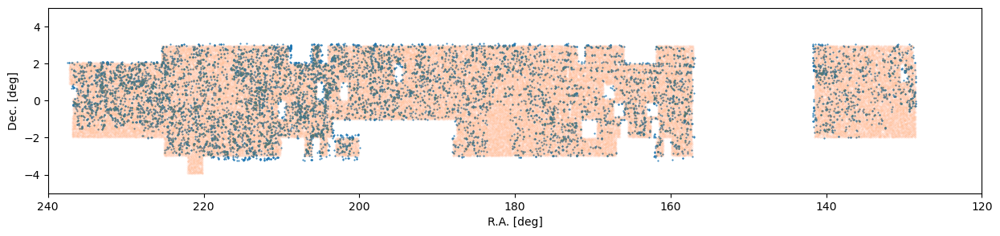

In [186]:
fig = plt.figure(figsize=(15,3))
ax = fig.add_subplot(111)
ax.scatter((gcat_bossmock_matched['ra']), (gcat_bossmock_matched['dec']), s=1, marker='.')
ax.scatter((bg_galcat['ra']), (bg_galcat['dec']), s=0.001, marker='.', alpha=0.5)
ax.set_xlim(240,120)
ax.set_ylim(-5,5)
ax.set_xlabel('R.A. [deg]')
ax.set_ylabel('Dec. [deg]');

In [187]:
from astropy.cosmology import FlatLambdaCDM
from dsigma.precompute import precompute

In [172]:
from dsigma.stacking import excess_surface_density
from dsigma.jackknife import compute_jackknife_fields, jackknife_resampling

In [199]:
hubble = cosmo_ccl.to_dict()['h']
Om0 = cosmo_ccl.omega_x(1, 'matter')

In [200]:
rp_bins = np.logspace(-1, 2, 16)
cosmology = FlatLambdaCDM(H0=100*hubble, Om0=Om0)
lens_source_cut = 0.1

In [202]:
bg_galcat_tb = Table(bg_galcat)
bg_galcat_tb.colnames

['ra', 'dec', 'z', 'sigz', 'g1', 'g2', 'w']

In [203]:
bg_galcat_tb.rename_column('g1', 'e_1')
bg_galcat_tb.rename_column('g2', 'e_2')

In [210]:
bg_galcat_tb['e_1'] = -bg_galcat_tb['e_1']

In [204]:
gcat_bossmock_matched.rename_column('w8', 'w_sys')

In [211]:
precompute(gcat_bossmock_matched, bg_galcat_tb, rp_bins, cosmology=cosmology,
                       comoving=True, lens_source_cut=lens_source_cut,
                       progress_bar=True, n_jobs=80)

100%|██████████| 4585/4585 [00:02<00:00, 2067.70it/s]


ra,dec,z,w_sys,sum 1,sum w_ls,sum w_ls e_t,sum w_ls z_s,sum w_ls e_t sigma_crit,sum w_ls sigma_crit,sum w_ls z_l,field_jk
float64,float64,float64,float64,int64[15],float64[15],float64[15],float64[15],float64[15],float64[15],float64[15],int64
228.2575,1.6764,0.2011,0.992941,0 .. 36134,0.0 .. 0.006310872965741908,0.0 .. 1.8428723317175917e-05,0.0 .. 0.0062613895026017875,0.0 .. 0.0434233930933312,0.0 .. 15.06703977546189,0.0 .. 0.0012691165534106977,62
205.7561,-0.317,0.2022,0.958861,0 .. 37320,0.0 .. 0.006572991796449544,0.0 .. 4.2193194313881735e-06,0.0 .. 0.006515852719255023,0.0 .. 0.00984198046669163,0.0 .. 15.62711967668896,0.0 .. 0.0013290589412420976,75
212.7868,-0.2071,0.203,0.973958,2 .. 36676,3.5437570350636885e-07 .. 0.006494650838236311,-7.773760725751923e-10 .. 3.103321207139631e-06,3.4621093741954536e-07 .. 0.006434389758713883,-1.9405995901315613e-06 .. 0.007335821520544765,0.0008404658381544536 .. 15.398356753493303,7.193826781179288e-08 .. 0.0013184141201619713,2
228.2628,1.0777,0.2049,1.0,0 .. 34960,0.0 .. 0.0062863030306085504,0.0 .. 1.7078458274442992e-05,0.0 .. 0.006241385465551041,0.0 .. 0.039644545464778747,0.0 .. 14.789909602768605,0.0 .. 0.001288063490971692,62
209.0944,1.4332,0.2007,0.981183,0 .. 39780,0.0 .. 0.006918258822797725,0.0 .. 2.150745824177849e-05,0.0 .. 0.006840313231882447,0.0 .. 0.050671088286203085,0.0 .. 16.552958600192987,0.0 .. 0.0013884945457355033,59
211.5346,2.8734,0.2045,0.979452,1 .. 46204,1.9886833606464858e-07 .. 0.008276715927066141,-9.333843284527403e-10 .. -4.548289930790173e-06,2.2591839622717056e-07 .. 0.00819577391583197,-2.0930407546804075e-06 .. -0.010716758565483772,0.00044594656189351725 .. 19.510838303850587,4.066857472522063e-08 .. 0.0016925884070850257,89
228.2794,1.6826,0.2011,0.992941,0 .. 36115,0.0 .. 0.006307040637292402,0.0 .. 1.8608365186492664e-05,0.0 .. 0.006255422946646163,0.0 .. 0.04384713044662979,0.0 .. 15.058586918993718,0.0 .. 0.001268345872159502,62
224.897,1.915,0.2014,0.985646,0 .. 41751,0.0 .. 0.0072976749408804305,0.0 .. 1.1920945128316485e-05,0.0 .. 0.0072235018134045375,0.0 .. 0.02833077040666066,0.0 .. 17.415149378533275,0.0 .. 0.0014697517330933187,56
228.2623,1.6823,0.2011,0.992941,0 .. 36135,0.0 .. 0.006310823734651409,0.0 .. 1.849093378561284e-05,0.0 .. 0.006260904019749078,0.0 .. 0.04356909957074005,0.0 .. 15.06718425409454,0.0 .. 0.0012691066530383984,62


In [212]:
centers = compute_jackknife_fields(
    gcat_bossmock_matched, 100, weights=np.sum(gcat_bossmock_matched['sum 1'], axis=1))

In [213]:
esd = excess_surface_density(gcat_bossmock_matched,
                             return_table=True)

for key in esd.colnames:
    esd[key].format='.4f'

esd.pprint_all()

 rp_min  rp_max     n_pairs        rp    ds_raw    ds    z_l    z_s  
  Mpc     Mpc                     Mpc                                
------- -------- -------------- ------- ------- ------- ------ ------
 0.1000   0.1585      1711.0000  0.1259 -0.1706 -0.1706 0.3143 1.0033
 0.1585   0.2512      4218.0000  0.1995 -0.0015 -0.0015 0.3102 1.0012
 0.2512   0.3981     10730.0000  0.3162 -0.2221 -0.2221 0.3131 1.0144
 0.3981   0.6310     26765.0000  0.5012  0.3572  0.3572 0.3129 1.0094
 0.6310   1.0000     66781.0000  0.7943  0.8178  0.8178 0.3127 1.0130
 1.0000   1.5849    169509.0000  1.2589  1.6450  1.6450 0.3122 1.0122
 1.5849   2.5119    425520.0000  1.9953  3.3801  3.3801 0.3124 1.0142
 2.5119   3.9811   1055441.0000  3.1623  4.5398  4.5398 0.3130 1.0135
 3.9811   6.3096   2623530.0000  5.0119  3.4600  3.4600 0.3132 1.0151
 6.3096  10.0000   6428692.0000  7.9433  2.0408  2.0408 0.3134 1.0146
10.0000  15.8489  15555941.0000 12.5893  1.3543  1.3543 0.3138 1.0149
15.8489  25.1189  36

In [214]:
esd['ds_err'] = np.sqrt(np.diag(jackknife_resampling(
        excess_surface_density, gcat_bossmock_matched, return_table=False)))

In [221]:
np.deg2rad(np.sqrt(40000/(512*12*12)))*800

10.284451245736959

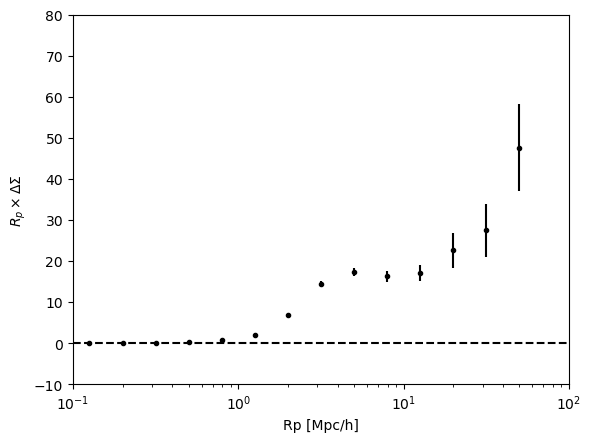

<Figure size 640x480 with 0 Axes>

In [218]:
plt.errorbar(esd['rp'], esd['rp']*esd['ds'], esd['rp']*esd['ds_err'], fmt='.k')
plt.axhline(0, c='k', ls='--')
plt.xscale('log')
plt.xlabel('Rp [Mpc/h]')
plt.ylabel(r'$R_p \times \Delta\Sigma$')
plt.xlim(0.1,100)
plt.ylim(-10,80)
plt.show()
plt.clf()

### Test FFTLog algorithm from CZ

In [54]:
import numpy as np
import numpy.fft as fft
import scipy.special as sp
from scipy.interpolate import interp1d
import sys

def windowfn(x, dlnxleft=0.46, dlnxright=0.46):
  xmin = min(x)
  xmax = max(x)
  xleft = np.exp(np.log(xmin) + dlnxleft)
  xright = np.exp(np.log(xmax) - dlnxright)
  w = np.zeros_like(x)
  w[(x > xleft) & (x < xright)] = 1

  il = (x < xleft) & (x > xmin)
  ir = (x > xright) & (x < xmax)

  rl = (x[il] - xmin) / (xleft - xmin)
  rr = (xmax - x[ir]) / (xmax - xright)
  w[il] = rl - np.sin(np.pi * 2 * rl) / (2 * np.pi) 
  w[ir] = rr - np.sin(np.pi * 2 * rr) / (2 * np.pi) 
  return w

def calc_Mellnu_jl(tt, alpha, q=0, ell=0):
  n = q - 1 - 1j * tt
  intjlttn = 2**(n-1) * np.sqrt(np.pi) * \
             np.exp(sp.loggamma((1+n+ell)/2.0) - sp.loggamma((2+ell-n)/2.0))
  A = alpha**(1j * tt - q)
  return A * intjlttn

def calc_Mellnu_Jnu(tt, alpha, q=0, nu=0):
    n = q - 1 - 1j * tt  # Mellin 变量 s = n
    M = 2**n * np.exp(
        sp.loggamma((n + nu) / 2.0) - sp.loggamma((2 - n + nu) / 2.0)
    )
    A = alpha**(1j * tt - q)
    return A * M

def calc_phi(pk, k0, N, L, q):
  k = k0 * np.exp(np.arange(0,N) * 2 * np.pi / L)
  P = pk(k)
  kpk = (k / k0)**(3-q) * P * windowfn(k)
  phi = np.conj(fft.rfft(kpk)) / L
  phi *= windowfn(k)[len(k) - len(phi):]
  return phi

def xicalc(pk, N=1000, kmin=1e-4, kmax=1e-4, r0=1e-4):
  '''Arguments:
  pk: callable
  N: number of grids for FFT
  kmin, kmax: k range
  r0: minimum r value (~1/kmax)
  '''
  qnu = 1.95
  N2 = int(N / 2) + 1
  k0 = kmin
  G = np.log(kmax / kmin)
  alpha = k0 * r0
  L = 2 * np.pi * N / G

  tt = np.arange(0, N2) * 2 * np.pi / G
  rr = r0 * np.exp(np.arange(0, N) * (G / N))
  prefac = k0**3 / (np.pi * G) * (rr / r0)**(-qnu)

  Mellnu = calc_Mellnu_jl(tt, alpha, qnu)
  phi = calc_phi(pk, k0, N, L, qnu)

  xi = prefac * fft.irfft(phi * Mellnu, N) * N
  return rr, xi

def dsigmacalc(pk, N=1000, kmin=1e-4, kmax=1e-4, r0=1e-4):
  '''Arguments:
  pk: callable
  N: number of grids for FFT
  kmin, kmax: k range
  r0: minimum r value (~1/kmax)
  '''
  qnu = 1.95
  N2 = int(N / 2) + 1
  k0 = kmin
  G = np.log(kmax / kmin)
  alpha = k0 * r0
  L = 2 * np.pi * N / G

  tt = np.arange(0, N2) * 2 * np.pi / G
  rr = r0 * np.exp(np.arange(0, N) * (G / N))
  prefac = k0**3 / (np.pi * G) * (rr / r0)**(-qnu)

  Mellnu = calc_Mellnu_Jnu(tt, alpha, qnu, nu=2)
  phi = calc_phi(pk, k0, N, L, qnu)

  xi = prefac * fft.irfft(phi * Mellnu, N) * N
  return rr, xi

In [45]:
cosmo_test = ccl.Cosmology(h=0.7, Omega_b=0.05, Omega_c=0.25, n_s=0.9667, sigma8=0.831)

In [46]:
k = np.logspace(-3,1,1000)
pk = ccl.nonlin_matter_power(a=1/(1.3), cosmo=cosmo_test, k=k*0.7)
pk *= 0.7**3

In [47]:
nk = len(k) * 5
rmin = np.pi / k.max()

fpk = interp1d(k, pk, kind='cubic')

r, xi = xicalc(fpk, nk, k.min(), k.max(), rmin)

(0.0, 200.0)

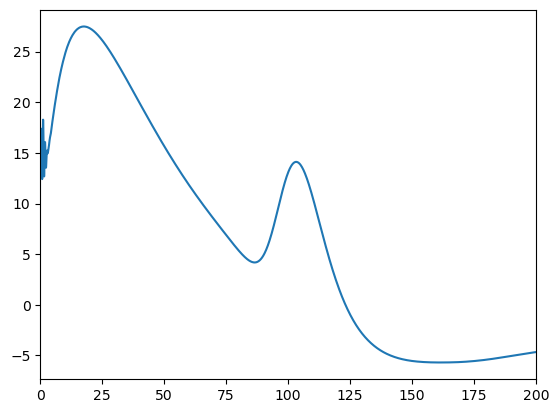

In [48]:
plt.plot(r, xi*r**2)
plt.xlim(0,200)

In [55]:
nk = len(k) * 5
rmin = np.pi / k.max()

fpk = interp1d(k, pk, kind='cubic')

r, dsigma = dsigmacalc(fpk, nk, k.min(), k.max(), rmin)

(0.1, 100)

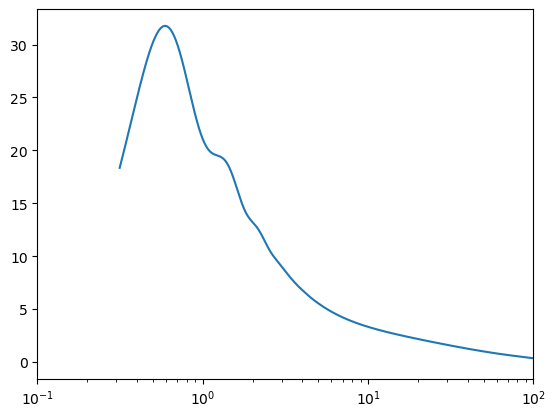

In [58]:
plt.semilogx(r, r*dsigma)
plt.xlim(1e-1,100)